<p style="font-size:3em">Customer Segmentation for a marketplace platform</p>

<br/>

This notebook corresponds to the second part of the **5th project of my data scientist path** with **OpenClassrooms/CentralSupelec** 

This project aims to provide the necessary skills to implement data clustering through unsupervised classification algorithm

This notebook contains the following steps:<br/>

* Create cluster evaluation functions (for interpretability) :
    * Show customer repartition in each cluster
    * Show cluster charateristics (features significantly above or under the global average on the cluster )
    * Plot average value of each cluster for each feature 


* Train and compare each algorithm :
    * Algorithms used : 
        * **Kmeans**
        * **GaussianMixtureModel**
        * **Agglomerative Clustering**
        * **DBSCAN**
    * Observe the silhouette coef of each model for a range of cluster number (for ex between 2 and 20 clusters)
    * Obersv the clusters in 2 dimension (**PCA and TSNE** reduction)
    * Assess Clusters performance through the above mentionned evaluation function 
 
 
* Evaluate temporal stability of the chosen solution
    * Use **Adjusted Rand** Score between 2 different time range to evaluate customer clustering matches
    * Observ customer clustering changes through **sankey Graphs**
___
<b>I strongly recommend to use the 'table of content' extension of Jupyter to navigate through this notebook </b>

# Imports

In [5]:
#import packages

import pandas as pd
import numpy as np 
import matplotlib.pyplot as plt
import seaborn as sns
import math
import pickle
import plotly.graph_objects as go

from sklearn import metrics, cluster, decomposition, mixture
from sklearn.neighbors import NearestNeighbors
from sklearn.preprocessing import StandardScaler
from scipy import spatial,stats
from sklearn.manifold import TSNE

%matplotlib inline

In [ ]:
%load_ext pycodestyle_magic

In [ ]:
%pycodestyle_on

In [618]:
data= pd.read_csv("data_first20k.csv", index_col = 'customer_unique_id')
data.dropna(inplace=True)
data

,nb_of_orders,recency,nb_of_items,dist_seller_customer,product_category_name_art_and_music,product_category_name_baby,product_category_name_books,product_category_name_cosmetic,product_category_name_fashion,product_category_name_food_and_drink,...,purchasing_month_January,purchasing_month_July,purchasing_month_June,purchasing_month_March,purchasing_month_May,purchasing_month_November,purchasing_month_October,purchasing_month_September,lat_customer,long_customer
customer_unique_id,,,,,,,,,,,,,,,,,,,,,
0000f46a3911fa3c0805444483337064,1,1,1.0,517.477152,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,1,0,0,0,0,-27.543787,-48.625680
0005e1862207bf6ccc02e4228effd9a0,1,1,1.0,245.667440,0.0,0.0,0.0,0.0,1.0,0.0,...,0,0,0,1,0,0,0,0,-22.403254,-43.001980
0006fdc98a402fceb4eb0ee528f6a8d4,1,0,1.0,776.359877,0.0,0.0,0.0,0.0,0.0,0.0,...,0,1,0,0,0,0,0,0,-21.061422,-41.371778
000a5ad9c4601d2bbdd9ed765d5213b3,1,0,1.0,837.051657,0.0,0.0,0.0,1.0,0.0,0.0,...,0,0,0,0,0,0,0,0,-30.017690,-51.191212
000de6019bb59f34c099a907c151d855,1,0,2.0,258.358625,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,-23.826105,-45.435803
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
fff1afc79f6b5db1e235a4a6c30ceda7,1,0,1.0,726.939361,0.0,0.0,0.0,1.0,0.0,0.0,...,0,0,0,0,0,0,0,0,-27.634768,-52.280294
fff3a9369e4b7102fab406a334a678c3,1,0,1.0,741.236998,0.0,0.0,0.0,0.0,1.0,0.0,...,0,0,0,0,0,0,0,0,-15.799190,-47.870102
fffcf5a5ff07b0908bd4e2dbc735a684,1,0,2.0,1997.315822,0.0,0.0,0.0,1.0,0.0,0.0,...,0,0,1,0,0,0,0,0,-8.363166,-36.559088


In [10]:
first_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 21353 entries, f7b981e8a280e455ac3cbe0d5d171bd1 to 4b476c0a6208199a5adbc2dbfef96e44
Data columns (total 42 columns):
 #   Column                                    Non-Null Count  Dtype  
---  ------                                    --------------  -----  
 0   nb_of_orders                              21353 non-null  int64  
 1   nb_of_items                               21353 non-null  float64
 2   dist_seller_customer                      21353 non-null  float64
 3   product_category_name_art_and_music       21353 non-null  float64
 4   product_category_name_baby                21353 non-null  float64
 5   product_category_name_books               21353 non-null  float64
 6   product_category_name_cosmetic            21353 non-null  float64
 7   product_category_name_fashion             21353 non-null  float64
 8   product_category_name_food_and_drink      21353 non-null  float64
 9   product_category_name_furniture           21353 non-

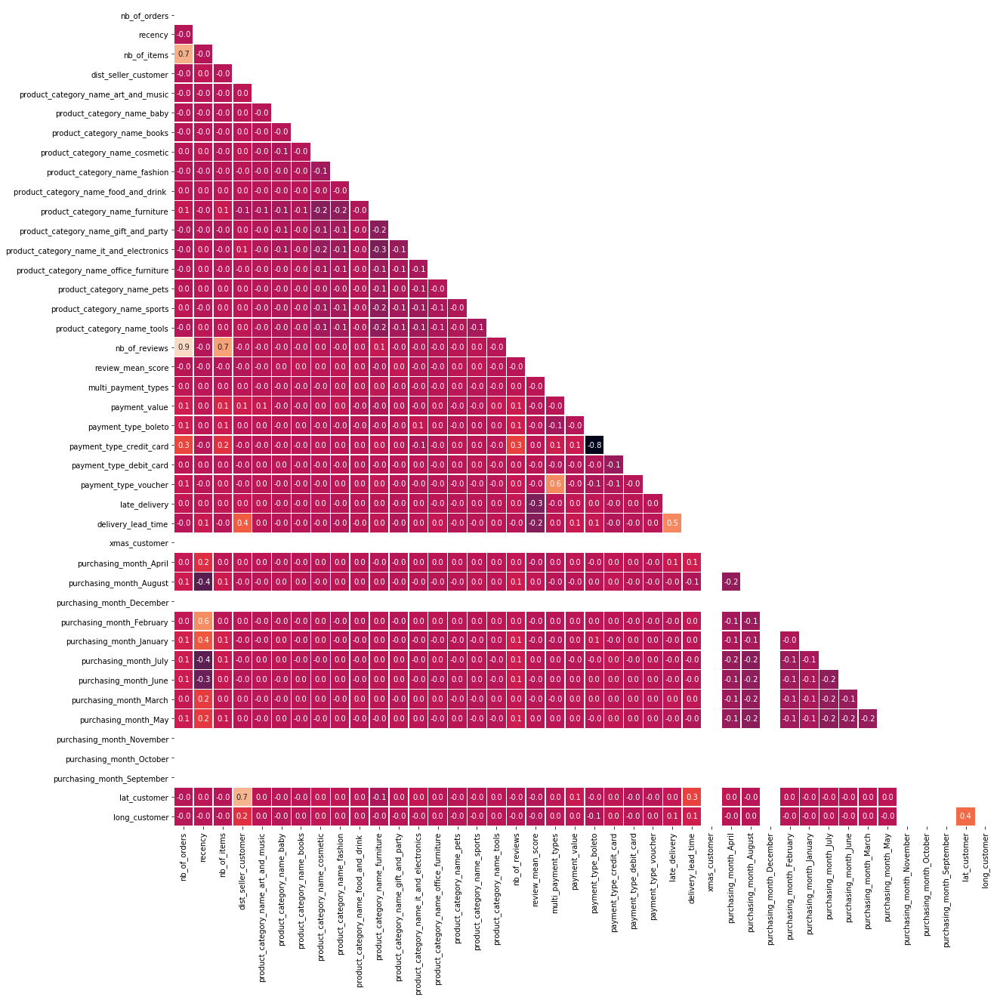

In [627]:
# Here is a mask to prevent the top right part of the following chart from appearing 
# As it is the symmetry of the bottom-left part we do not need to display it 
corr = data.corr()
mask = np.zeros_like(corr)
mask[np.triu_indices_from(mask)] = True

# Display pearson coef between to feature (1 means very high correlation, 0 no correlation)
plt.figure(figsize=(20, 20))
plt.xticks(rotation = 45)

sns.heatmap(corr,
            annot = True,
            mask = mask,
            fmt='.1f',
            linewidths=.5,
            square=True,
            cbar=False)

Here we have some missing features (month_purchase and xmas_customer) due to the range observed (jan2017 - august2017)

# Cluster Analysis functions

Here are the function we will use to analyse our clusters

## General Analysis

Here the function will execute the following task : 
   * Plot the number of customer per cluster (along with the percentage of total amount of customer)
   * Iterate on each cluster, showing for each cluster :
       * the features with a mean value higher on the cluster than global mean
       * the features with a mean value lower on the cluster than global mean 
   => This will help understanding the caracteristics of each cluster

Function parameters: 
   * cluster : the cluster used (after fitting on data)
   * cluster_label : a list of corresponding label for each sample of our data
   * data : data corresponding to the labels
   * tol : float between 0 and 1 corresponding to the percentage of difference to use as a threshold between cluser mean and global mean
   
**The function return a summary dataframe that contains for each cluster the "higher" feature and "lower" feature**
  

In [377]:
def cluster_analysis(cluster,cluster_label,data,tol):
    
    summary=pd.DataFrame(index=range(len(np.unique(cluster_label).tolist())),
                         columns=['features_higher','features_lower'])
    
    print('Analysis of clusters using: {}\n_______________________\n'.format(cluster))
   
    # Plot the number of sample by cluster
    view_clusters = pd.Series(cluster_label)
    plt.figure(figsize=[12,8])
    sns.barplot(x=view_clusters.value_counts().sort_index(ascending=True).index,
                y=view_clusters.value_counts().sort_index(ascending=True).values,
                color='steelblue')
    plt.title('Number of sample by cluster',fontsize=15)
    plt.ylabel('Number of sample',fontsize=15)
    plt.xlabel('Cluster ID',fontsize=15)
        
    row_data=data.shape[0]
    for index, value in enumerate(view_clusters.value_counts().sort_index(ascending=True)):
        percentage = np.around(value/row_data*100,1)   
        plt.text(index-0.25, value+100, str(percentage)+' %',fontsize=15)
    
    plt.show()
    
    # Write the important feature for each cluster
    higher=[] # List which will contain the features with a higher mean than the global mean (for each cluster)
    lower=[] # List which will contain the features with a lower mean than the global mean (for each cluster)
    
    list_cluster = view_clusters.value_counts().sort_index(ascending=True).index
    print(list_cluster)

    for clust in list_cluster:
        print('Cluster ID: {}\n'.format(clust))
        for col in data.columns:
            mean_original = data[col].mean()
            mean_cluster = data.loc[data.index[cluster_label == clust],col].mean()

            if mean_original > 0.5:
                diff = (mean_cluster - mean_original)/mean_original
            else : 
                diff = mean_cluster - mean_original


            if diff > tol : 
                higher.append(col)
            elif diff< -tol: 
                lower.append(col)
            else: 
                pass
        print('Feature with higher values: {}'.format(higher))
        print('Feature with lower values: {}\n\n'.format(lower))
        
        summary.iloc[clust,0]=str(higher)
        summary.iloc[clust,1]=str(lower)
        higher=[]
        lower=[]
        
    print('Analysis Done')
    
    return summary
    

## Displot distribution of each feature for each cluster

Here the function will execute the following task : 
   * Iterate on each feature showing the mean value of each cluster for this feature 
   
Function parameters: 
   * cluster_label : a list of corresponding label for each sample of our data
   * data : data corresponding to the labels

  

In [308]:
def cluster_distribution(cluster_labels,data):
    
    data_study=data.copy()
    data_study['labels']=cluster_labels
    
    for col in data.columns:
        plt.figure(figsize=(7,5))
        plt.title('Boxplot of {} for each cluster'.format(str(col)) )
        sns.barplot(x = 'labels',
                    y = col,
                    data = data_study)
        plt.show()    



# Clustering algorithm selection

This section corresponds to the selection of the clustering algorithm.

Here we will use a dataframe corresponding to the activity observed between jan 2017 and august 2017

The pattern we will use for each cluster algorithm selection will be as follow:
    
   * 1) Evaluate the silhouette obtain for a range of clusters (for 2 to 20 clusters most of the time)
   * 2) Evaluate the stability of the clustering algorithm with multiple iteration (observ if some variance can be spotted)
   * 3) Represent the most promising clusters via PCA and t-SNE
   * 4) Evaluate the cluster relevance via our cluster_analysis functions 
   
Once all this is done, we can either determine which clustering algorithm (and which parameters) is the most relevant for our case, or (if the results aren't satisfying) we can change the input feature and start over
    

___
3 differents set of features were observed : 

 * 1) **All features** (unfortunattely this part is not showed anymore in this notebook). The performance where quite disappointing, so some features needed to be dropped
  
 * 2) **All feature, without data_based features.** As we do not have complete cycles (only 1 year and a half on the total database) it is not really relevent to keep it
 
 * 3) **All feature, without data_based features and without the product categories.** The product categories have a tendancy to take too much importance when creating clusters, which prevents some other feature to be sufficiently taken into account
 
**The third option is the one which is chosen eventually**


**/!\ Finally note that,as the pattern is the same in section 3.1 and 3.2, the process'comments will not be repeated in section 3.2 /!\**



## All features, without time_based_features

In [644]:
first_data= pd.read_csv("data_first20k.csv", index_col = 'customer_unique_id')
first_data.dropna(inplace=True)
first_data

,nb_of_orders,recency,nb_of_items,dist_seller_customer,product_category_name_art_and_music,product_category_name_baby,product_category_name_books,product_category_name_cosmetic,product_category_name_fashion,product_category_name_food_and_drink,...,purchasing_month_January,purchasing_month_July,purchasing_month_June,purchasing_month_March,purchasing_month_May,purchasing_month_November,purchasing_month_October,purchasing_month_September,lat_customer,long_customer
customer_unique_id,,,,,,,,,,,,,,,,,,,,,
0000f46a3911fa3c0805444483337064,1,1,1.0,517.477152,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,1,0,0,0,0,-27.543787,-48.625680
0005e1862207bf6ccc02e4228effd9a0,1,1,1.0,245.667440,0.0,0.0,0.0,0.0,1.0,0.0,...,0,0,0,1,0,0,0,0,-22.403254,-43.001980
0006fdc98a402fceb4eb0ee528f6a8d4,1,0,1.0,776.359877,0.0,0.0,0.0,0.0,0.0,0.0,...,0,1,0,0,0,0,0,0,-21.061422,-41.371778
000a5ad9c4601d2bbdd9ed765d5213b3,1,0,1.0,837.051657,0.0,0.0,0.0,1.0,0.0,0.0,...,0,0,0,0,0,0,0,0,-30.017690,-51.191212
000de6019bb59f34c099a907c151d855,1,0,2.0,258.358625,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,-23.826105,-45.435803
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
fff1afc79f6b5db1e235a4a6c30ceda7,1,0,1.0,726.939361,0.0,0.0,0.0,1.0,0.0,0.0,...,0,0,0,0,0,0,0,0,-27.634768,-52.280294
fff3a9369e4b7102fab406a334a678c3,1,0,1.0,741.236998,0.0,0.0,0.0,0.0,1.0,0.0,...,0,0,0,0,0,0,0,0,-15.799190,-47.870102
fffcf5a5ff07b0908bd4e2dbc735a684,1,0,2.0,1997.315822,0.0,0.0,0.0,1.0,0.0,0.0,...,0,0,1,0,0,0,0,0,-8.363166,-36.559088


In [645]:
first_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 21353 entries, 0000f46a3911fa3c0805444483337064 to ffffd2657e2aad2907e67c3e9daecbeb
Data columns (total 43 columns):
 #   Column                                    Non-Null Count  Dtype  
---  ------                                    --------------  -----  
 0   nb_of_orders                              21353 non-null  int64  
 1   recency                                   21353 non-null  int64  
 2   nb_of_items                               21353 non-null  float64
 3   dist_seller_customer                      21353 non-null  float64
 4   product_category_name_art_and_music       21353 non-null  float64
 5   product_category_name_baby                21353 non-null  float64
 6   product_category_name_books               21353 non-null  float64
 7   product_category_name_cosmetic            21353 non-null  float64
 8   product_category_name_fashion             21353 non-null  float64
 9   product_category_name_food_and_drink      21353 non-

In [646]:
col_to_drop=first_data.columns[first_data.columns.str.contains('purchasing_month')|
                               first_data.columns.str.contains('xmas')]
col_to_drop=col_to_drop.tolist()

first_data.drop(columns=col_to_drop,inplace=True)

In [647]:
first_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 21353 entries, 0000f46a3911fa3c0805444483337064 to ffffd2657e2aad2907e67c3e9daecbeb
Data columns (total 30 columns):
 #   Column                                    Non-Null Count  Dtype  
---  ------                                    --------------  -----  
 0   nb_of_orders                              21353 non-null  int64  
 1   recency                                   21353 non-null  int64  
 2   nb_of_items                               21353 non-null  float64
 3   dist_seller_customer                      21353 non-null  float64
 4   product_category_name_art_and_music       21353 non-null  float64
 5   product_category_name_baby                21353 non-null  float64
 6   product_category_name_books               21353 non-null  float64
 7   product_category_name_cosmetic            21353 non-null  float64
 8   product_category_name_fashion             21353 non-null  float64
 9   product_category_name_food_and_drink      21353 non-

In [648]:
std = StandardScaler()
first_data_scaled = std.fit_transform(first_data)

First, let's setup one PCA representation and one t-SNE representation for our data, so as to be able to observe our clusters in 2 dimensions

### PCA setup

In [649]:
pca = decomposition.PCA(n_components=2)
pca.fit(first_data_scaled)
print(pca.explained_variance_ratio_.cumsum())
first_data_trans = pca.transform(first_data_scaled)

[0.09300273 0.17150254]


In [650]:
len(pca.components_[0,:])

30

[ 0.56954586 -0.02373441  0.50128682 -0.03280328 -0.0022598  -0.0132311
 -0.01263384 -0.00518097 -0.0037413   0.00859081  0.08101462 -0.03775383
 -0.05015644 -0.01282501  0.0021931   0.01530629 -0.01299648  0.55368627
 -0.01224357  0.05027465 -0.          0.10411925 -0.06859941  0.28493798
 -0.01211221  0.05464471  0.02330517 -0.01623502 -0.         -0.03128866
 -0.01605115] 
 [ 0.02117198  0.04692149  0.01654116  0.51825635  0.03043349 -0.0150783
 -0.00728325  0.03981428  0.00086369  0.00398031 -0.07481504 -0.01938389
  0.04985895  0.01995416 -0.00919579 -0.00065268  0.0260973   0.02052252
 -0.18515959  0.02041317 -0.          0.11218351  0.00886573  0.00731276
 -0.03105336  0.00718102  0.28419582  0.45160406 -0.          0.53034702
  0.31814909]


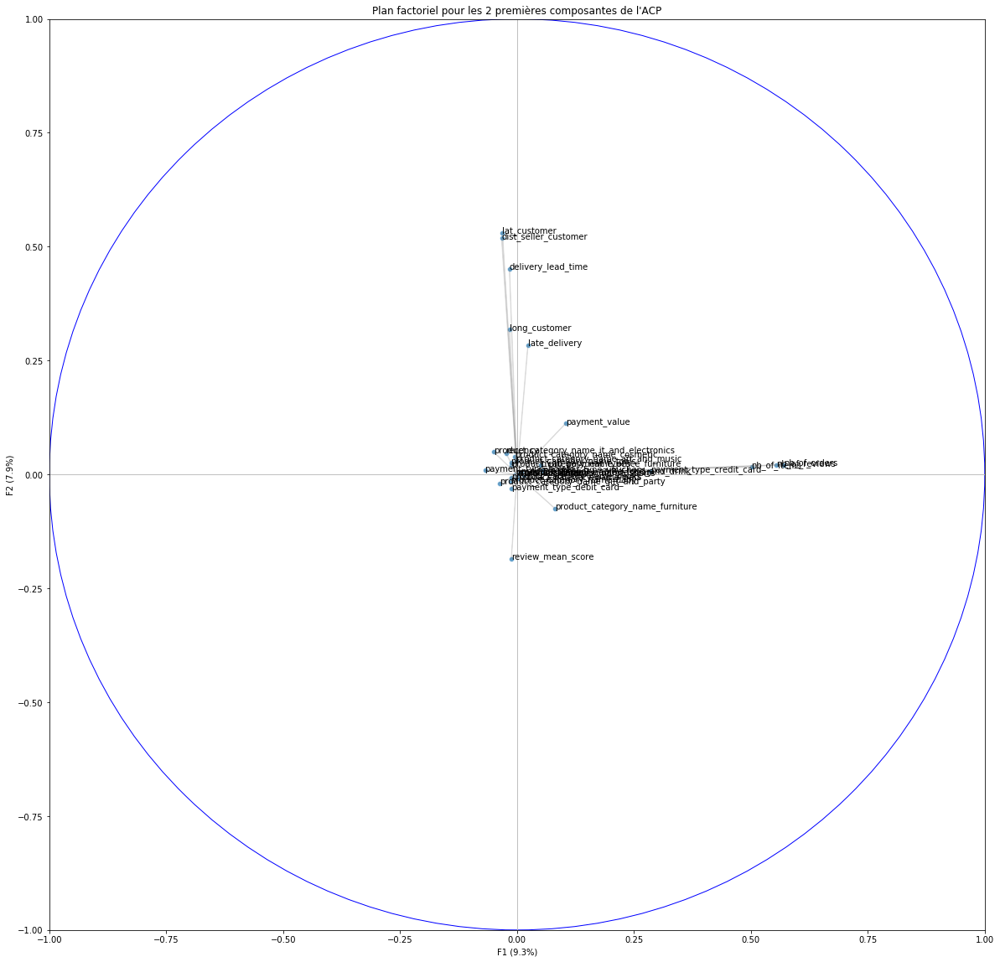

In [208]:
# Represent the importance of each feature for the 2 first components of our PCA
xpca =pca.components_[0,:]
ypca =pca.components_[1,:]

print(pca.components_[0,:],'\n',pca.components_[1,:])
fig, axes = plt.subplots(figsize=(20,20))

plt.title("Plan factoriel pour les 2 premières composantes de l'ACP")
plt.xlabel('F1 ({}%)'.format(np.around(pca.explained_variance_ratio_[0]*100,1)))
plt.ylabel('F2 ({}%)'.format(np.around(pca.explained_variance_ratio_[1]*100,1)))

axes.set_xlim(-1,1)
axes.set_ylim(-1,1)
cercle = plt.Circle((0,0),1,color='blue',fill=False)
axes.add_artist(cercle)

plt.plot([-1,1],[0,0],color='silver',linestyle='-',linewidth=1)
plt.plot([0,0],[-1,1],color='silver',linestyle='-',linewidth=1)

sns.scatterplot(x= xpca, y= ypca ,alpha = 0.7)

for i in range(len(first_data.columns)):
    plt.annotate(first_data.columns[i], (xpca[i],ypca[i]))
    axes.arrow(0, 0, xpca[i], ypca[i], head_width=0, head_length=0, fc='grey', ec='grey',alpha=0.2)

### TSNE setup

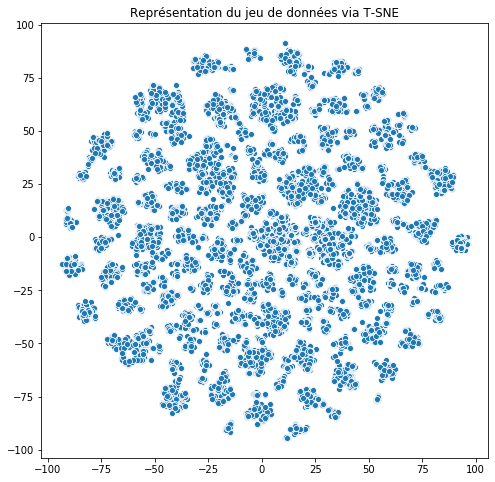

In [30]:
# First representation of our data via t-SNE (basic perplexity = 30 )
tsne = TSNE(n_components=2)
first_data_TSNE = tsne.fit_transform(first_data_scaled.copy())

plt.figure(figsize=(8,8))
plt.title('Représentation du jeu de données via T-SNE')
sns.scatterplot(first_data_TSNE[:,0], first_data_TSNE[:,1])

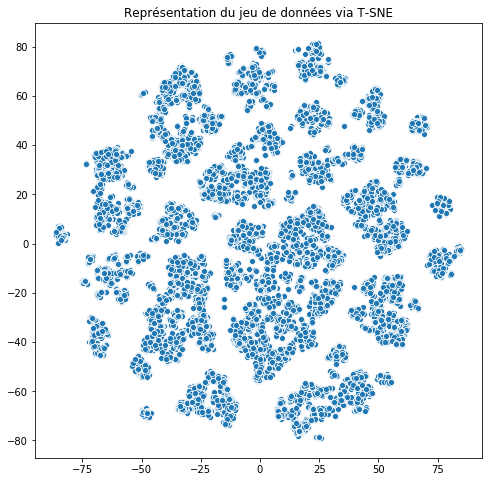

In [651]:
# Trying to represent our data via t-SNE with higher perplexity (= 50 )
tsne = TSNE(n_components=2,perplexity=50)
first_data_TSNE3 = tsne.fit_transform(first_data_scaled.copy())

plt.figure(figsize=(8,8))
plt.title('Représentation du jeu de données via T-SNE')
sns.scatterplot(first_data_TSNE3[:,0], first_data_TSNE3[:,1])

### Kmeans 

#### Silhouette

In [202]:
summary_silhouettes=pd.DataFrame()
silhouettes=[]

# Create a loop of 5 iteration (to observ stability)
for k in range(5):
    # Create a loop of to observ the result for each number of clusters chosen
    for i in range(2,20):
        cls= cluster.KMeans(n_clusters=i)
        cls.fit(first_data_scaled)
        silh= metrics.silhouette_score(first_data_scaled,cls.labels_)
        silhouettes.append(silh)
        
    summary_silhouettes['sil{}'.format(k)]=silhouettes
    silhouettes=[]

summary_silhouettes

,sil0,sil1,sil2,sil3,sil4
0,0.241828,0.468026,0.468026,0.468026,0.468026
1,0.131406,0.204773,0.113972,0.259773,0.131361
2,0.087304,0.061051,0.046905,0.082203,0.119066
3,0.098822,0.147426,0.195077,0.098148,0.098206
4,0.122927,0.128715,0.100263,0.114725,0.123248
5,0.064043,0.135938,0.137045,0.107995,0.132018
6,0.121321,0.165394,0.187856,0.178214,0.136573
7,0.176502,0.184527,0.201310,0.215027,0.155813
8,0.216438,0.249078,0.191292,0.199157,0.227637
9,0.221105,0.196131,0.249733,0.240339,0.213694


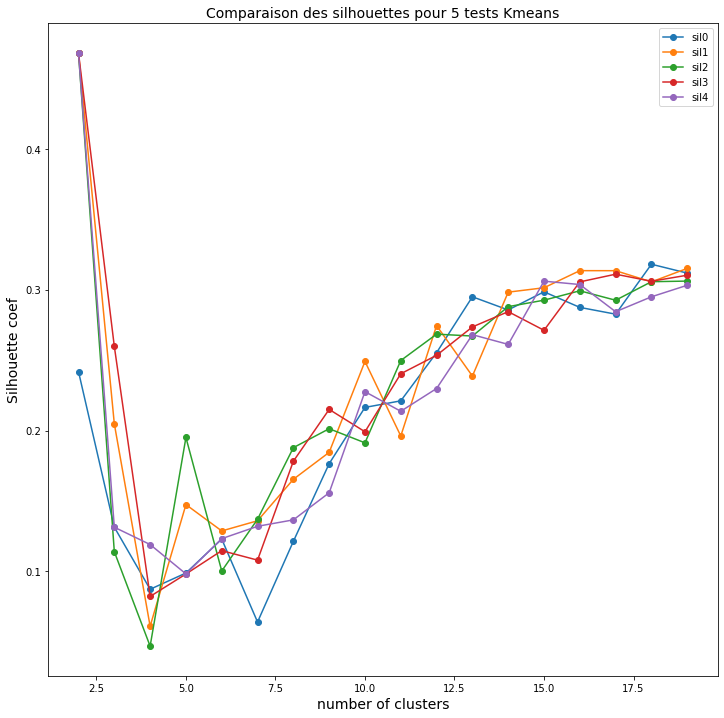

In [203]:
# Plot the result obtained above 
plt.figure(figsize=[12,12])
for col in summary_silhouettes.columns:
    plt.plot(range(2,20),summary_silhouettes[col],marker='o',label=col)
plt.title('Comparaison des silhouettes pour 5 tests Kmeans',fontsize=14)
plt.xlabel('number of clusters',fontsize=14)
plt.ylabel('Silhouette coef',fontsize=14)
plt.legend()


Ici on observe de très bon résultat pour peu de clusters, un forte baisse entre 3 et 6 cluster puis une remonté progressive par la suite.
Ici on observera donc la tendance pour un faible nombre de clusters (2) et pour un nombre plus conséquent (8-10)

On peut également noter que la stabilité est plutôt médiocre pour un faible nombre de cluster et s'améliore beaucoup au dessu de 7 clusters

#### Davies-Bouldin Score

In [204]:
summary_DBS=pd.DataFrame()
DBScore=[]

for k in range(5):
    
    for i in range(2,20):
        cls= cluster.KMeans(n_clusters=i)
        cls.fit(first_data_scaled)
        db_score= metrics.davies_bouldin_score(first_data_scaled,cls.labels_)
        DBScore.append(db_score)
        
    summary_DBS['dbs{}'.format(k)]=DBScore
    DBScore=[]

summary_DBS

,dbs0,dbs1,dbs2,dbs3,dbs4
0,1.210380,2.954597,1.210380,1.210380,2.900809
1,2.126840,2.628818,2.090957,2.680037,2.090957
2,2.216342,2.420723,1.753839,2.191070,2.509904
3,2.328581,2.364610,1.960445,2.273348,1.769081
4,2.331040,1.694133,1.511201,1.824177,1.865508
5,2.109744,1.495397,1.748984,2.007115,1.892209
6,1.670243,1.728923,1.677482,1.895986,1.819315
7,1.790151,1.592279,1.956244,1.737331,1.703312
8,1.660054,1.663664,1.461932,1.553974,1.851893
9,1.469625,1.519442,1.482682,1.617904,1.482245


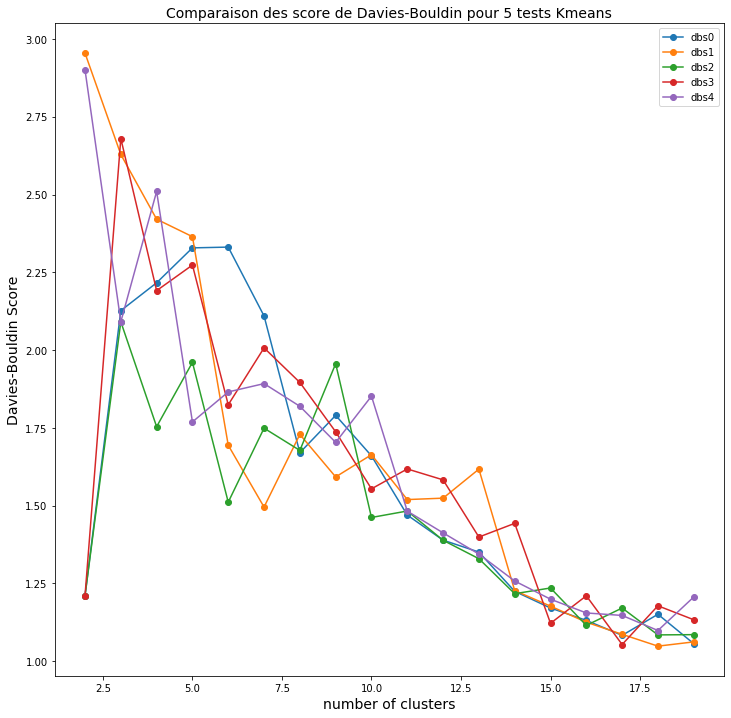

In [205]:
plt.figure(figsize=[12,12])
for col in summary_DBS.columns:
    plt.plot(range(2,20),summary_DBS[col],marker='o',label=col)
plt.title('Comparaison des score de Davies-Bouldin pour 5 tests Kmeans',fontsize=14)
plt.xlabel('number of clusters',fontsize=14)
plt.ylabel('Davies-Bouldin Score',fontsize=14)
plt.legend()


Ici on a la même tendance que pour la silhouette mais inversée, en effet l'indice de Davies-Bouldin montre des clusters performants en termes de forme lorsque celui-ci est faible 

#### Kmeans - 2 Clusters

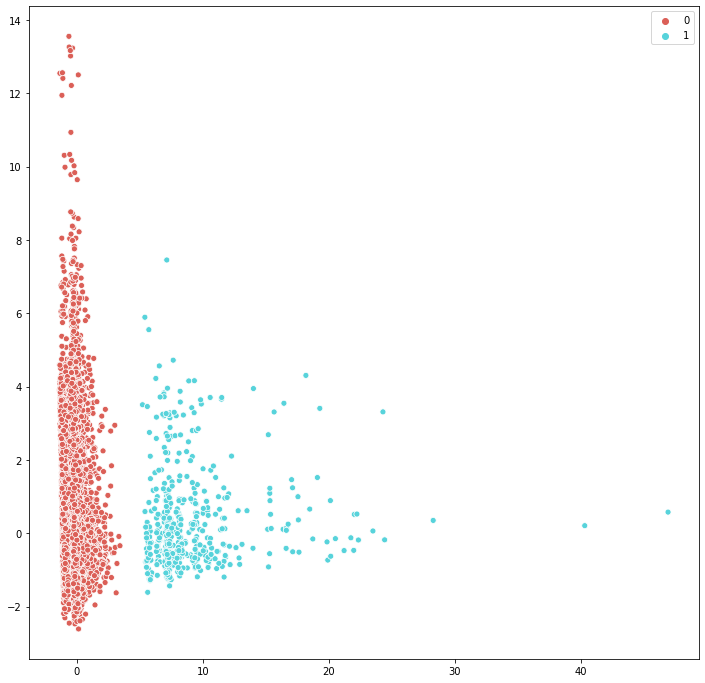

In [664]:
# Let's represent our data with the 2 first PCA components, with using a different colour for each cluster
fig = plt.figure(figsize=[12,12])

cls2 = cluster.KMeans(n_clusters=2)
cls2.fit(first_data_scaled)
sns.scatterplot(first_data_trans[:,0 ],
                first_data_trans[:,1],
                hue=cls2.labels_,
                legend='full',
                palette=sns.color_palette("hls", 2))

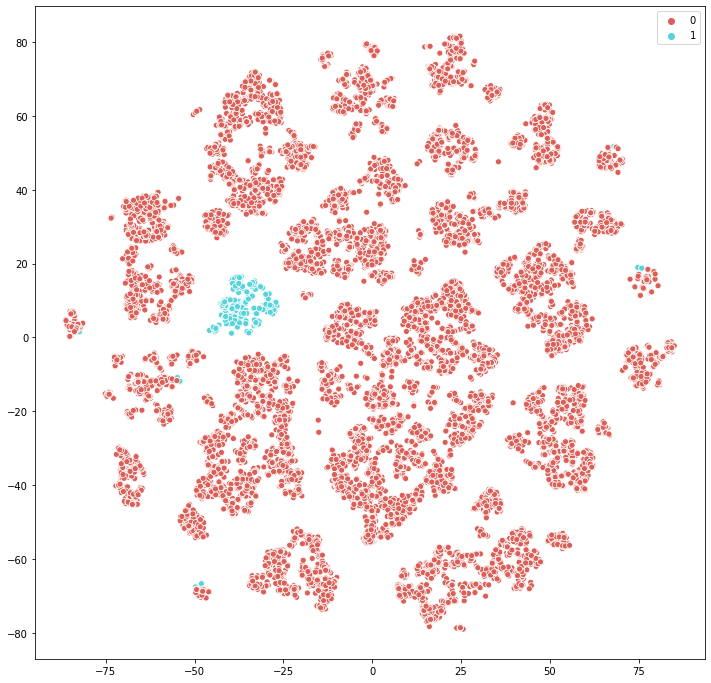

In [666]:
# Let's represent our data with the t-SNE method, with using a different colour for each cluster
fig = plt.figure(figsize=[12,12])
sns.scatterplot(first_data_TSNE3[:,0 ],
                first_data_TSNE3[:,1],
                hue=cls2.labels_,
                legend='full',
                palette=sns.color_palette("hls",2))
plt.legend()

Analysis of clusters using: KMeans(n_clusters=2)
_______________________



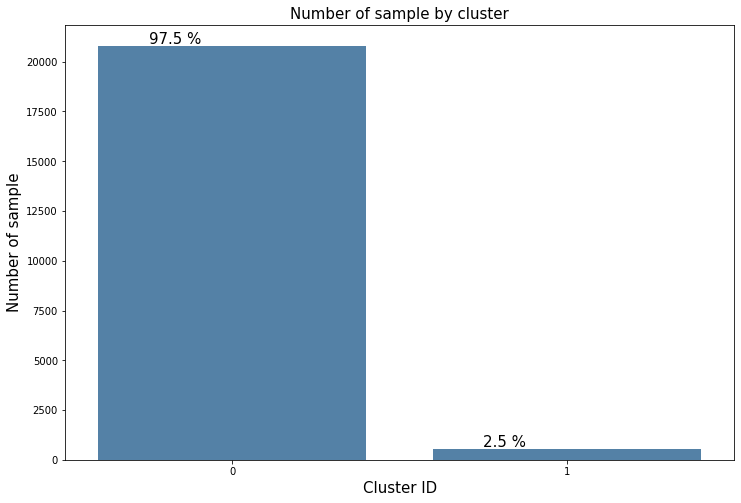

Int64Index([0, 1], dtype='int64')
Cluster ID: 0

Feature with higher values: []
Feature with lower values: []


Cluster ID: 1

Feature with higher values: ['nb_of_orders', 'nb_of_items', 'nb_of_reviews', 'payment_value', 'payment_type_credit_card', 'payment_type_voucher']
Feature with lower values: ['lat_customer', 'long_customer']


Analysis Done


,features_higher,features_lower
0,[],[]
1,"['nb_of_orders', 'nb_of_items', 'nb_of_reviews...","['lat_customer', 'long_customer']"


In [667]:
cluster_analysis(cls2,cls2.labels_,first_data,0.20)

Despite a very good silhouette score, we can observ here that almost the entire population of customer is gathered in one of the two cluster. This is not relevant. This is a quite good example to show the limit of this metrics when taken alone.

**We will not be interested in taking a small number of clusters here** 


#### Kmeans - 8 Clusters

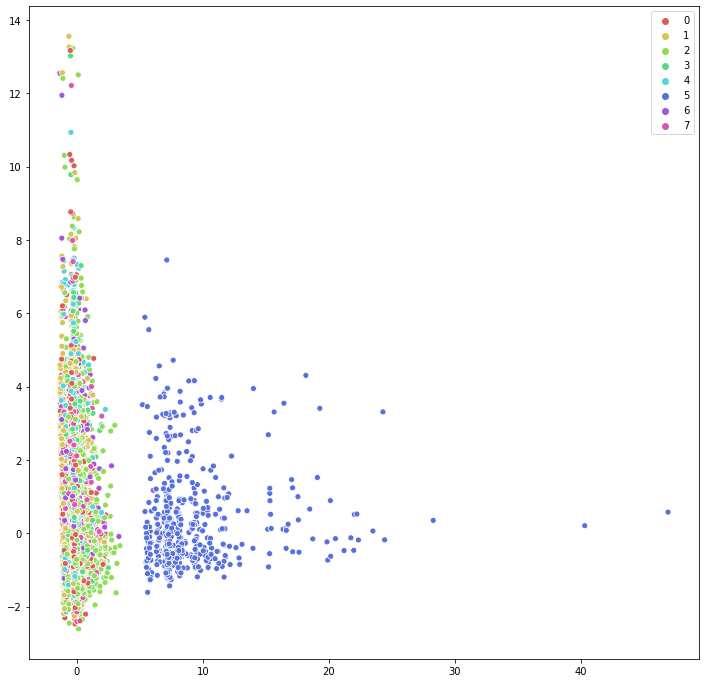

In [652]:
fig = plt.figure(figsize=[12,12])

cls8 = cluster.KMeans(n_clusters=8)
cls8.fit(first_data_scaled)
sns.scatterplot(first_data_trans[:,0 ],
                first_data_trans[:,1],
                hue=cls8.labels_,
                legend='full',
                palette=sns.color_palette("hls", 8))

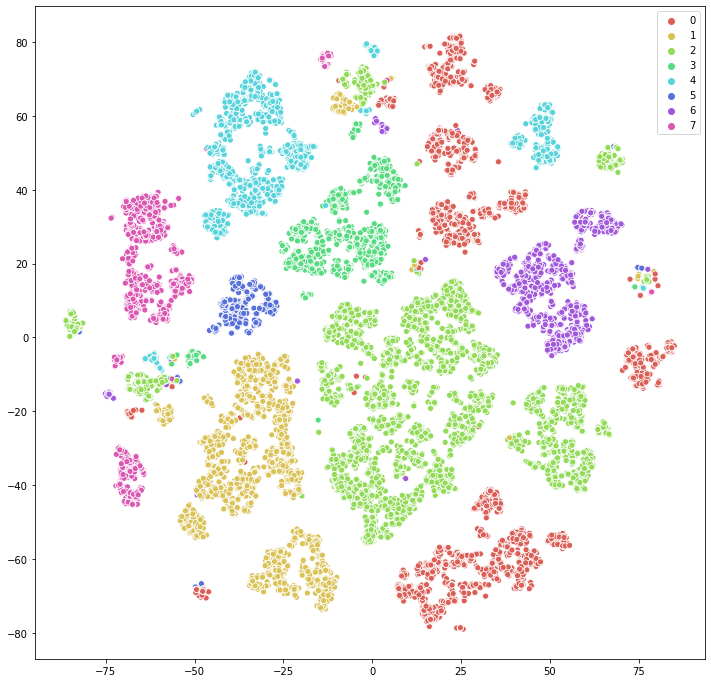

In [653]:
fig = plt.figure(figsize=[12,12])
sns.scatterplot(first_data_TSNE3[:,0 ],
                first_data_TSNE3[:,1],
                hue=cls8.labels_,
                legend='full',
                palette=sns.color_palette("hls",8))
plt.legend()

Analysis of clusters using: KMeans()
_______________________



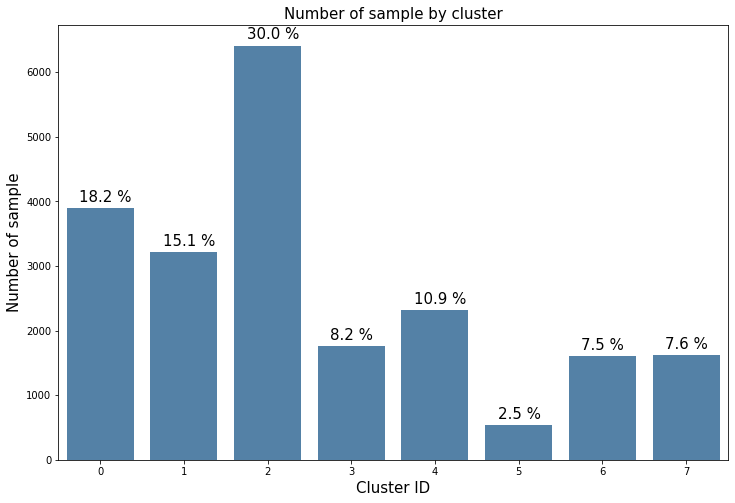

Int64Index([0, 1, 2, 3, 4, 5, 6, 7], dtype='int64')
Cluster ID: 0

Feature with higher values: ['product_category_name_gift_and_party']
Feature with lower values: ['product_category_name_furniture']


Cluster ID: 1

Feature with higher values: ['product_category_name_it_and_electronics', 'lat_customer']
Feature with lower values: ['product_category_name_furniture']


Cluster ID: 2

Feature with higher values: ['product_category_name_furniture']
Feature with lower values: ['lat_customer']


Cluster ID: 3

Feature with higher values: ['product_category_name_fashion', 'lat_customer']
Feature with lower values: ['product_category_name_furniture']


Cluster ID: 4

Feature with higher values: ['product_category_name_cosmetic', 'lat_customer', 'long_customer']
Feature with lower values: ['product_category_name_furniture']


Cluster ID: 5

Feature with higher values: ['nb_of_orders', 'nb_of_items', 'nb_of_reviews', 'payment_value', 'payment_type_credit_card', 'payment_type_voucher']
Feature wi

,features_higher,features_lower
0,['product_category_name_gift_and_party'],['product_category_name_furniture']
1,"['product_category_name_it_and_electronics', '...",['product_category_name_furniture']
2,['product_category_name_furniture'],['lat_customer']
3,"['product_category_name_fashion', 'lat_customer']",['product_category_name_furniture']
4,"['product_category_name_cosmetic', 'lat_custom...",['product_category_name_furniture']
5,"['nb_of_orders', 'nb_of_items', 'nb_of_reviews...","['lat_customer', 'long_customer']"
6,"['product_category_name_tools', 'payment_value']",['product_category_name_furniture']
7,['product_category_name_sports'],['product_category_name_furniture']


In [655]:
cluster_analysis(cls8,cls8.labels_,first_data,0.20)

Here we have a pretty good distribution of our customer in the different clusters.

However, we can observ here that most of the clusters correspond to a specific product category. As our dataset is very homogenous, the clustering algorithm obviously choose to split the customer with an easy way : 
 
=> 1 cluster = 1 cateogry

#### Kmeans - 10 Clusters

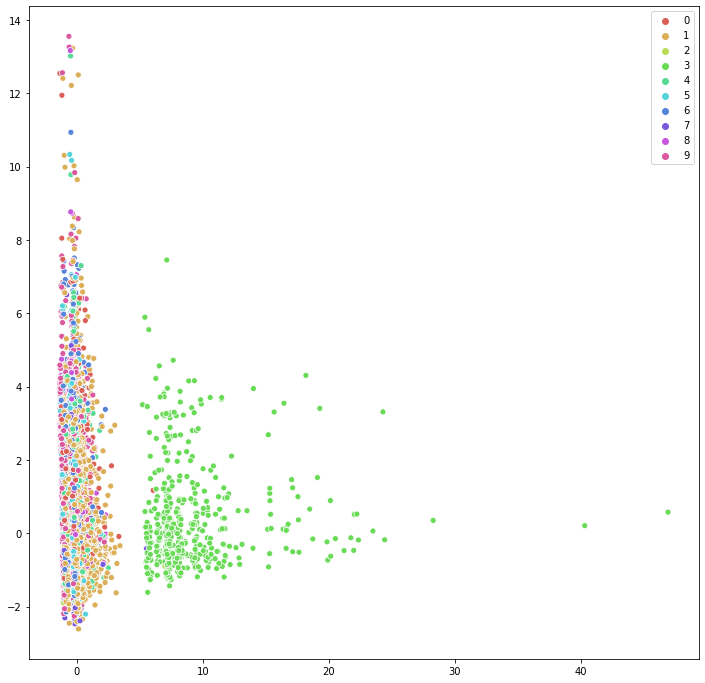

In [656]:
fig = plt.figure(figsize=[12,12])

cls10 = cluster.KMeans(n_clusters=10)
cls10.fit(first_data_scaled)
sns.scatterplot(first_data_trans[:,0 ],
                first_data_trans[:,1],
                hue=cls10.labels_,
                legend='full',
                palette=sns.color_palette("hls", 10))


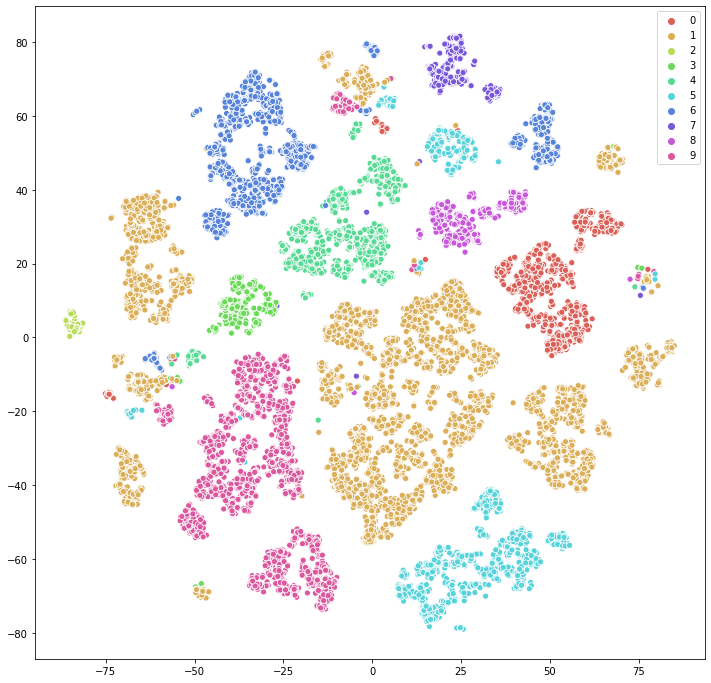

In [657]:
fig = plt.figure(figsize=[12,12])
sns.scatterplot(first_data_TSNE3[:,0 ],
                first_data_TSNE3[:,1],
                hue=cls10.labels_,
                legend='full',
                palette=sns.color_palette("hls", 10))
plt.legend()

Analysis of clusters using: KMeans(n_clusters=10)
_______________________



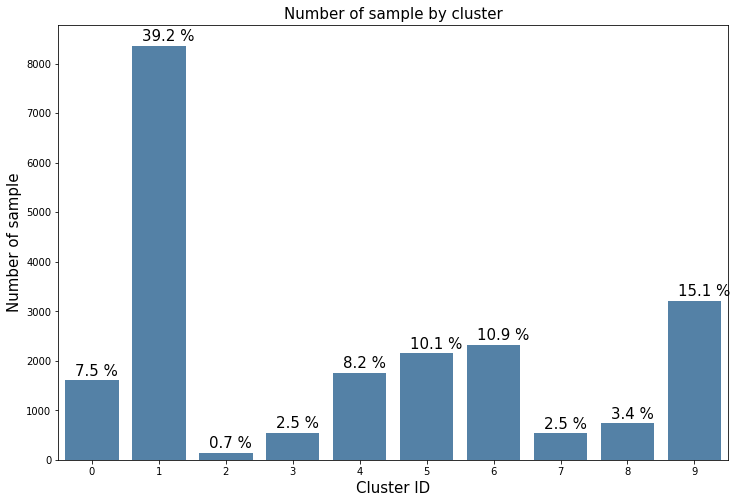

Int64Index([0, 1, 2, 3, 4, 5, 6, 7, 8, 9], dtype='int64')
Cluster ID: 0

Feature with higher values: ['product_category_name_tools']
Feature with lower values: ['product_category_name_furniture']


Cluster ID: 1

Feature with higher values: ['product_category_name_furniture']
Feature with lower values: ['lat_customer']


Cluster ID: 2

Feature with higher values: ['product_category_name_books']
Feature with lower values: ['product_category_name_furniture']


Cluster ID: 3

Feature with higher values: ['nb_of_orders', 'nb_of_items', 'nb_of_reviews', 'payment_value', 'payment_type_credit_card']
Feature with lower values: ['lat_customer']


Cluster ID: 4

Feature with higher values: ['product_category_name_fashion', 'lat_customer']
Feature with lower values: ['product_category_name_furniture']


Cluster ID: 5

Feature with higher values: ['product_category_name_gift_and_party']
Feature with lower values: ['product_category_name_furniture']


Cluster ID: 6

Feature with higher values: ['pr

,features_higher,features_lower
0,['product_category_name_tools'],['product_category_name_furniture']
1,['product_category_name_furniture'],['lat_customer']
2,['product_category_name_books'],['product_category_name_furniture']
3,"['nb_of_orders', 'nb_of_items', 'nb_of_reviews...",['lat_customer']
4,"['product_category_name_fashion', 'lat_customer']",['product_category_name_furniture']
5,['product_category_name_gift_and_party'],['product_category_name_furniture']
6,"['product_category_name_cosmetic', 'lat_custom...",['product_category_name_furniture']
7,['product_category_name_baby'],"['product_category_name_furniture', 'lat_custo..."
8,['product_category_name_office_furniture'],['product_category_name_furniture']
9,"['product_category_name_it_and_electronics', '...",['product_category_name_furniture']


In [658]:
cluster_analysis(cls10,cls10.labels_,first_data,0.25)

#### Kmeans - 12 Clusters

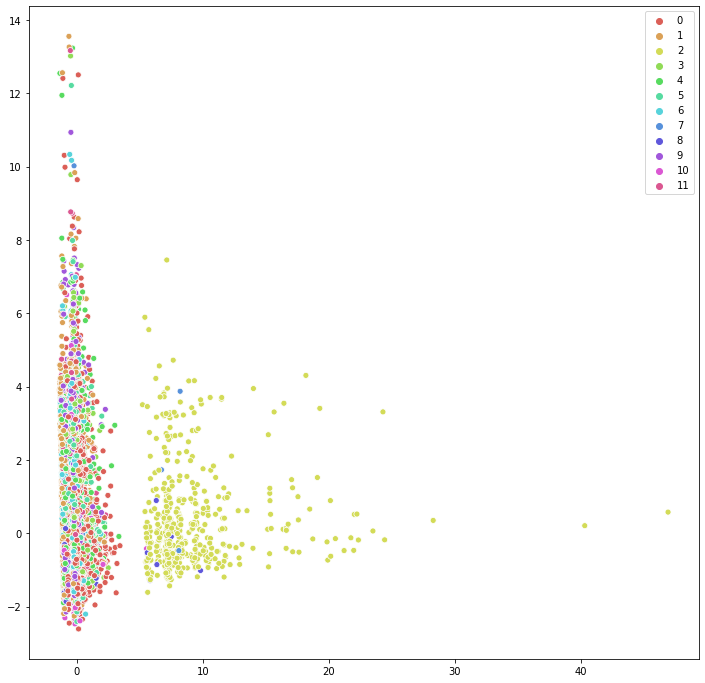

In [659]:
fig = plt.figure(figsize=[12,12])
cls12 = cluster.KMeans(n_clusters=12)
cls12.fit(first_data_scaled)
sns.scatterplot(first_data_trans[:,0 ],
                first_data_trans[:,1],
                hue=cls12.labels_,
                legend='full',
                palette=sns.color_palette("hls",12))
plt.legend()

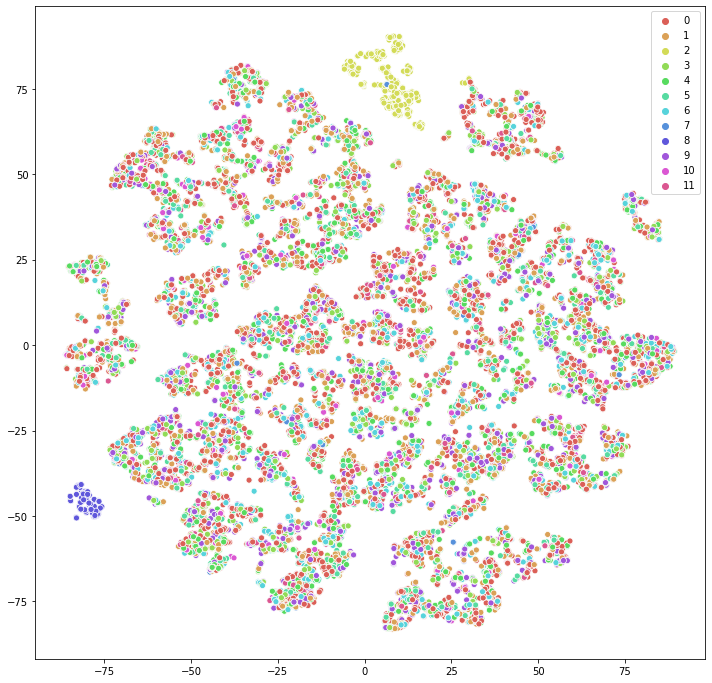

In [660]:
fig = plt.figure(figsize=[12,12])
sns.scatterplot(first_data_TSNE[:,0 ],
                first_data_TSNE[:,1],
                hue=cls12.labels_,
                legend='full',
                palette=sns.color_palette("hls", 12))
plt.legend()

Analysis of clusters using: KMeans(n_clusters=12)
_______________________



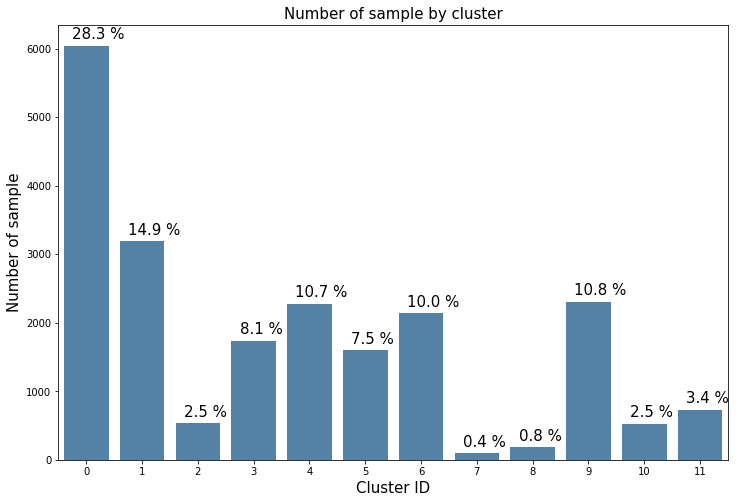

Int64Index([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11], dtype='int64')
Cluster ID: 0

Feature with higher values: ['product_category_name_furniture']
Feature with lower values: ['lat_customer']


Cluster ID: 1

Feature with higher values: ['product_category_name_it_and_electronics', 'lat_customer']
Feature with lower values: ['product_category_name_furniture']


Cluster ID: 2

Feature with higher values: ['nb_of_orders', 'nb_of_items', 'nb_of_reviews', 'payment_value', 'payment_type_credit_card']
Feature with lower values: ['lat_customer', 'long_customer']


Cluster ID: 3

Feature with higher values: ['product_category_name_fashion', 'lat_customer']
Feature with lower values: ['product_category_name_furniture']


Cluster ID: 4

Feature with higher values: ['product_category_name_tools']
Feature with lower values: ['product_category_name_furniture']


Cluster ID: 5

Feature with higher values: ['product_category_name_sports']
Feature with lower values: ['product_category_name_furniture']


C

,features_higher,features_lower
0,['product_category_name_furniture'],['lat_customer']
1,"['product_category_name_it_and_electronics', '...",['product_category_name_furniture']
2,"['nb_of_orders', 'nb_of_items', 'nb_of_reviews...","['lat_customer', 'long_customer']"
3,"['product_category_name_fashion', 'lat_customer']",['product_category_name_furniture']
4,['product_category_name_tools'],['product_category_name_furniture']
5,['product_category_name_sports'],['product_category_name_furniture']
6,['product_category_name_gift_and_party'],['product_category_name_furniture']
7,"['product_category_name_food_and_drink ', 'lat...","['product_category_name_furniture', 'payment_v..."
8,['payment_type_debit_card'],"['dist_seller_customer', 'payment_value', 'pay..."
9,"['product_category_name_cosmetic', 'lat_custom...",['product_category_name_furniture']


In [661]:
cluster_analysis(cls12,cls12.labels_,first_data,0.25)

### Gaussian Mixture Model

#### Scoring

In [223]:
summary_silhouettes=pd.DataFrame()
silhouettes=[]

for k in range(5):
    
    for i in range(2,20):
        gmm= mixture.GaussianMixture(n_components=i)
        labels=gmm.fit_predict(first_data_scaled)
        silh= metrics.silhouette_score(first_data_scaled,labels)
        silhouettes.append(silh)
        
    summary_silhouettes['sil{}'.format(k)]=silhouettes
    silhouettes=[]

summary_silhouettes

,sil0,sil1,sil2,sil3,sil4
0,0.068511,0.319638,0.059017,0.319638,0.052175
1,0.038146,0.039655,0.469387,0.101908,0.213304
2,0.105181,0.076143,0.094845,0.091001,0.074736
3,0.109514,0.116935,0.109052,0.300035,0.117274
4,0.118945,0.089084,0.089828,0.074747,0.113449
5,0.123471,0.125358,0.151056,0.132875,0.114255
6,0.151061,0.120172,0.172135,0.122148,0.171047
7,0.203967,0.222344,0.166664,0.157704,0.174486
8,0.218993,0.229788,0.214399,0.185767,0.225394
9,0.220300,0.190204,0.253814,0.173602,0.211566


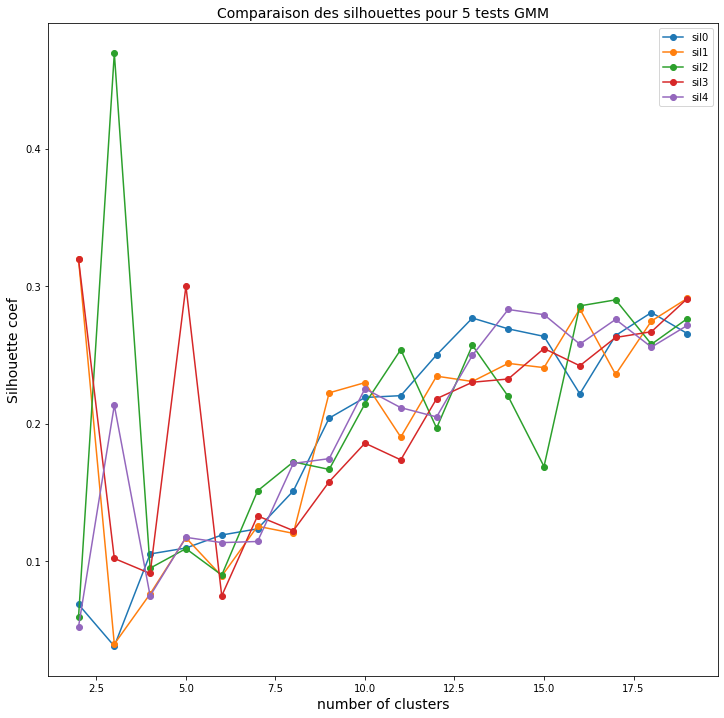

In [224]:
plt.figure(figsize=[12,12])
for col in summary_silhouettes.columns:
    plt.plot(range(2,20),summary_silhouettes[col],marker='o',label=col)
plt.title('Comparaison des silhouettes pour 5 tests GMM',fontsize=14)
plt.xlabel('number of clusters',fontsize=14)
plt.ylabel('Silhouette coef',fontsize=14)
plt.legend()


#### GMM - 8 Clusters

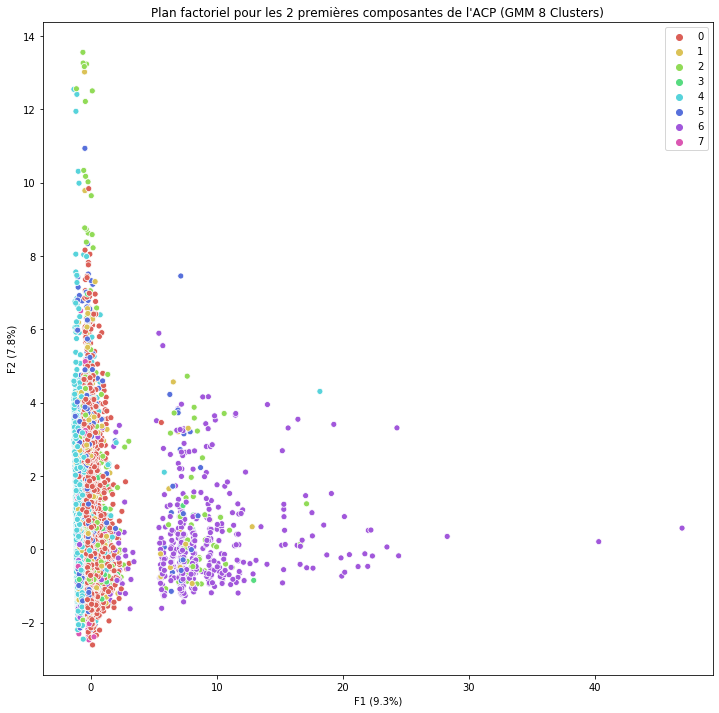

In [668]:
fig = plt.figure(figsize=[12,12])
gmm8 = mixture.GaussianMixture(n_components=8)
gmm_labels=gmm8.fit_predict(first_data_scaled)
sns.scatterplot(first_data_trans[:,0 ],
                first_data_trans[:,1],
                hue=gmm_labels,
                legend='full',
                palette=sns.color_palette("hls",8))
plt.title("Plan factoriel pour les 2 premières composantes de l'ACP (GMM 8 Clusters)")
plt.xlabel('F1 ({}%)'.format(np.around(pca.explained_variance_ratio_[0]*100,1)))
plt.ylabel('F2 ({}%)'.format(np.around(pca.explained_variance_ratio_[1]*100,1)))
plt.legend()

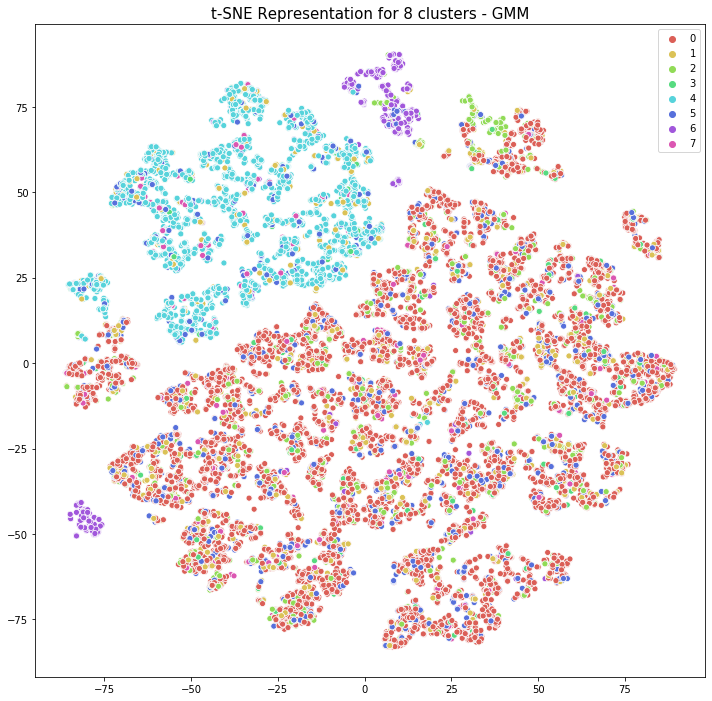

In [669]:
fig = plt.figure(figsize=[12,12])

sns.scatterplot(first_data_TSNE[:,0 ],
                first_data_TSNE[:,1],
                hue=gmm_labels,
                legend='full',
                palette=sns.color_palette("hls", 8))
plt.title('t-SNE Representation for 8 clusters - GMM',fontsize=15)

plt.legend()

Analysis of clusters using: GaussianMixture(n_components=8)
_______________________



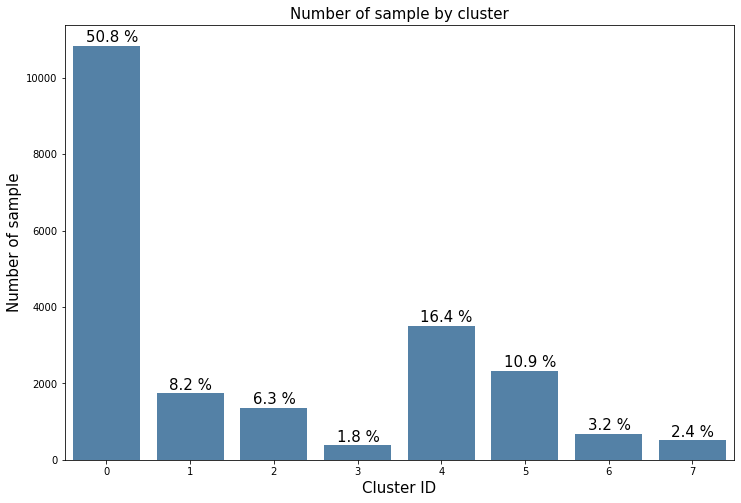

Int64Index([0, 1, 2, 3, 4, 5, 6, 7], dtype='int64')
Cluster ID: 0

Feature with higher values: ['payment_type_credit_card']
Feature with lower values: []


Cluster ID: 1

Feature with higher values: ['product_category_name_fashion', 'lat_customer']
Feature with lower values: ['product_category_name_furniture']


Cluster ID: 2

Feature with higher values: ['product_category_name_office_furniture', 'payment_value', 'payment_type_voucher', 'long_customer']
Feature with lower values: []


Cluster ID: 3

Feature with higher values: ['product_category_name_pets']
Feature with lower values: ['product_category_name_furniture', 'long_customer']


Cluster ID: 4

Feature with higher values: ['payment_type_boleto']
Feature with lower values: ['payment_type_credit_card', 'long_customer']


Cluster ID: 5

Feature with higher values: ['product_category_name_cosmetic', 'lat_customer', 'long_customer']
Feature with lower values: ['product_category_name_furniture']


Cluster ID: 6

Feature with higher v

,features_higher,features_lower
0,['payment_type_credit_card'],[]
1,"['product_category_name_fashion', 'lat_customer']",['product_category_name_furniture']
2,"['product_category_name_office_furniture', 'pa...",[]
3,['product_category_name_pets'],"['product_category_name_furniture', 'long_cust..."
4,['payment_type_boleto'],"['payment_type_credit_card', 'long_customer']"
5,"['product_category_name_cosmetic', 'lat_custom...",['product_category_name_furniture']
6,"['nb_of_orders', 'nb_of_items', 'nb_of_reviews...","['lat_customer', 'long_customer']"
7,['product_category_name_baby'],"['product_category_name_furniture', 'lat_custo..."


In [670]:
cluster_analysis(gmm8,gmm_labels,first_data,0.25)

#### GMM - 10 Clusters

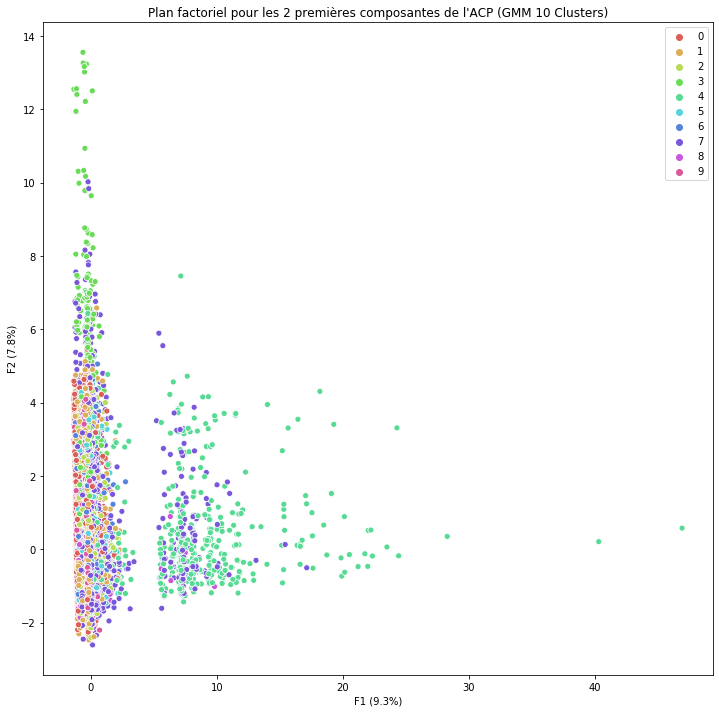

In [673]:
fig = plt.figure(figsize=[12,12])
gmm10 = mixture.GaussianMixture(n_components=10)
gmm_labels=gmm10.fit_predict(first_data_scaled)
sns.scatterplot(first_data_trans[:,0 ],
                first_data_trans[:,1],
                hue=gmm_labels,
                legend='full',
                palette=sns.color_palette("hls",10))
plt.title("Plan factoriel pour les 2 premières composantes de l'ACP (GMM 10 Clusters)")
plt.xlabel('F1 ({}%)'.format(np.around(pca.explained_variance_ratio_[0]*100,1)))
plt.ylabel('F2 ({}%)'.format(np.around(pca.explained_variance_ratio_[1]*100,1)))
plt.legend()

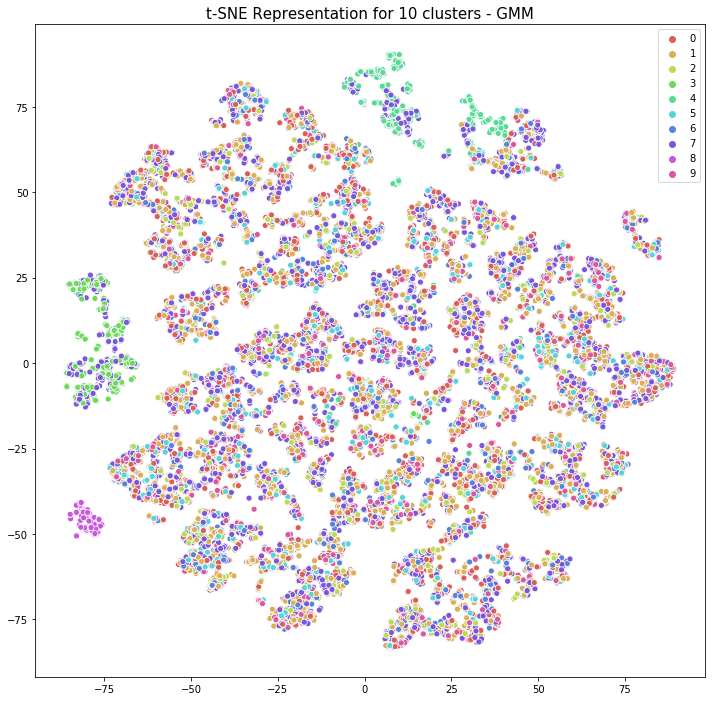

In [678]:
fig = plt.figure(figsize=[12,12])

sns.scatterplot(first_data_TSNE[:,0 ],
                first_data_TSNE[:,1],
                hue=gmm_labels,
                legend='full',
                palette=sns.color_palette("hls", 10))
plt.title('t-SNE Representation for 10 clusters - GMM',fontsize=15)

plt.legend()

Analysis of clusters using: GaussianMixture(n_components=10)
_______________________



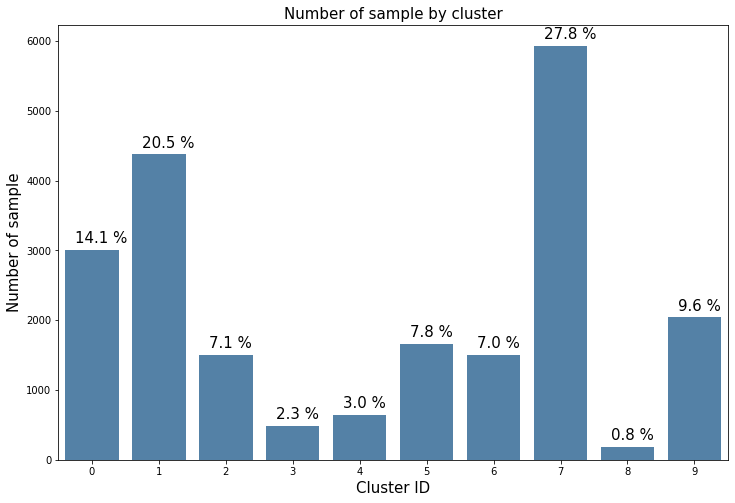

Int64Index([0, 1, 2, 3, 4, 5, 6, 7, 8, 9], dtype='int64')
Cluster ID: 0

Feature with higher values: ['product_category_name_it_and_electronics', 'lat_customer']
Feature with lower values: ['product_category_name_furniture']


Cluster ID: 1

Feature with higher values: ['product_category_name_cosmetic', 'lat_customer']
Feature with lower values: ['product_category_name_furniture']


Cluster ID: 2

Feature with higher values: ['product_category_name_sports']
Feature with lower values: ['product_category_name_furniture']


Cluster ID: 3

Feature with higher values: ['payment_value', 'late_delivery', 'delivery_lead_time', 'lat_customer', 'long_customer']
Feature with lower values: ['product_category_name_furniture', 'review_mean_score']


Cluster ID: 4

Feature with higher values: ['nb_of_orders', 'nb_of_items', 'nb_of_reviews', 'multi_payment_types', 'payment_value', 'payment_type_credit_card', 'payment_type_voucher']
Feature with lower values: ['lat_customer']


Cluster ID: 5

Feature w

,features_higher,features_lower
0,"['product_category_name_it_and_electronics', '...",['product_category_name_furniture']
1,"['product_category_name_cosmetic', 'lat_custom...",['product_category_name_furniture']
2,['product_category_name_sports'],['product_category_name_furniture']
3,"['payment_value', 'late_delivery', 'delivery_l...","['product_category_name_furniture', 'review_me..."
4,"['nb_of_orders', 'nb_of_items', 'nb_of_reviews...",['lat_customer']
5,"['product_category_name_fashion', 'lat_customer']",['product_category_name_furniture']
6,['product_category_name_tools'],['product_category_name_furniture']
7,['product_category_name_furniture'],['lat_customer']
8,['payment_type_debit_card'],"['dist_seller_customer', 'payment_value', 'pay..."
9,['product_category_name_gift_and_party'],['product_category_name_furniture']


In [675]:
cluster_analysis(gmm10,gmm_labels,first_data,0.25)

GMM does not provide better results than k-means here. And we face the same "cluster=category" issue here.

### Agglomerative Clustering

#### Scoring

In [225]:
summary_silhouettes=pd.DataFrame()
silhouettes=[]

for k in range(5):
    
    for i in range(2,20):
        cls= cluster.AgglomerativeClustering(n_clusters=i,linkage='ward')
        cls.fit(first_data_scaled)
        silh= metrics.silhouette_score(first_data_scaled,cls.labels_)
        silhouettes.append(silh)
        
    summary_silhouettes['sil{}'.format(k)]=silhouettes
    silhouettes=[]

summary_silhouettes

,sil0,sil1,sil2,sil3,sil4
0,0.451844,0.451844,0.451844,0.451844,0.451844
1,0.299647,0.299647,0.299647,0.299647,0.299647
2,0.284605,0.284605,0.284605,0.284605,0.284605
3,0.024796,0.024796,0.024796,0.024796,0.024796
4,0.033978,0.033978,0.033978,0.033978,0.033978
5,0.050690,0.050690,0.050690,0.050690,0.050690
6,0.062492,0.062492,0.062492,0.062492,0.062492
7,0.070004,0.070004,0.070004,0.070004,0.070004
8,0.089860,0.089860,0.089860,0.089860,0.089860
9,0.102764,0.102764,0.102764,0.102764,0.102764


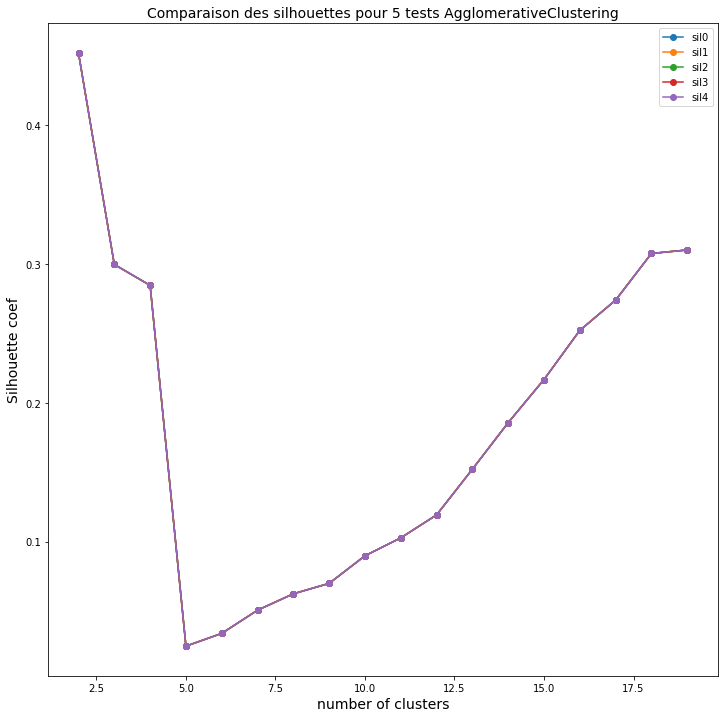

In [226]:
plt.figure(figsize=[12,12])
for col in summary_silhouettes.columns:
    plt.plot(range(2,20),summary_silhouettes[col],marker='o',label=col)
plt.title('Comparaison des silhouettes pour 5 tests AgglomerativeClustering',fontsize=14)
plt.xlabel('number of clusters',fontsize=14)
plt.ylabel('Silhouette coef',fontsize=14)
plt.legend()


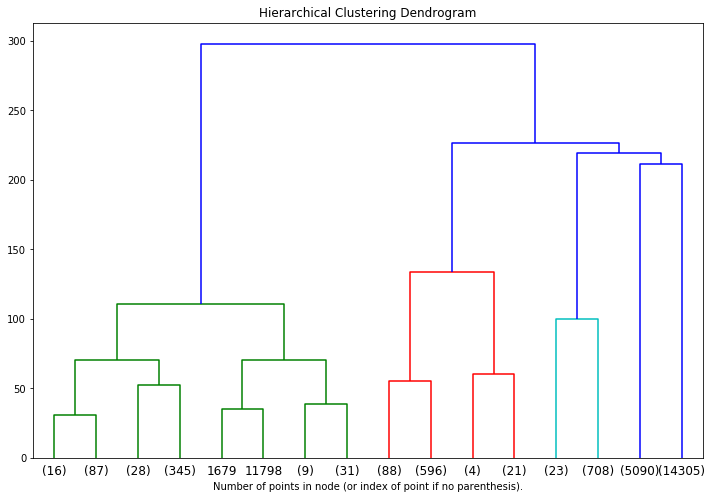

In [231]:
from scipy.cluster.hierarchy import dendrogram

def plot_dendrogram(model, **kwargs):
    # Create linkage matrix and then plot the dendrogram

    # create the counts of samples under each node
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1  # leaf node
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    linkage_matrix = np.column_stack([model.children_, model.distances_,
                                      counts]).astype(float)

    # Plot the corresponding dendrogram
    dendrogram(linkage_matrix, **kwargs)


# setting distance_threshold=0 ensures we compute the full tree.
model = cluster.AgglomerativeClustering(distance_threshold=0, n_clusters=None)

model = model.fit(first_data_scaled)
plt.figure(figsize=[12,8])
plt.title('Hierarchical Clustering Dendrogram')
# plot the top three levels of the dendrogram
plot_dendrogram(model, truncate_mode='level', p=3)
plt.xlabel("Number of points in node (or index of point if no parenthesis).")
plt.show()

#### Agglomerative Clustering - 10 Clusters

In [676]:
agg_10= cluster.AgglomerativeClustering(n_clusters=10,linkage='ward')
agg_10.fit(first_data_scaled)

AgglomerativeClustering(n_clusters=10)

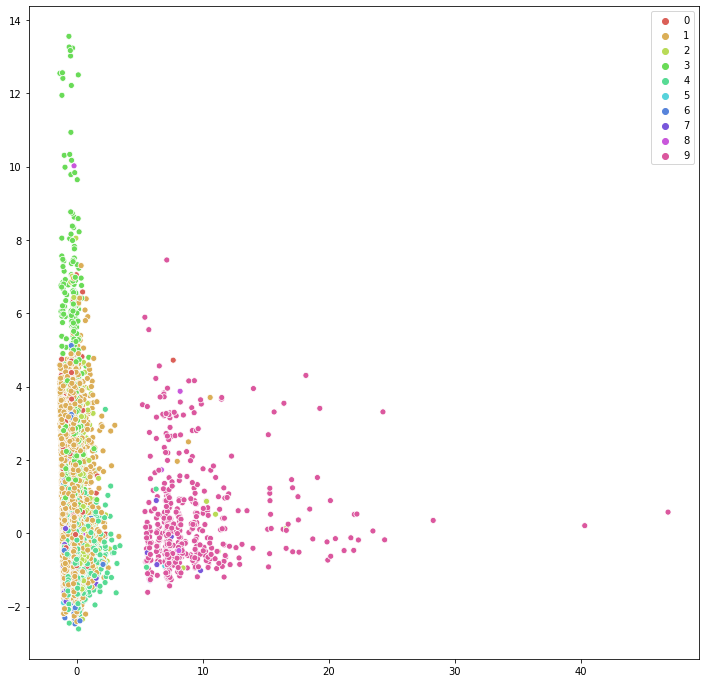

In [677]:
fig = plt.figure(figsize=[12,12])


sns.scatterplot(first_data_trans[:,0 ],
                first_data_trans[:,1],
                hue=agg_10.labels_,
                legend='full',
                palette=sns.color_palette("hls", len(np.unique(agg_10.labels_).tolist())))

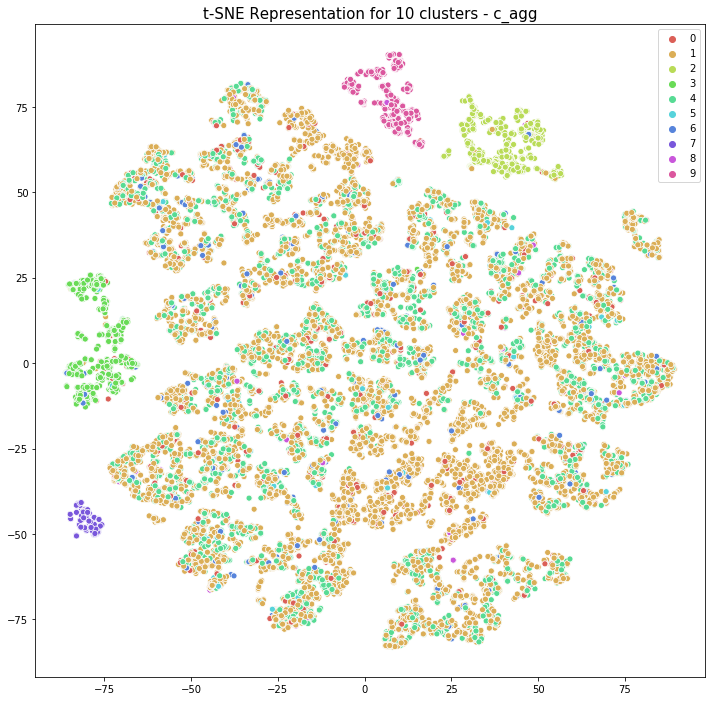

In [679]:
fig = plt.figure(figsize=[12,12])

sns.scatterplot(first_data_TSNE[:,0 ],
                first_data_TSNE[:,1],
                hue=agg_10.labels_,
                legend='full',
                palette=sns.color_palette("hls", 10))
plt.title('t-SNE Representation for 10 clusters - c_agg',fontsize=15)

plt.legend()

Analysis of clusters using: AgglomerativeClustering(n_clusters=10)
_______________________



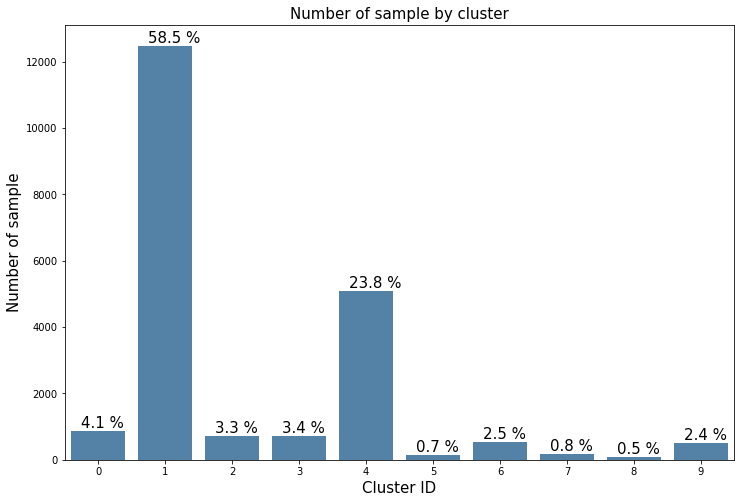

Int64Index([0, 1, 2, 3, 4, 5, 6, 7, 8, 9], dtype='int64')
Cluster ID: 0

Feature with higher values: ['product_category_name_office_furniture', 'lat_customer', 'long_customer']
Feature with lower values: ['product_category_name_furniture']


Cluster ID: 1

Feature with higher values: ['lat_customer']
Feature with lower values: []


Cluster ID: 2

Feature with higher values: ['multi_payment_types', 'payment_type_voucher', 'lat_customer', 'long_customer']
Feature with lower values: []


Cluster ID: 3

Feature with higher values: ['late_delivery', 'delivery_lead_time', 'lat_customer', 'long_customer']
Feature with lower values: ['review_mean_score']


Cluster ID: 4

Feature with higher values: ['product_category_name_furniture']
Feature with lower values: ['dist_seller_customer', 'lat_customer', 'long_customer']


Cluster ID: 5

Feature with higher values: ['product_category_name_books']
Feature with lower values: ['product_category_name_furniture']


Cluster ID: 6

Feature with higher va

In [680]:
summary_agg10=cluster_analysis(agg_10,agg_10.labels_,first_data,0.25)

### DBSCAN

#### Loop to find best min_samp and epsilon - Scoring

In [232]:
# Let's create a loop to determine which epsilon and which min_samples give the best silhouette results

min_samp=[1,3,5,7,9]
epsilon=[5,6,7,8,9]
summary_silhouettes=pd.DataFrame(index=range(len(epsilon)*len(min_samp)),
                                 columns=['eps','min_samples','sil','nb_clusters'])

counter=0         
for k in range(len(epsilon)):
         
    for i in range(len(min_samp)):
        summary_silhouettes.iloc[counter,0]= epsilon[k]
        summary_silhouettes.iloc[counter,1]= min_samp[i]
        cls= cluster.DBSCAN(eps=epsilon[k],min_samples=min_samp[i])
        cls.fit(first_data_scaled)
        summary_silhouettes.iloc[counter,2]= metrics.silhouette_score(first_data_scaled,cls.labels_)
        summary_silhouettes.iloc[counter,3]=len(np.unique(cls.labels_).tolist())
        counter+=1

summary_silhouettes

,eps,min_samples,sil,nb_clusters
0,5,1,0.16807,151
1,5,3,0.183425,27
2,5,5,0.279092,18
3,5,7,0.275171,15
4,5,9,0.273324,16
5,6,1,0.286226,80
6,6,3,0.308529,11
7,6,5,0.469697,7
8,6,7,0.473752,6
9,6,9,0.472867,6


In [233]:
summary_silhouettes.sort_values(by='sil',ascending=False)

,eps,min_samples,sil,nb_clusters
8,6,7,0.473752,6
12,7,5,0.473038,4
9,6,9,0.472867,6
14,7,9,0.472083,4
13,7,7,0.471801,4
7,6,5,0.469697,7
19,8,9,0.469158,3
18,8,7,0.469093,3
17,8,5,0.46899,3
16,8,3,0.468775,4


Checking Stability 

In [113]:
for i in range(5):
    cls= cluster.DBSCAN(eps=9,min_samples=3)
    cls.fit(first_data_scaled)
    print('Loop {}, silhoutte score: {}'.format(i,metrics.silhouette_score(first_data_scaled,cls.labels_)))


Loop 0, silhoutte score: 0.41208221903788433
Loop 1, silhoutte score: 0.41208221903788433
Loop 2, silhoutte score: 0.41208221903788433
Loop 3, silhoutte score: 0.41208221903788433
Loop 4, silhoutte score: 0.41208221903788433


#### DBSCAN Eps=9 MinSamp=3

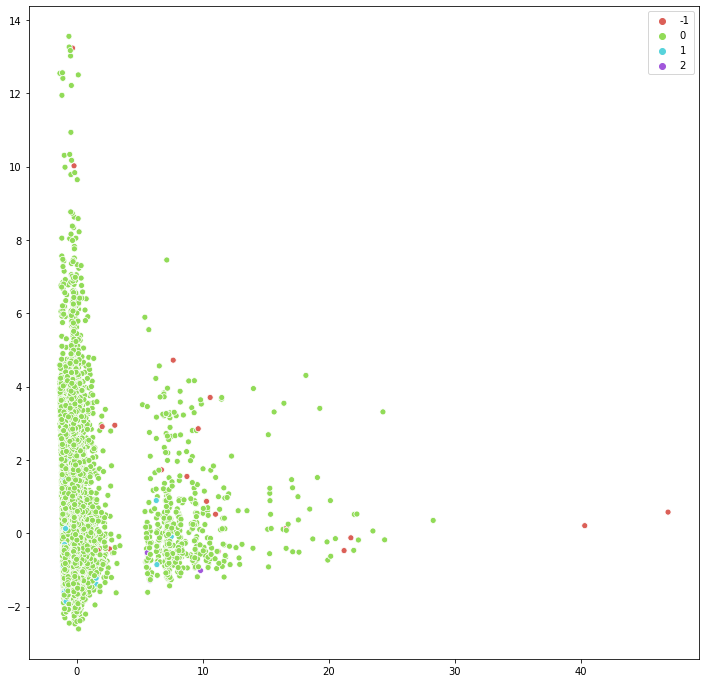

In [681]:
fig = plt.figure(figsize=[12,12])

db_93 = cluster.DBSCAN(eps=9,min_samples=3)
db_93.fit(first_data_scaled)
sns.scatterplot(first_data_trans[:,0 ],
                first_data_trans[:,1],
                hue=db_93.labels_,
                legend='full',
                palette=sns.color_palette("hls", len(np.unique(db_93.labels_).tolist())))

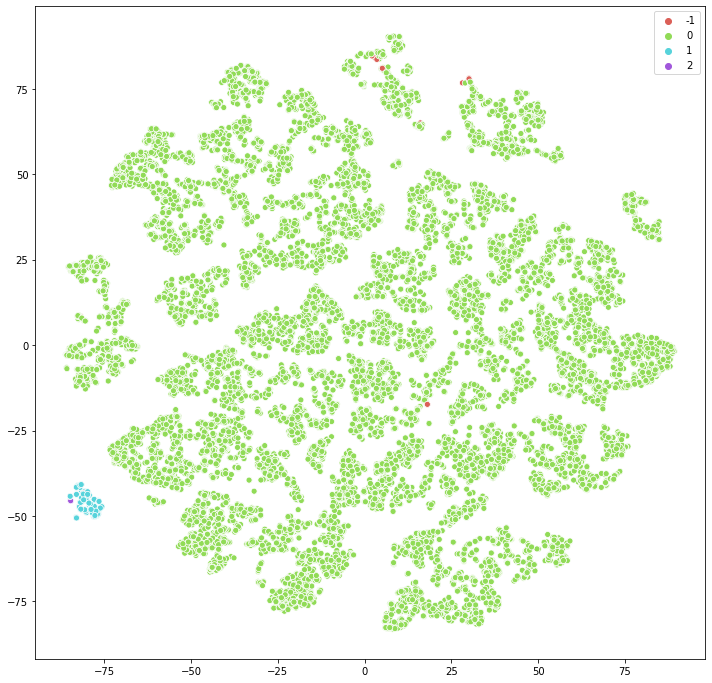

In [682]:
fig = plt.figure(figsize=[12,12])

sns.scatterplot(first_data_TSNE[:,0 ],
                first_data_TSNE[:,1],
                hue=db_93.labels_,
                legend='full',
                palette=sns.color_palette("hls", len(np.unique(db_93.labels_).tolist())))
plt.legend()

Analysis of clusters using: DBSCAN(eps=9, min_samples=3)
_______________________



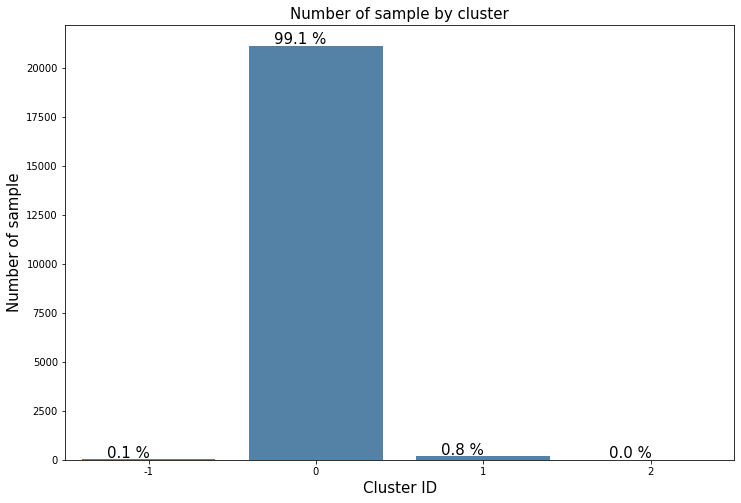

Int64Index([-1, 0, 1, 2], dtype='int64')
Cluster ID: -1

Feature with higher values: ['nb_of_orders', 'recency', 'nb_of_items', 'product_category_name_art_and_music', 'nb_of_reviews', 'multi_payment_types', 'payment_value', 'payment_type_boleto', 'payment_type_voucher', 'delivery_lead_time', 'lat_customer']
Feature with lower values: ['long_customer']


Cluster ID: 0

Feature with higher values: []
Feature with lower values: []


Cluster ID: 1

Feature with higher values: ['payment_type_debit_card']
Feature with lower values: ['dist_seller_customer', 'payment_value', 'payment_type_credit_card', 'lat_customer', 'long_customer']


Cluster ID: 2

Feature with higher values: ['nb_of_orders', 'nb_of_items', 'product_category_name_furniture', 'nb_of_reviews', 'payment_type_debit_card', 'long_customer']
Feature with lower values: ['dist_seller_customer', 'payment_value', 'payment_type_credit_card', 'lat_customer']


Analysis Done


,features_higher,features_lower
0,[],[]
1,['payment_type_debit_card'],"['dist_seller_customer', 'payment_value', 'pay..."
2,"['nb_of_orders', 'nb_of_items', 'product_categ...","['dist_seller_customer', 'payment_value', 'pay..."
3,"['nb_of_orders', 'recency', 'nb_of_items', 'pr...",['long_customer']


In [683]:
cluster_analysis(db_93,db_93.labels_,first_data,0.25)

#### DBSCAN Eps=7 MinSamp=5

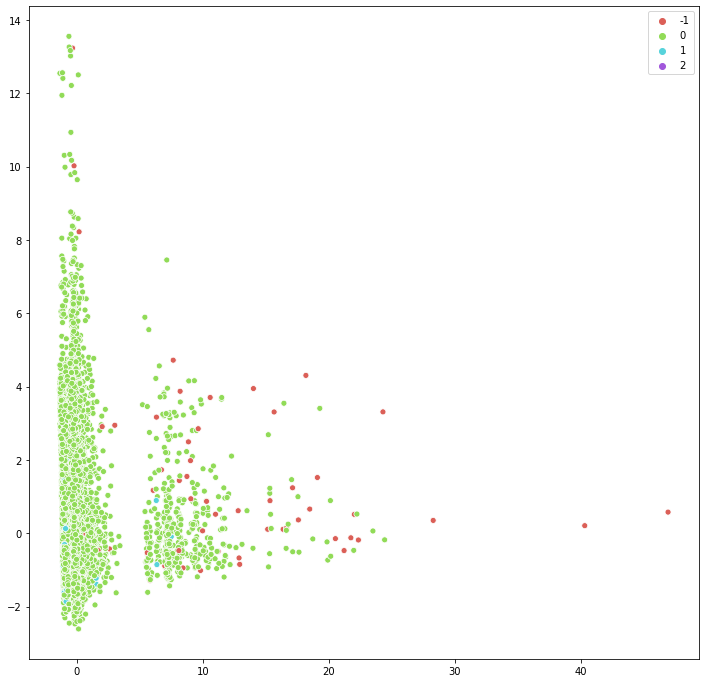

In [684]:
fig = plt.figure(figsize=[12,12])

db_75 = cluster.DBSCAN(eps=7,min_samples=5)
db_75.fit(first_data_scaled)
sns.scatterplot(first_data_trans[:,0 ],
                first_data_trans[:,1],
                hue=db_75.labels_,
                legend='full',
                palette=sns.color_palette("hls", len(np.unique(db_75.labels_).tolist())))

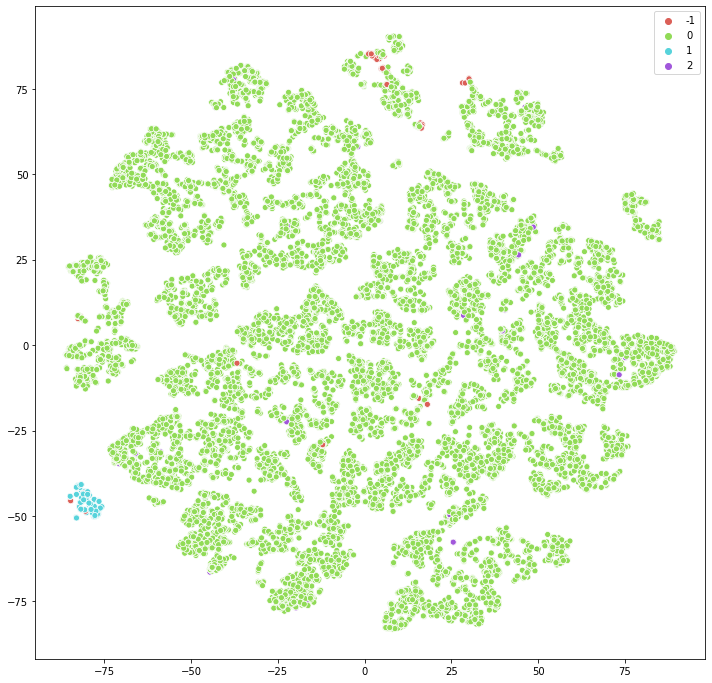

In [685]:
fig = plt.figure(figsize=[12,12])

sns.scatterplot(first_data_TSNE[:,0 ],
                first_data_TSNE[:,1],
                hue=db_75.labels_,
                legend='full',
                palette=sns.color_palette("hls", len(np.unique(db_75.labels_).tolist())))
plt.legend()

Analysis of clusters using: DBSCAN(eps=7)
_______________________



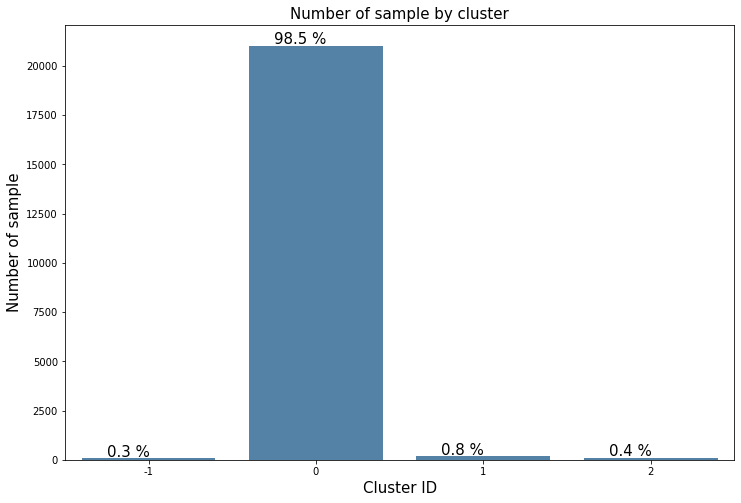

Int64Index([-1, 0, 1, 2], dtype='int64')
Cluster ID: -1

Feature with higher values: ['nb_of_orders', 'nb_of_items', 'nb_of_reviews', 'payment_value', 'payment_type_boleto', 'payment_type_credit_card', 'payment_type_voucher', 'delivery_lead_time']
Feature with lower values: []


Cluster ID: 0

Feature with higher values: []
Feature with lower values: []


Cluster ID: 1

Feature with higher values: ['payment_type_debit_card']
Feature with lower values: ['dist_seller_customer', 'payment_value', 'payment_type_credit_card', 'lat_customer', 'long_customer']


Cluster ID: 2

Feature with higher values: ['product_category_name_food_and_drink ', 'long_customer']
Feature with lower values: ['product_category_name_furniture', 'payment_value']


Analysis Done


,features_higher,features_lower
0,[],[]
1,['payment_type_debit_card'],"['dist_seller_customer', 'payment_value', 'pay..."
2,"['product_category_name_food_and_drink ', 'lon...","['product_category_name_furniture', 'payment_v..."
3,"['nb_of_orders', 'nb_of_items', 'nb_of_reviews...",[]


In [686]:
cluster_analysis(db_75,db_75.labels_,first_data,0.25)

The DBSCAN algorithm provides pretty bad results here. This cannot be used 

### Conclusion of 3.1 Section

The k-means algorithm provides us with the best results. However, as mentionned before, the clusters have a high tendancy to use only the "produc_category" features, which is hidding to much the information of all others features. 

**Let's try again without the category features!** 

## [Final Solution] Features without date_based and product_category

In [361]:
first_data= pd.read_csv("data_first20k.csv",index_col='customer_unique_id')
first_data.dropna(inplace=True)
first_data

,nb_of_orders,recency,nb_of_items,dist_seller_customer,product_category_name_art_and_music,product_category_name_baby,product_category_name_books,product_category_name_cosmetic,product_category_name_fashion,product_category_name_food_and_drink,...,purchasing_month_January,purchasing_month_July,purchasing_month_June,purchasing_month_March,purchasing_month_May,purchasing_month_November,purchasing_month_October,purchasing_month_September,lat_customer,long_customer
customer_unique_id,,,,,,,,,,,,,,,,,,,,,
0000f46a3911fa3c0805444483337064,1,1,1.0,517.477152,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,1,0,0,0,0,-27.543787,-48.625680
0005e1862207bf6ccc02e4228effd9a0,1,1,1.0,245.667440,0.0,0.0,0.0,0.0,1.0,0.0,...,0,0,0,1,0,0,0,0,-22.403254,-43.001980
0006fdc98a402fceb4eb0ee528f6a8d4,1,0,1.0,776.359877,0.0,0.0,0.0,0.0,0.0,0.0,...,0,1,0,0,0,0,0,0,-21.061422,-41.371778
000a5ad9c4601d2bbdd9ed765d5213b3,1,0,1.0,837.051657,0.0,0.0,0.0,1.0,0.0,0.0,...,0,0,0,0,0,0,0,0,-30.017690,-51.191212
000de6019bb59f34c099a907c151d855,1,0,2.0,258.358625,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,-23.826105,-45.435803
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
fff1afc79f6b5db1e235a4a6c30ceda7,1,0,1.0,726.939361,0.0,0.0,0.0,1.0,0.0,0.0,...,0,0,0,0,0,0,0,0,-27.634768,-52.280294
fff3a9369e4b7102fab406a334a678c3,1,0,1.0,741.236998,0.0,0.0,0.0,0.0,1.0,0.0,...,0,0,0,0,0,0,0,0,-15.799190,-47.870102
fffcf5a5ff07b0908bd4e2dbc735a684,1,0,2.0,1997.315822,0.0,0.0,0.0,1.0,0.0,0.0,...,0,0,1,0,0,0,0,0,-8.363166,-36.559088


In [362]:
col_to_drop=first_data.columns[first_data.columns.str.contains('purchasing_month')
                               |first_data.columns.str.contains('product_category')
                               |first_data.columns.str.contains('xmas')]
col_to_drop=col_to_drop.tolist()
col_to_drop
first_data.drop(columns=col_to_drop,inplace=True)

In [363]:
std = StandardScaler()
first_data_scaled = std.fit_transform(first_data)

### PCA Setup

In [364]:
pca = decomposition.PCA(n_components=2)
pca.fit(first_data_scaled)
print(pca.explained_variance_ratio_.cumsum())
first_data_trans = pca.transform(first_data_scaled)

[0.16754379 0.3089982 ]


In [243]:
len(pca.components_[0,:])

18

[ 5.73863805e-01 -2.34413101e-02  5.04312791e-01 -1.94945807e-02
  5.57614820e-01 -1.22022203e-02  4.85820745e-02  1.08674921e-19
  1.09808490e-01 -6.64878994e-02  2.85175946e-01 -1.28650194e-02
  5.26233915e-02  2.59573900e-02 -1.13258481e-02 -0.00000000e+00
 -1.82442645e-02 -1.01242448e-02] 
 [ 3.69398944e-03  4.73344202e-02  1.59825989e-03  5.19359816e-01
  3.83198120e-03 -1.89262149e-01  2.28732754e-02 -4.96799744e-19
  1.05150926e-01  4.32285821e-03  4.43796773e-03 -3.07529095e-02
  9.06571602e-03  2.88841172e-01  4.58937293e-01 -0.00000000e+00
  5.31691072e-01  3.20592445e-01]


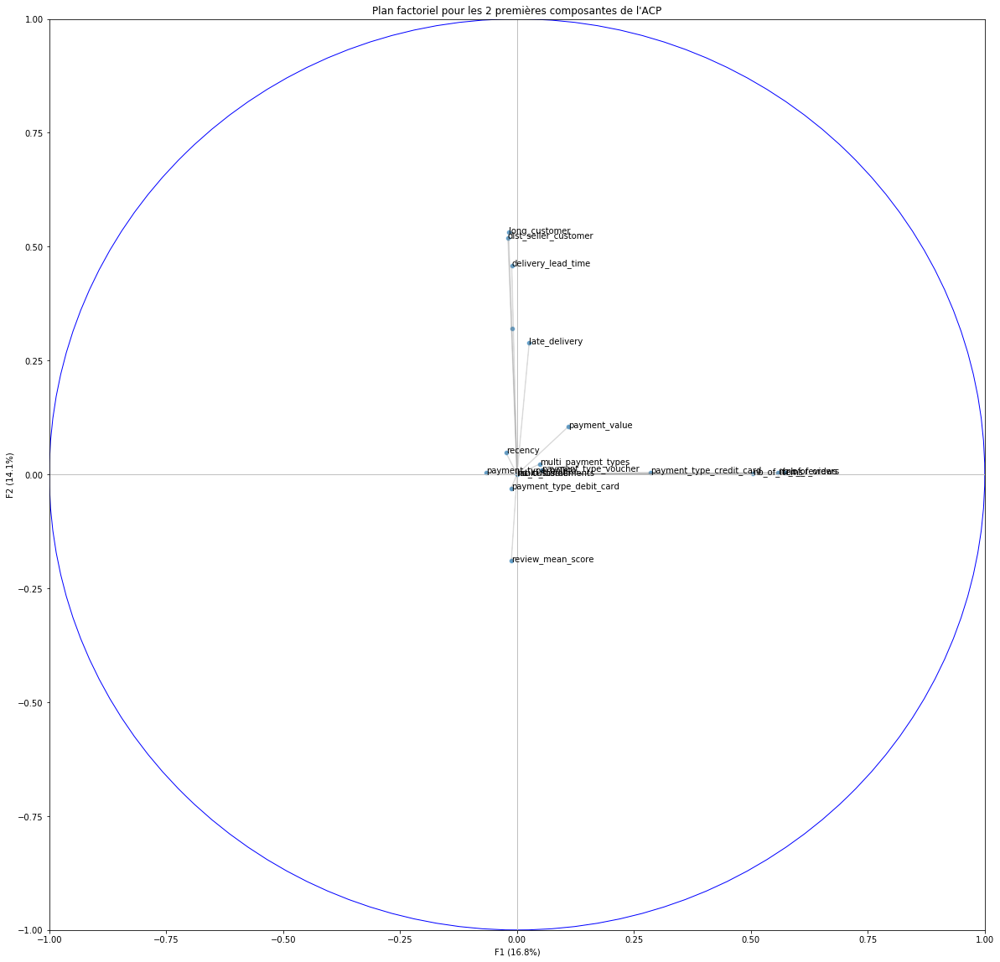

In [330]:
xpca =pca.components_[0,:]
ypca =pca.components_[1,:]

print(pca.components_[0,:],'\n',pca.components_[1,:])
fig, axes = plt.subplots(figsize=(20,20))

plt.title("Plan factoriel pour les 2 premières composantes de l'ACP")
plt.xlabel('F1 ({}%)'.format(np.around(pca.explained_variance_ratio_[0]*100,1)))
plt.ylabel('F2 ({}%)'.format(np.around(pca.explained_variance_ratio_[1]*100,1)))

axes.set_xlim(-1,1)
axes.set_ylim(-1,1)
cercle = plt.Circle((0,0),1,color='blue',fill=False)
axes.add_artist(cercle)

plt.plot([-1,1],[0,0],color='silver',linestyle='-',linewidth=1)
plt.plot([0,0],[-1,1],color='silver',linestyle='-',linewidth=1)

sns.scatterplot(x= xpca, y= ypca ,alpha = 0.7)

for i in range(len(first_data.columns)):
    plt.annotate(first_data.columns[i], (xpca[i],ypca[i]))
    axes.arrow(0, 0, xpca[i], ypca[i], head_width=0, head_length=0, fc='grey', ec='grey',alpha=0.2)

### TSNE Setup

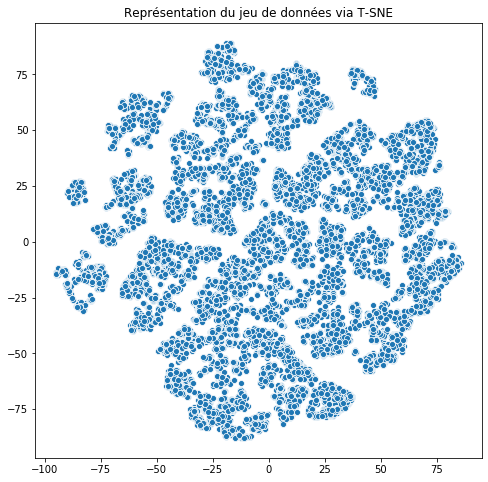

In [338]:
tsne = TSNE(n_components=2)
first_data_TSNE = tsne.fit_transform(first_data_scaled.copy())

plt.figure(figsize=(8,8))
plt.title('Représentation du jeu de données via T-SNE')
sns.scatterplot(first_data_TSNE[:,0], first_data_TSNE[:,1])

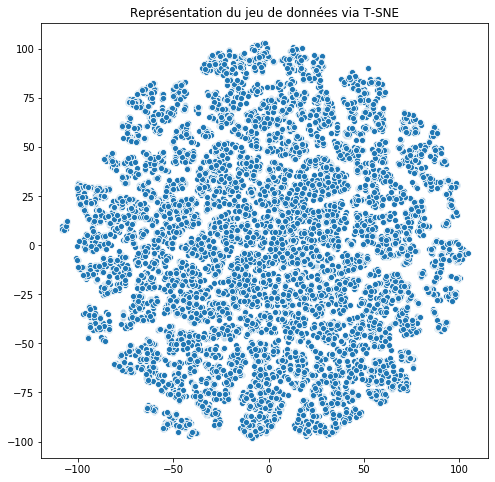

In [255]:
tsne = TSNE(n_components=2,perplexity=10)
first_data_TSNE2 = tsne.fit_transform(first_data_scaled.copy())

plt.figure(figsize=(8,8))
plt.title('Représentation du jeu de données via T-SNE')
sns.scatterplot(first_data_TSNE2[:,0], first_data_TSNE2[:,1])

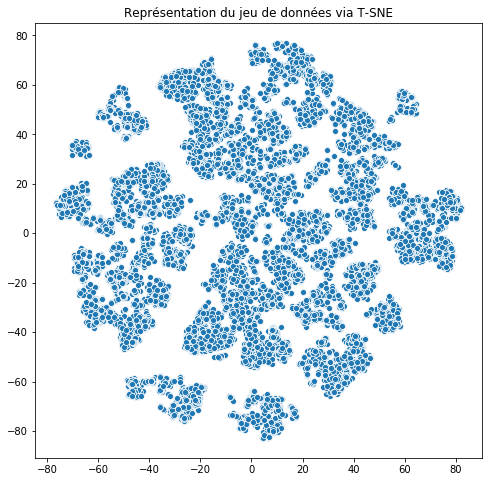

In [342]:
tsne = TSNE(n_components=2,perplexity=50)
first_data_TSNE3 = tsne.fit_transform(first_data_scaled.copy())

plt.figure(figsize=(8,8))
plt.title('Représentation du jeu de données via T-SNE')
sns.scatterplot(first_data_TSNE3[:,0], first_data_TSNE3[:,1])

### Kmeans

In [321]:
first_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 21353 entries, 0000f46a3911fa3c0805444483337064 to ffffd2657e2aad2907e67c3e9daecbeb
Data columns (total 18 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   nb_of_orders              21353 non-null  int64  
 1   recency                   21353 non-null  int64  
 2   nb_of_items               21353 non-null  float64
 3   dist_seller_customer      21353 non-null  float64
 4   nb_of_reviews             21353 non-null  int64  
 5   review_mean_score         21353 non-null  float64
 6   multi_payment_types       21353 non-null  float64
 7   multi_installments        21353 non-null  float64
 8   payment_value             21353 non-null  float64
 9   payment_type_boleto       21353 non-null  float64
 10  payment_type_credit_card  21353 non-null  float64
 11  payment_type_debit_card   21353 non-null  float64
 12  payment_type_voucher      21353 non-null  float64
 13  late_del

#### Silhouette

In [238]:
summary_silhouettes=pd.DataFrame()
silhouettes=[]

for k in range(5):
    
    for i in range(2,20):
        cls= cluster.KMeans(n_clusters=i)
        cls.fit(first_data_scaled)
        silh= metrics.silhouette_score(first_data_scaled,cls.labels_)
        silhouettes.append(silh)
        
    summary_silhouettes['sil{}'.format(k)]=silhouettes
    silhouettes=[]

summary_silhouettes

,sil0,sil1,sil2,sil3,sil4
0,0.616283,0.616283,0.616283,0.616283,0.231726
1,0.270991,0.246144,0.270962,0.349492,0.349230
2,0.294961,0.271296,0.294937,0.271228,0.294938
3,0.313081,0.322885,0.313215,0.313081,0.313081
4,0.308208,0.322085,0.322074,0.341170,0.341170
5,0.230021,0.339826,0.339834,0.339751,0.339838
6,0.238632,0.238632,0.238632,0.238632,0.238632
7,0.241773,0.244785,0.243648,0.241983,0.243646
8,0.247946,0.246819,0.246819,0.248158,0.250023
9,0.248741,0.248529,0.248529,0.253224,0.249663


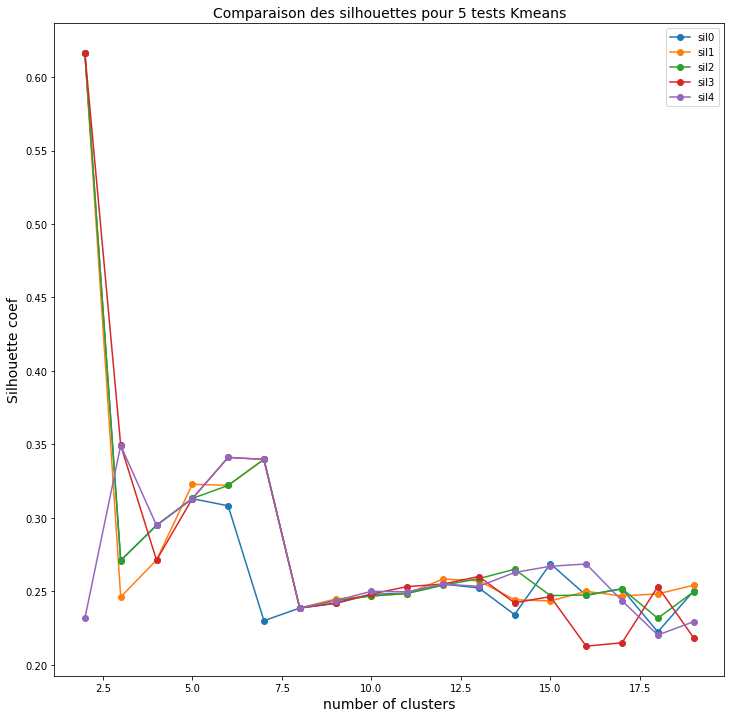

In [239]:
plt.figure(figsize=[12,12])
for col in summary_silhouettes.columns:
    plt.plot(range(2,20),summary_silhouettes[col],marker='o',label=col)
plt.title('Comparaison des silhouettes pour 5 tests Kmeans',fontsize=14)
plt.xlabel('number of clusters',fontsize=14)
plt.ylabel('Silhouette coef',fontsize=14)
plt.legend()


We have already seen that the small amount of cluster provides us with clusters with a bad distribution (and the stability is also not good)

Let's focus on k-means with 8,9 and 10 clusters (so also goes with the idea not to have too much clusters, which would have no use marketing wise)

#### Davies-Bouldin Score

In [240]:
summary_DBS=pd.DataFrame()
DBScore=[]

for k in range(5):
    
    for i in range(2,20):
        cls= cluster.KMeans(n_clusters=i)
        cls.fit(first_data_scaled)
        db_score= metrics.davies_bouldin_score(first_data_scaled,cls.labels_)
        DBScore.append(db_score)
        
    summary_DBS['dbs{}'.format(k)]=DBScore
    DBScore=[]

summary_DBS

,dbs0,dbs1,dbs2,dbs3,dbs4
0,0.962675,0.962675,0.962675,1.772605,1.865754
1,1.487755,1.458165,1.488368,1.488368,1.488368
2,1.381381,1.381381,1.382291,1.381145,1.354683
3,1.247707,1.229144,1.257325,1.229144,1.257463
4,1.116879,1.144954,1.143484,1.143484,1.116727
5,1.312997,1.393645,1.012322,1.312997,1.312997
6,1.170605,1.170605,1.170605,1.170605,1.170605
7,1.129994,1.107227,1.107227,1.061065,1.107227
8,1.076443,1.172150,1.076443,1.071860,1.092607
9,1.120380,1.047373,1.041780,1.120371,1.201083


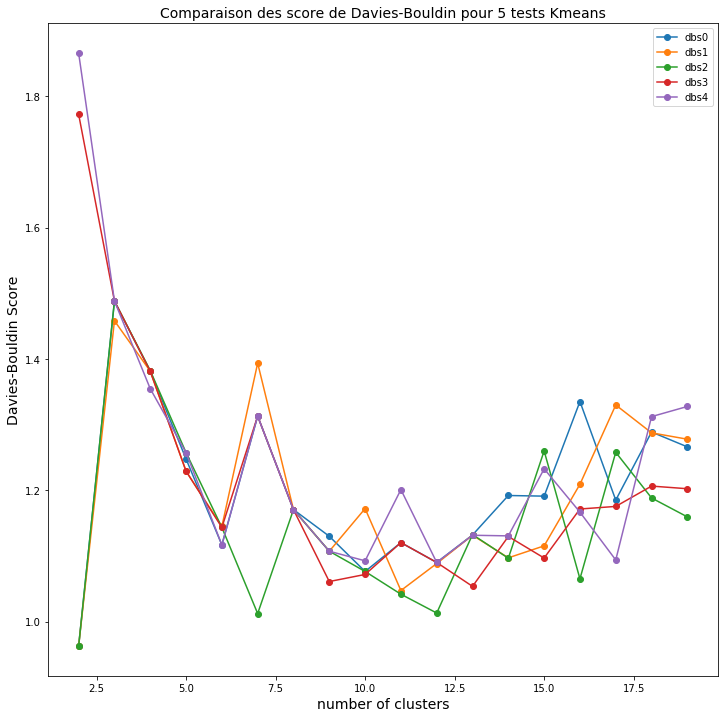

In [241]:
plt.figure(figsize=[12,12])
for col in summary_DBS.columns:
    plt.plot(range(2,20),summary_DBS[col],marker='o',label=col)
plt.title('Comparaison des score de Davies-Bouldin pour 5 tests Kmeans',fontsize=14)
plt.xlabel('number of clusters',fontsize=14)
plt.ylabel('Davies-Bouldin Score',fontsize=14)
plt.legend()


#### Kmeans - 8 Clusters

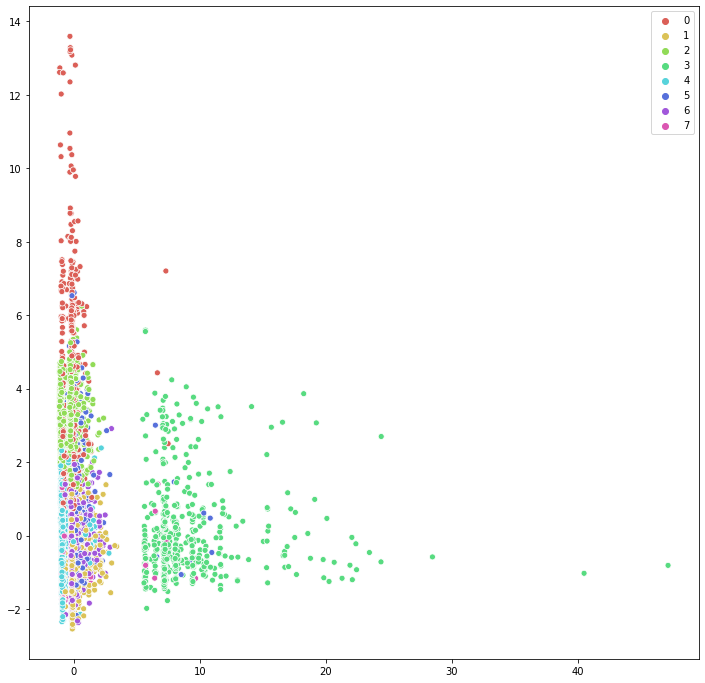

In [334]:
fig = plt.figure(figsize=[12,12])

cls8 = cluster.KMeans(n_clusters=8)
cls8.fit(first_data_scaled)
sns.scatterplot(first_data_trans[:,0 ],
                first_data_trans[:,1],
                hue=cls8.labels_,
                legend='full',
                palette=sns.color_palette("hls", 8))

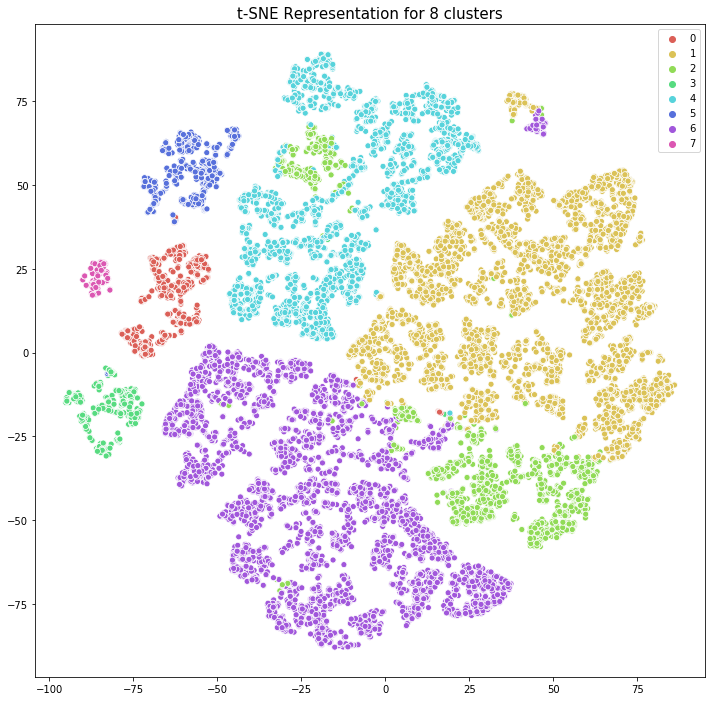

In [349]:
fig = plt.figure(figsize=[12,12])
sns.scatterplot(first_data_TSNE[:,0 ],
                first_data_TSNE[:,1],
                hue=cls8.labels_,
                legend='full',
                palette=sns.color_palette("hls", 8))
plt.title('t-SNE Representation for 8 clusters',fontsize=15)
plt.legend()

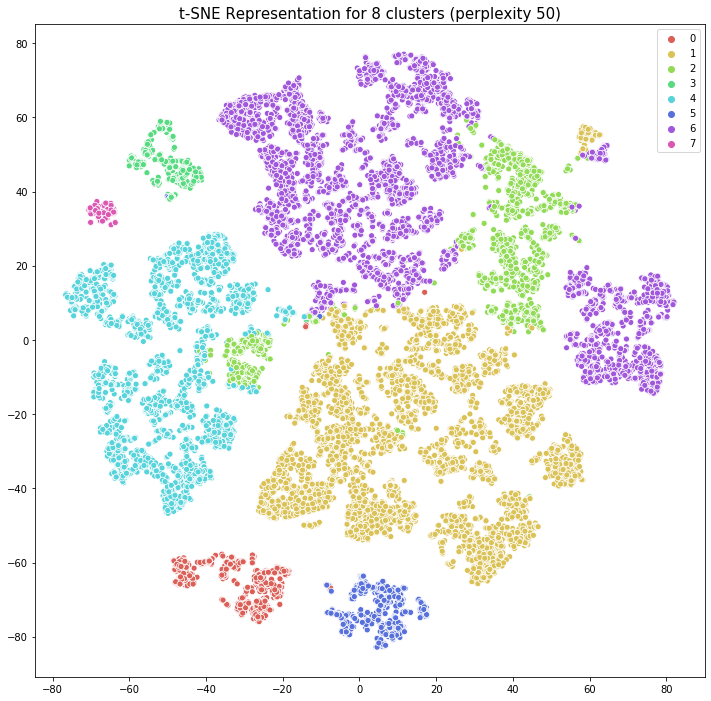

In [350]:
fig = plt.figure(figsize=[12,12])
sns.scatterplot(first_data_TSNE3[:,0 ],
                first_data_TSNE3[:,1],
                hue=cls8.labels_,
                legend='full',
                palette=sns.color_palette("hls", 8))
plt.title('t-SNE Representation for 8 clusters (perplexity 50)',fontsize=15)
plt.legend()

Analysis of clusters using: KMeans()
_______________________



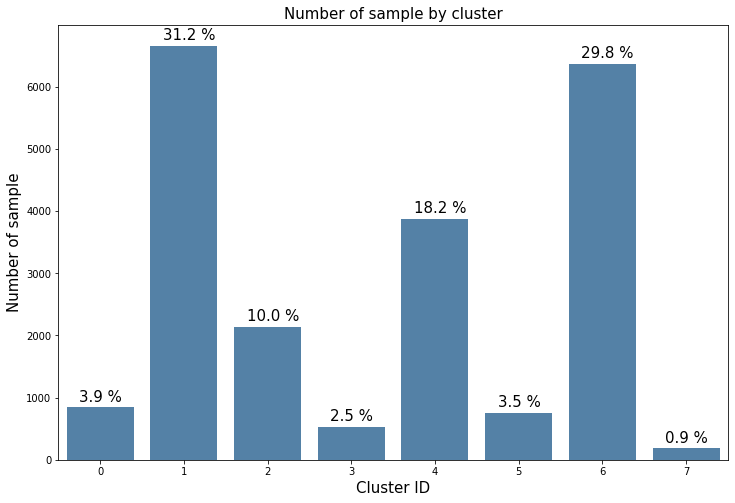

Int64Index([0, 1, 2, 3, 4, 5, 6, 7], dtype='int64')
Cluster ID: 0

Feature with higher values: ['late_delivery', 'delivery_lead_time', 'lat_customer', 'long_customer']
Feature with lower values: ['review_mean_score']


Cluster ID: 1

Feature with higher values: ['payment_type_credit_card']
Feature with lower values: ['recency', 'dist_seller_customer', 'lat_customer', 'long_customer']


Cluster ID: 2

Feature with higher values: ['dist_seller_customer', 'delivery_lead_time', 'lat_customer', 'long_customer']
Feature with lower values: []


Cluster ID: 3

Feature with higher values: ['nb_of_orders', 'nb_of_items', 'nb_of_reviews', 'payment_value', 'payment_type_credit_card']
Feature with lower values: ['lat_customer', 'long_customer']


Cluster ID: 4

Feature with higher values: ['payment_type_boleto']
Feature with lower values: ['payment_type_credit_card', 'lat_customer', 'long_customer']


Cluster ID: 5

Feature with higher values: ['multi_payment_types', 'payment_type_voucher', 'lat_cu

,features_higher,features_lower
0,"['late_delivery', 'delivery_lead_time', 'lat_c...",['review_mean_score']
1,['payment_type_credit_card'],"['recency', 'dist_seller_customer', 'lat_custo..."
2,"['dist_seller_customer', 'delivery_lead_time',...",[]
3,"['nb_of_orders', 'nb_of_items', 'nb_of_reviews...","['lat_customer', 'long_customer']"
4,['payment_type_boleto'],"['payment_type_credit_card', 'lat_customer', '..."
5,"['multi_payment_types', 'payment_type_voucher'...",[]
6,"['recency', 'payment_type_credit_card']","['dist_seller_customer', 'lat_customer', 'long..."
7,['payment_type_debit_card'],"['dist_seller_customer', 'payment_value', 'pay..."


In [354]:
cluster_analysis(cls8,first_data,0.25)

#### [The chosen one] Kmeans- 9 Clusters

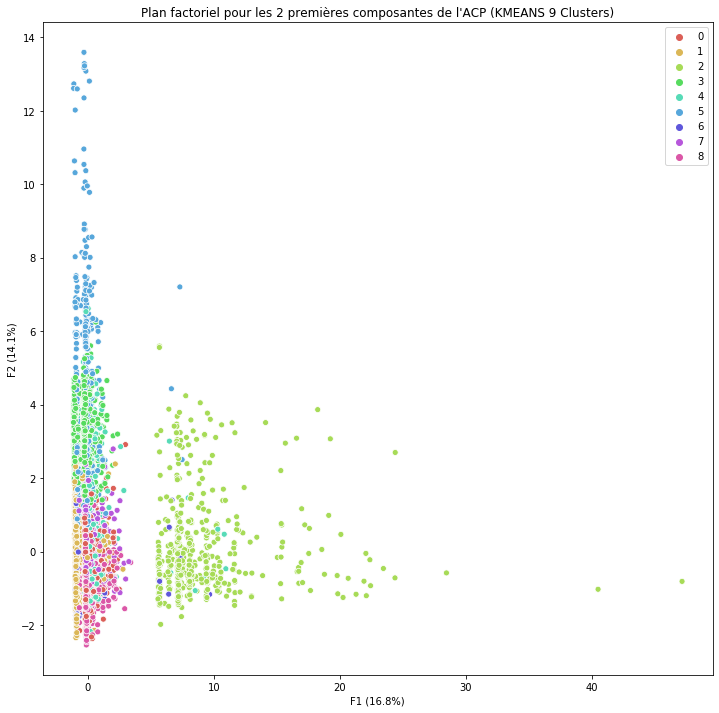

In [614]:
fig = plt.figure(figsize=[12,12])
cls9 = cluster.KMeans(n_clusters=9)
cls9.fit(first_data_scaled)
sns.scatterplot(first_data_trans[:,0 ],
                first_data_trans[:,1],
                hue=cls9.labels_,
                legend='full',
                palette=sns.color_palette("hls",9))
plt.title("Plan factoriel pour les 2 premières composantes de l'ACP (KMEANS 9 Clusters)")
plt.xlabel('F1 ({}%)'.format(np.around(pca.explained_variance_ratio_[0]*100,1)))
plt.ylabel('F2 ({}%)'.format(np.around(pca.explained_variance_ratio_[1]*100,1)))
plt.legend()

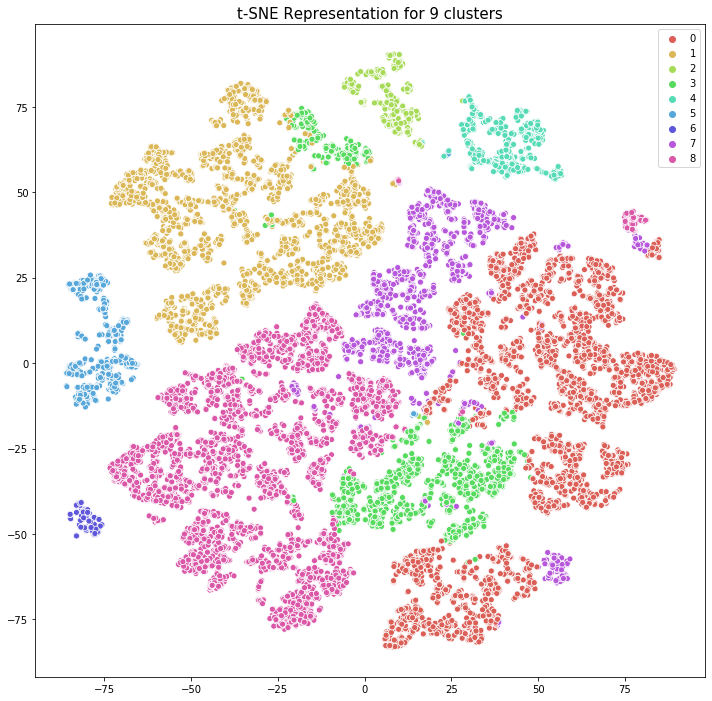

In [615]:
fig = plt.figure(figsize=[12,12])
sns.scatterplot(first_data_TSNE[:,0 ],
                first_data_TSNE[:,1],
                hue=cls9.labels_,
                legend='full',
                palette=sns.color_palette("hls", 9))
plt.title('t-SNE Representation for 9 clusters',fontsize=15)

plt.legend()

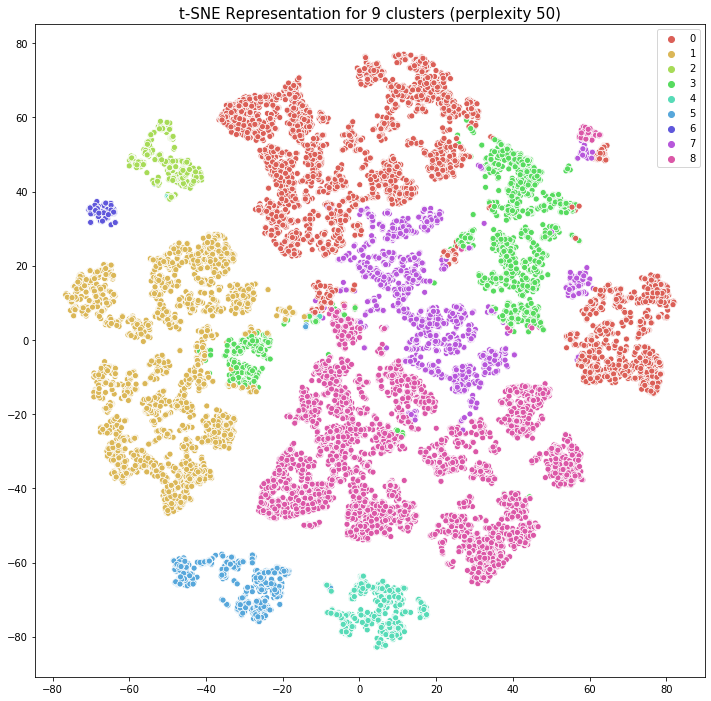

In [616]:
fig = plt.figure(figsize=[12,12])
sns.scatterplot(first_data_TSNE3[:,0 ],
                first_data_TSNE3[:,1],
                hue=cls9.labels_,
                legend='full',
                palette=sns.color_palette("hls", 9))

plt.title('t-SNE Representation for 9 clusters (perplexity 50)',fontsize=15)

plt.legend()

Analysis of clusters using: KMeans(n_clusters=9)
_______________________



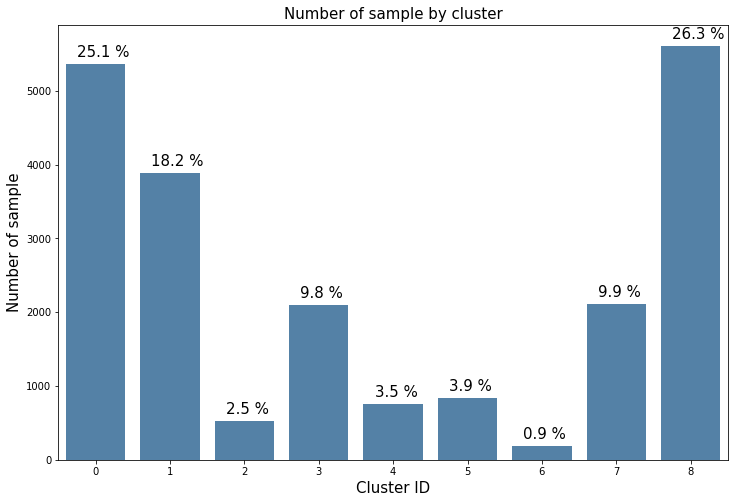

Int64Index([0, 1, 2, 3, 4, 5, 6, 7, 8], dtype='int64')
Cluster ID: 0

Feature with higher values: ['recency', 'payment_type_credit_card']
Feature with lower values: ['dist_seller_customer', 'lat_customer', 'long_customer']


Cluster ID: 1

Feature with higher values: ['payment_type_boleto']
Feature with lower values: ['payment_type_credit_card', 'lat_customer', 'long_customer']


Cluster ID: 2

Feature with higher values: ['nb_of_orders', 'nb_of_items', 'nb_of_reviews', 'payment_value', 'payment_type_credit_card']
Feature with lower values: ['lat_customer', 'long_customer']


Cluster ID: 3

Feature with higher values: ['dist_seller_customer', 'delivery_lead_time', 'lat_customer', 'long_customer']
Feature with lower values: []


Cluster ID: 4

Feature with higher values: ['multi_payment_types', 'payment_type_voucher', 'lat_customer', 'long_customer']
Feature with lower values: []


Cluster ID: 5

Feature with higher values: ['late_delivery', 'delivery_lead_time', 'lat_customer', 'long_c

,features_higher,features_lower
0,"['recency', 'payment_type_credit_card']","['dist_seller_customer', 'lat_customer', 'long..."
1,['payment_type_boleto'],"['payment_type_credit_card', 'lat_customer', '..."
2,"['nb_of_orders', 'nb_of_items', 'nb_of_reviews...","['lat_customer', 'long_customer']"
3,"['dist_seller_customer', 'delivery_lead_time',...",[]
4,"['multi_payment_types', 'payment_type_voucher'...",[]
5,"['late_delivery', 'delivery_lead_time', 'lat_c...",['review_mean_score']
6,['payment_type_debit_card'],"['dist_seller_customer', 'payment_value', 'pay..."
7,['payment_type_credit_card'],"['dist_seller_customer', 'review_mean_score', ..."
8,['payment_type_credit_card'],"['recency', 'dist_seller_customer', 'lat_custo..."


In [612]:
cls9 = cluster.KMeans(n_clusters=9)
cls9.fit(first_data_scaled)
cluster_analysis(cls9,cls9.labels_,first_data,0.25)

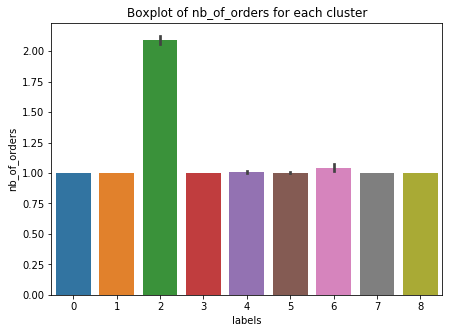

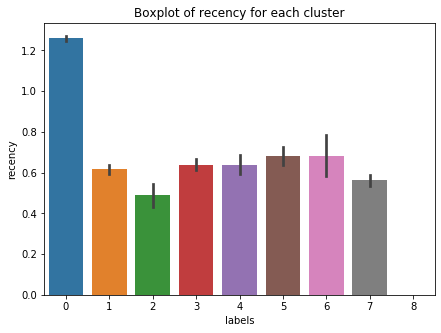

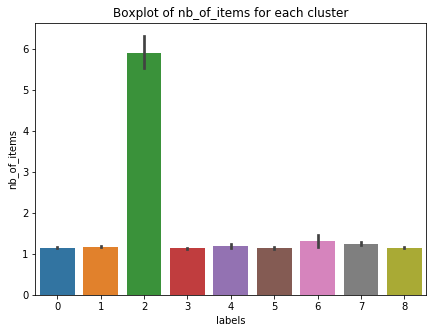

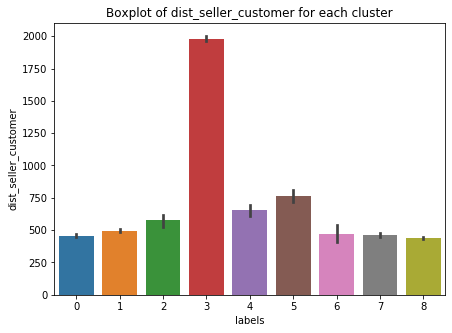

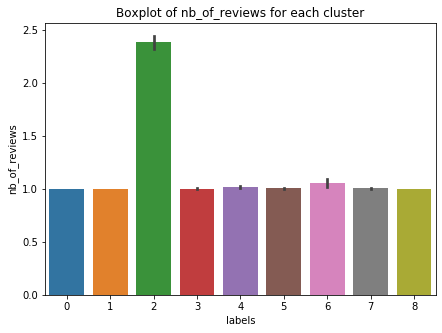

...

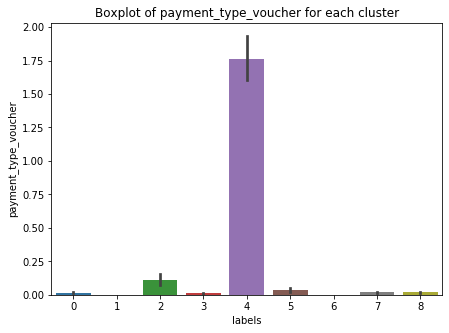

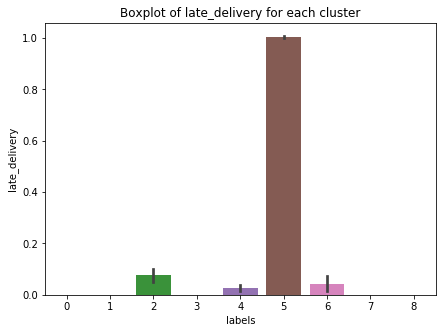

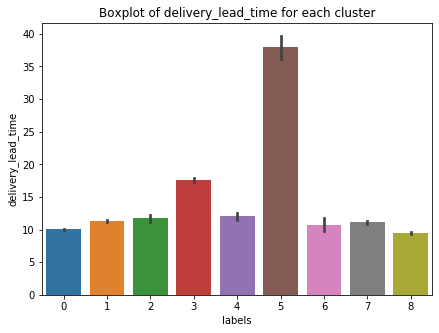

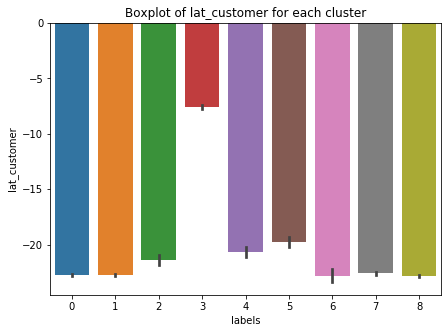

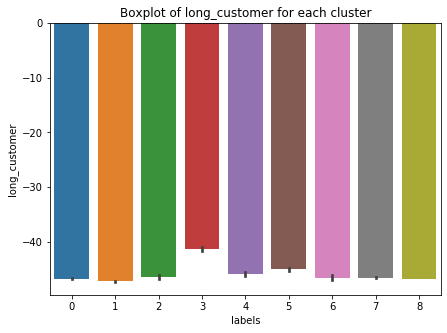

In [613]:
cluster_distribution(cls9.labels_,first_data)

#### Kmeans - 10 Clusters

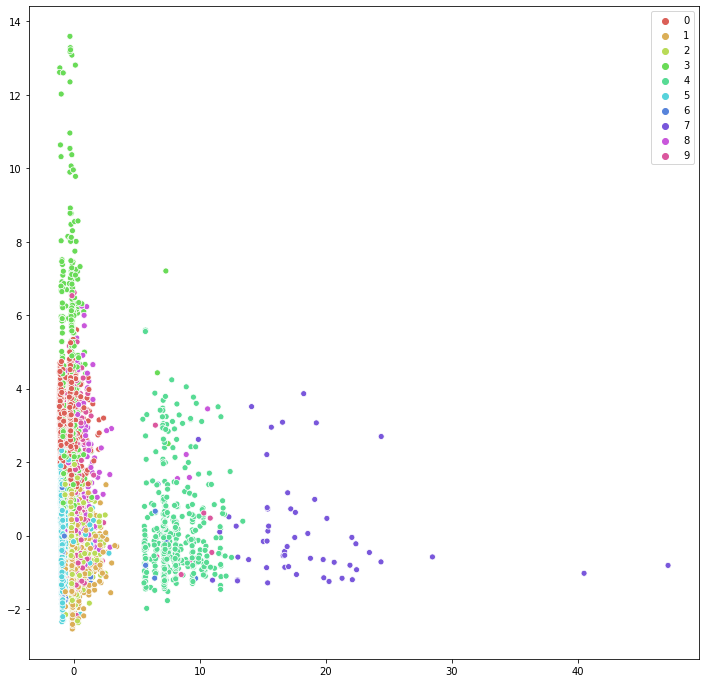

In [359]:
fig = plt.figure(figsize=[12,12])

cls10 = cluster.KMeans(n_clusters=10)
cls10.fit(first_data_scaled)
sns.scatterplot(first_data_trans[:,0 ],
                first_data_trans[:,1],
                hue=cls10.labels_,
                legend='full',
                palette=sns.color_palette("hls", 10))


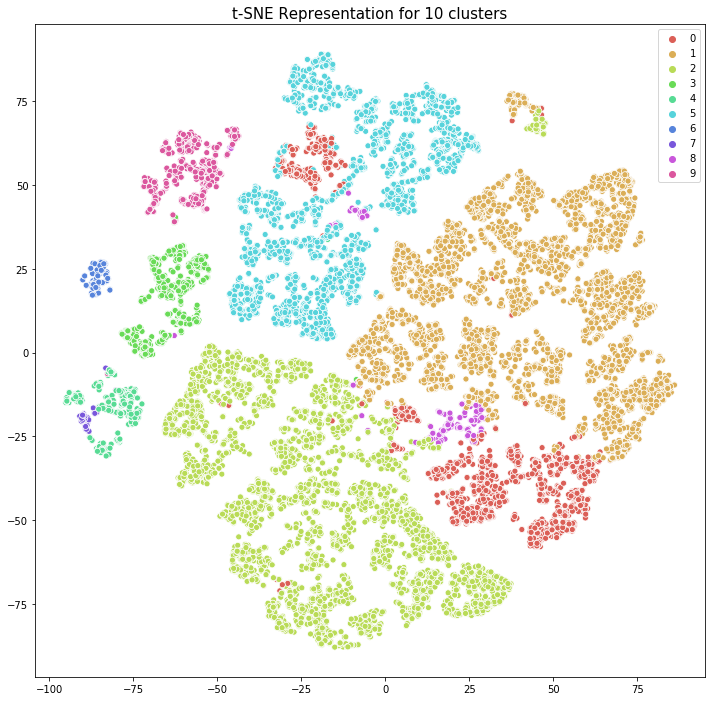

In [348]:
fig = plt.figure(figsize=[12,12])
sns.scatterplot(first_data_TSNE[:,0 ],
                first_data_TSNE[:,1],
                hue=cls10.labels_,
                legend='full',
                palette=sns.color_palette("hls", 10))
plt.title('t-SNE Representation for 10 clusters',fontsize=15)
plt.legend()

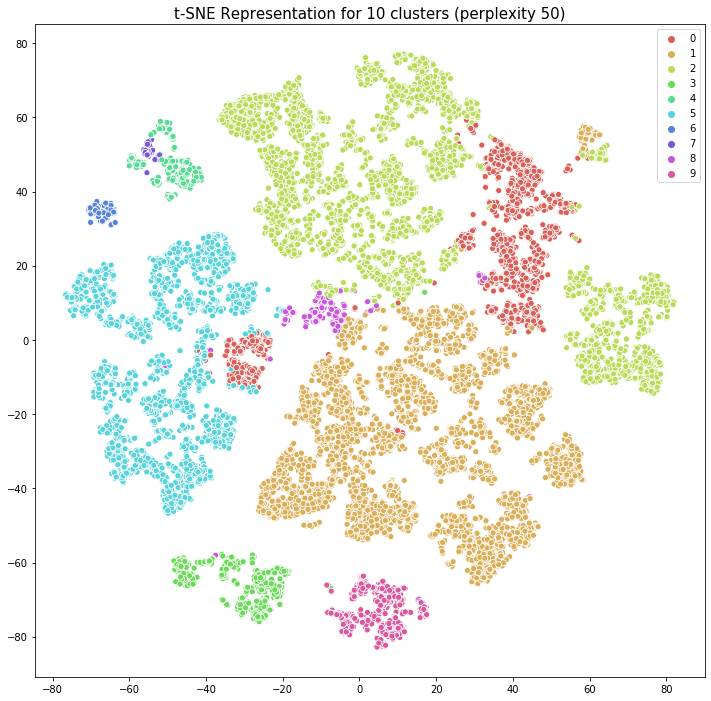

In [352]:
fig = plt.figure(figsize=[12,12])
sns.scatterplot(first_data_TSNE3[:,0 ],
                first_data_TSNE3[:,1],
                hue=cls10.labels_,
                legend='full',
                palette=sns.color_palette("hls", 10))
plt.title('t-SNE Representation for 10 clusters (perplexity 50)',fontsize=15)

plt.legend()

Analysis of clusters using: KMeans(n_clusters=10)
_______________________



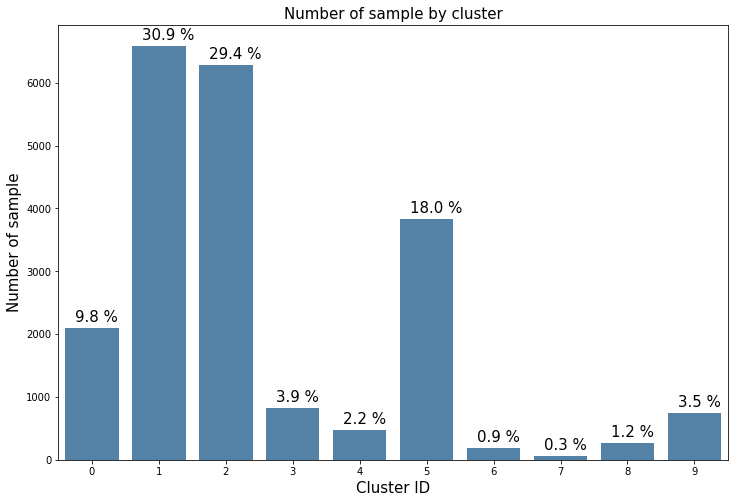

Int64Index([0, 1, 2, 3, 4, 5, 6, 7, 8, 9], dtype='int64')
Cluster ID: 0

Feature with higher values: ['dist_seller_customer', 'delivery_lead_time', 'lat_customer', 'long_customer']
Feature with lower values: []


Cluster ID: 1

Feature with higher values: ['payment_type_credit_card']
Feature with lower values: ['recency', 'dist_seller_customer', 'lat_customer', 'long_customer']


Cluster ID: 2

Feature with higher values: ['recency', 'payment_type_credit_card']
Feature with lower values: ['dist_seller_customer', 'lat_customer', 'long_customer']


Cluster ID: 3

Feature with higher values: ['late_delivery', 'delivery_lead_time', 'lat_customer', 'long_customer']
Feature with lower values: ['review_mean_score']


Cluster ID: 4

Feature with higher values: ['nb_of_orders', 'nb_of_items', 'nb_of_reviews', 'payment_value', 'payment_type_credit_card']
Feature with lower values: ['lat_customer']


Cluster ID: 5

Feature with higher values: ['payment_type_boleto']
Feature with lower values: ['p

,features_higher,features_lower
0,"['dist_seller_customer', 'delivery_lead_time',...",[]
1,['payment_type_credit_card'],"['recency', 'dist_seller_customer', 'lat_custo..."
2,"['recency', 'payment_type_credit_card']","['dist_seller_customer', 'lat_customer', 'long..."
3,"['late_delivery', 'delivery_lead_time', 'lat_c...",['review_mean_score']
4,"['nb_of_orders', 'nb_of_items', 'nb_of_reviews...",['lat_customer']
5,['payment_type_boleto'],"['payment_type_credit_card', 'lat_customer', '..."
6,['payment_type_debit_card'],"['dist_seller_customer', 'payment_value', 'pay..."
7,"['nb_of_orders', 'nb_of_items', 'nb_of_reviews...","['lat_customer', 'long_customer']"
8,"['dist_seller_customer', 'payment_value', 'lat...",[]
9,"['multi_payment_types', 'payment_type_voucher'...",[]


In [332]:
cluster_analysis(cls10,first_data,0.25)

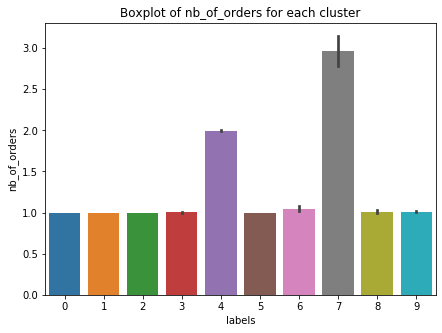

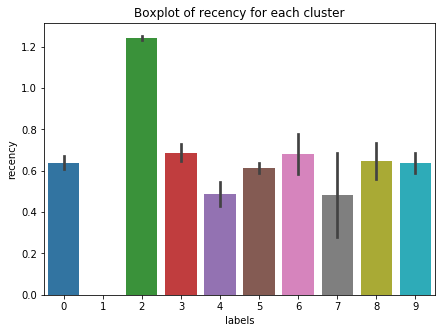

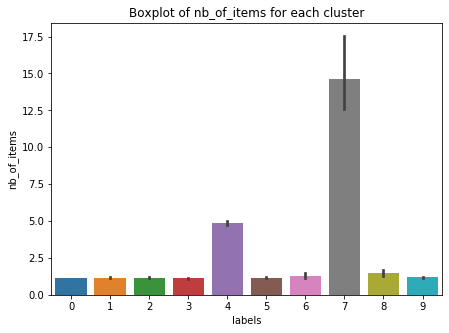

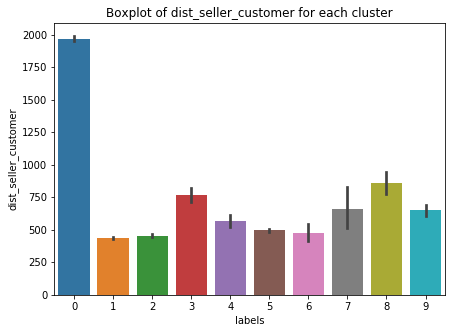

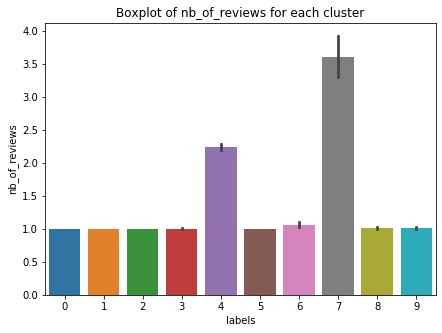

...

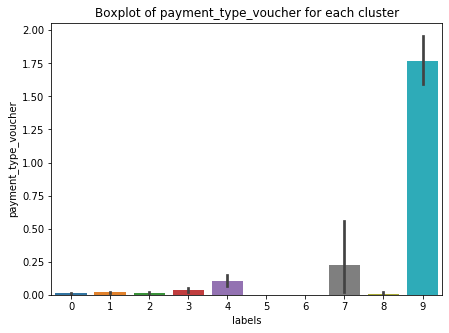

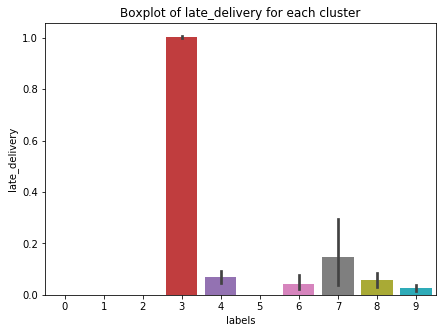

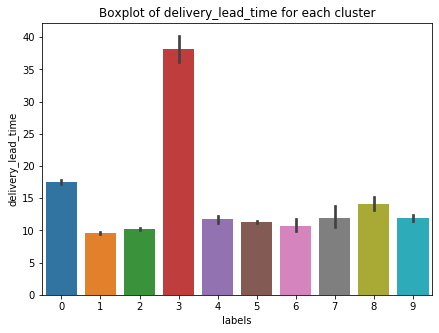

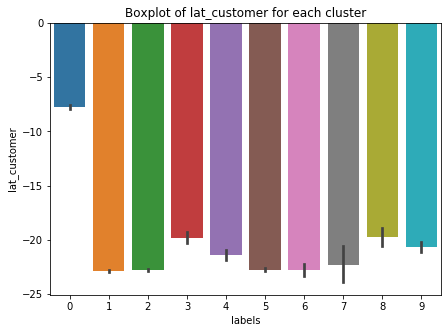

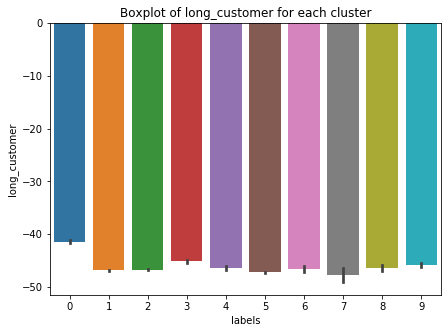

In [333]:
cluster_distribution(cls10.labels_,first_data)

#### K-means conclusion

Here, after observation the k-means 9clusters will be the one we choose (good repartition and cluster caracteristics really relevant)

### Gaussian Mixture Model

#### Scoring

In [259]:
summary_silhouettes=pd.DataFrame()
silhouettes=[]

for k in range(5):
    
    for i in range(2,20):
        gmm= mixture.GaussianMixture(n_components=i)
        labels=gmm.fit_predict(first_data_scaled)
        silh= metrics.silhouette_score(first_data_scaled,labels)
        silhouettes.append(silh)
        
    summary_silhouettes['sil{}'.format(k)]=silhouettes
    silhouettes=[]

summary_silhouettes

,sil0,sil1,sil2,sil3,sil4
0,0.516153,0.255913,0.527764,0.571014,0.571014
1,0.270804,0.249942,0.264580,0.411293,0.272807
2,0.443437,0.363178,0.363178,0.432236,0.393293
3,0.281548,0.280392,0.280392,0.315690,0.297720
4,0.219444,0.172359,0.219444,0.170263,0.273182
5,0.223214,0.193032,0.305415,0.201185,0.305373
6,0.251141,0.256776,0.311274,0.210147,0.311274
7,0.209275,0.155723,0.254264,0.180290,0.209275
8,0.174758,0.181316,0.207220,0.285739,0.190401
9,0.206510,0.207132,0.170170,0.182702,0.210343


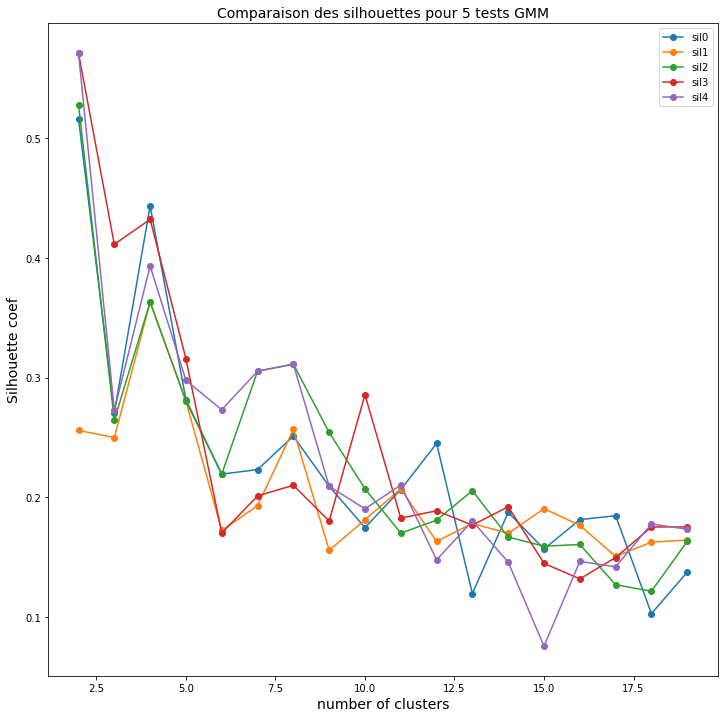

In [260]:
plt.figure(figsize=[12,12])
for col in summary_silhouettes.columns:
    plt.plot(range(2,20),summary_silhouettes[col],marker='o',label=col)
plt.title('Comparaison des silhouettes pour 5 tests GMM',fontsize=14)
plt.xlabel('number of clusters',fontsize=14)
plt.ylabel('Silhouette coef',fontsize=14)
plt.legend()


#### GMM - 4 Clusters

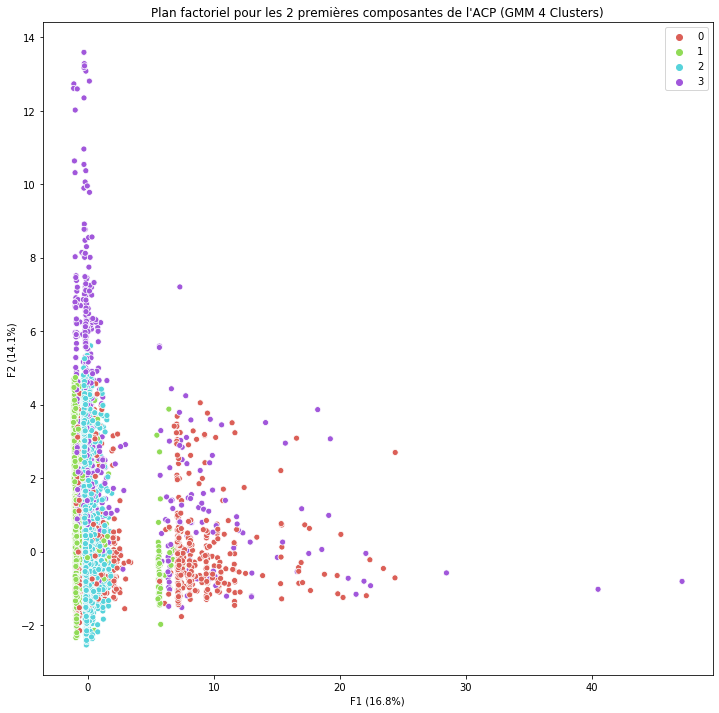

In [589]:
fig = plt.figure(figsize=[12,12])
gmm4 = mixture.GaussianMixture(n_components=4)
gmm_labels=gmm4.fit_predict(first_data_scaled)
sns.scatterplot(first_data_trans[:,0 ],
                first_data_trans[:,1],
                hue=gmm_labels,
                legend='full',
                palette=sns.color_palette("hls",4))
plt.title("Plan factoriel pour les 2 premières composantes de l'ACP (GMM 4 Clusters)")
plt.xlabel('F1 ({}%)'.format(np.around(pca.explained_variance_ratio_[0]*100,1)))
plt.ylabel('F2 ({}%)'.format(np.around(pca.explained_variance_ratio_[1]*100,1)))
plt.legend()

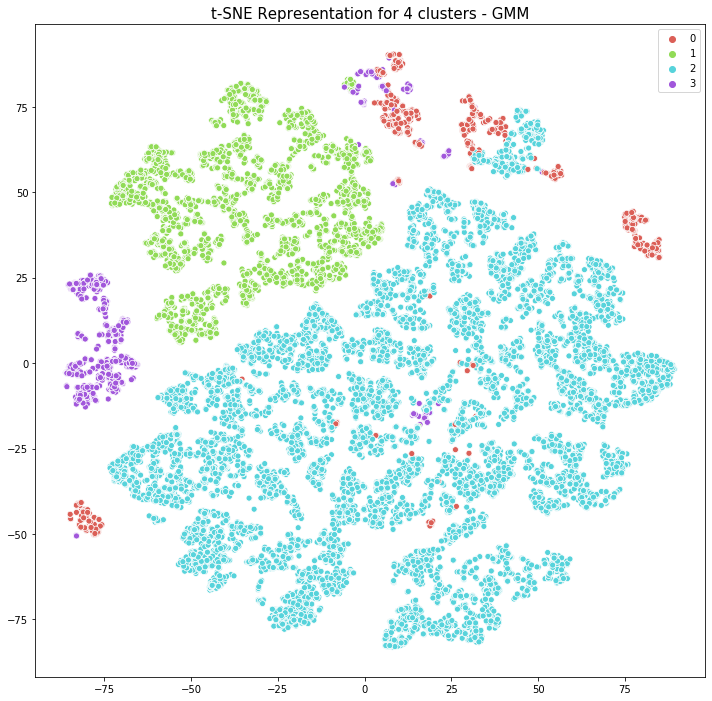

In [590]:
fig = plt.figure(figsize=[12,12])

sns.scatterplot(first_data_TSNE[:,0 ],
                first_data_TSNE[:,1],
                hue=gmm_labels,
                legend='full',
                palette=sns.color_palette("hls", 4))
plt.title('t-SNE Representation for 4 clusters - GMM',fontsize=15)

plt.legend()

Analysis of clusters using: GaussianMixture(n_components=4)
_______________________



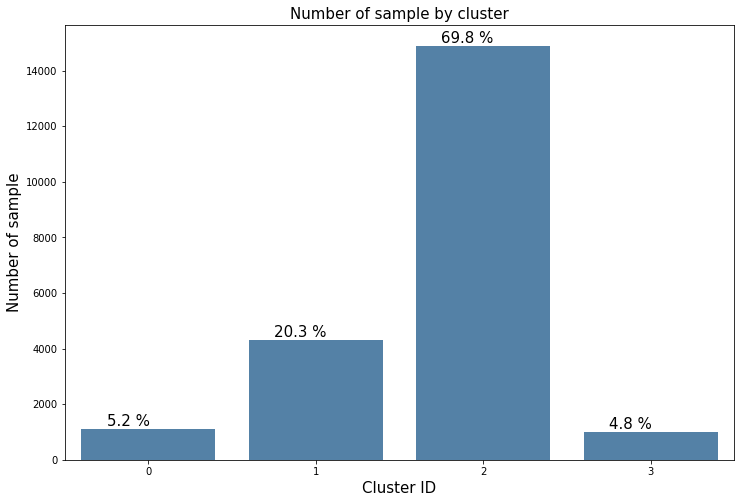

Int64Index([0, 1, 2, 3], dtype='int64')
Cluster ID: 0

Feature with higher values: ['nb_of_orders', 'nb_of_items', 'nb_of_reviews', 'payment_type_voucher']
Feature with lower values: ['lat_customer']


Cluster ID: 1

Feature with higher values: ['payment_type_boleto']
Feature with lower values: ['payment_type_credit_card', 'long_customer']


Cluster ID: 2

Feature with higher values: ['payment_type_credit_card']
Feature with lower values: []


Cluster ID: 3

Feature with higher values: ['nb_of_items', 'payment_value', 'late_delivery', 'delivery_lead_time', 'lat_customer', 'long_customer']
Feature with lower values: ['review_mean_score']


Analysis Done


,features_higher,features_lower
0,"['nb_of_orders', 'nb_of_items', 'nb_of_reviews...",['lat_customer']
1,['payment_type_boleto'],"['payment_type_credit_card', 'long_customer']"
2,['payment_type_credit_card'],[]
3,"['nb_of_items', 'payment_value', 'late_deliver...",['review_mean_score']


In [591]:
cluster_analysis(gmm4,gmm_labels,first_data,0.25)

#### GMM - 8 Clusters

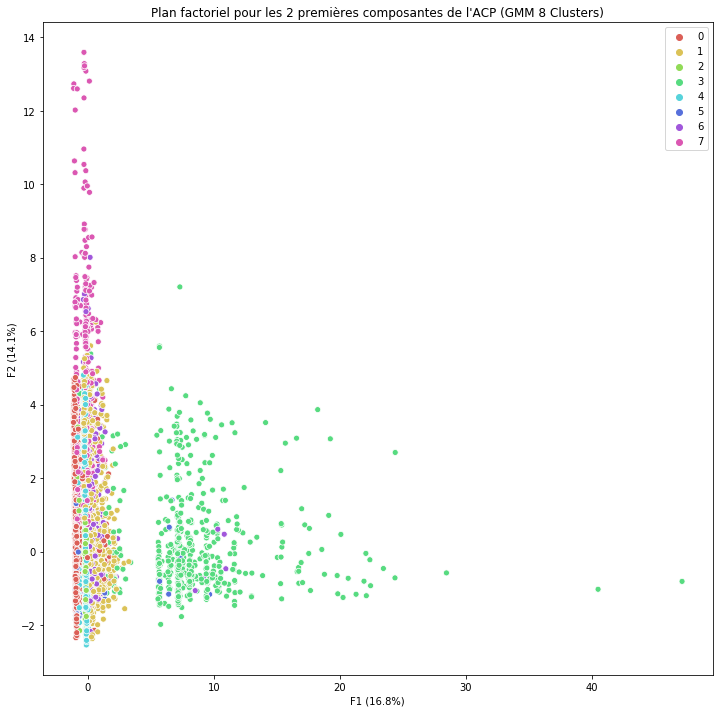

In [583]:
fig = plt.figure(figsize=[12,12])
gmm8 = mixture.GaussianMixture(n_components=8)
gmm_labels=gmm8.fit_predict(first_data_scaled)
sns.scatterplot(first_data_trans[:,0 ],
                first_data_trans[:,1],
                hue=gmm_labels,
                legend='full',
                palette=sns.color_palette("hls",8))
plt.title("Plan factoriel pour les 2 premières composantes de l'ACP (GMM 8 Clusters)")
plt.xlabel('F1 ({}%)'.format(np.around(pca.explained_variance_ratio_[0]*100,1)))
plt.ylabel('F2 ({}%)'.format(np.around(pca.explained_variance_ratio_[1]*100,1)))
plt.legend()

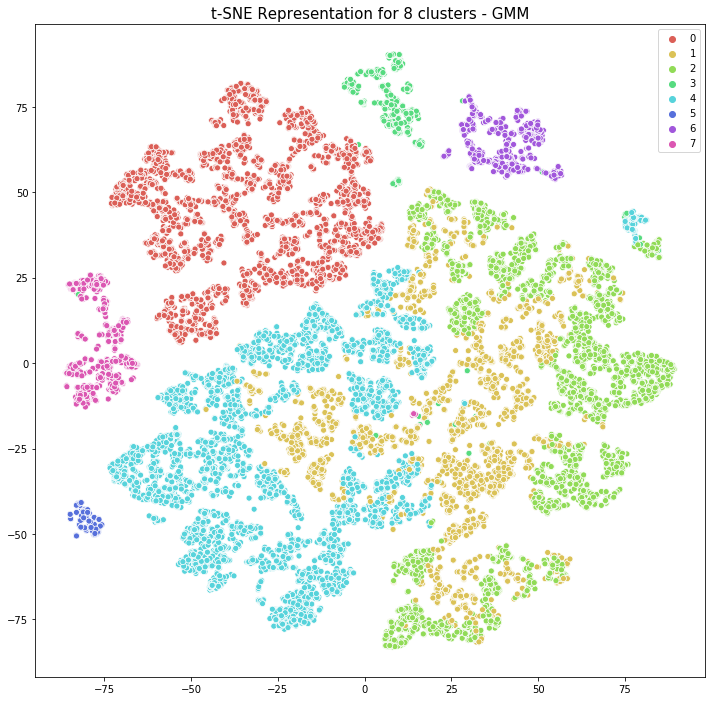

In [584]:
fig = plt.figure(figsize=[12,12])
sns.scatterplot(first_data_TSNE[:,0 ],
                first_data_TSNE[:,1],
                hue=gmm_labels,
                legend='full',
                palette=sns.color_palette("hls", 8))
plt.title('t-SNE Representation for 8 clusters - GMM',fontsize=15)

plt.legend()

Analysis of clusters using: GaussianMixture(n_components=8)
_______________________



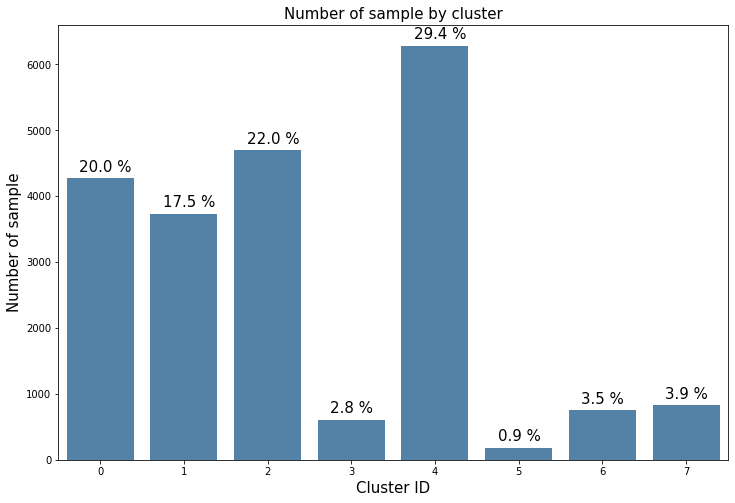

Int64Index([0, 1, 2, 3, 4, 5, 6, 7], dtype='int64')
Cluster ID: 0

Feature with higher values: ['payment_type_boleto']
Feature with lower values: ['payment_type_credit_card', 'long_customer']


Cluster ID: 1

Feature with higher values: ['recency', 'nb_of_items', 'dist_seller_customer', 'payment_value', 'payment_type_credit_card', 'lat_customer']
Feature with lower values: []


Cluster ID: 2

Feature with higher values: ['recency', 'payment_type_credit_card']
Feature with lower values: ['dist_seller_customer', 'payment_value', 'lat_customer', 'long_customer']


Cluster ID: 3

Feature with higher values: ['nb_of_orders', 'nb_of_items', 'nb_of_reviews', 'payment_value', 'payment_type_credit_card']
Feature with lower values: ['long_customer']


Cluster ID: 4

Feature with higher values: ['payment_type_credit_card']
Feature with lower values: ['recency', 'payment_value', 'lat_customer']


Cluster ID: 5

Feature with higher values: ['payment_type_debit_card']
Feature with lower values: ['di

,features_higher,features_lower
0,['payment_type_boleto'],"['payment_type_credit_card', 'long_customer']"
1,"['recency', 'nb_of_items', 'dist_seller_custom...",[]
2,"['recency', 'payment_type_credit_card']","['dist_seller_customer', 'payment_value', 'lat..."
3,"['nb_of_orders', 'nb_of_items', 'nb_of_reviews...",['long_customer']
4,['payment_type_credit_card'],"['recency', 'payment_value', 'lat_customer']"
5,['payment_type_debit_card'],"['dist_seller_customer', 'payment_value', 'pay..."
6,"['multi_payment_types', 'payment_type_voucher'...",[]
7,"['late_delivery', 'delivery_lead_time', 'lat_c...",['review_mean_score']


In [585]:
cluster_analysis(gmm8,gmm_labels,first_data,0.25)

#### GMM - 9 Clusters

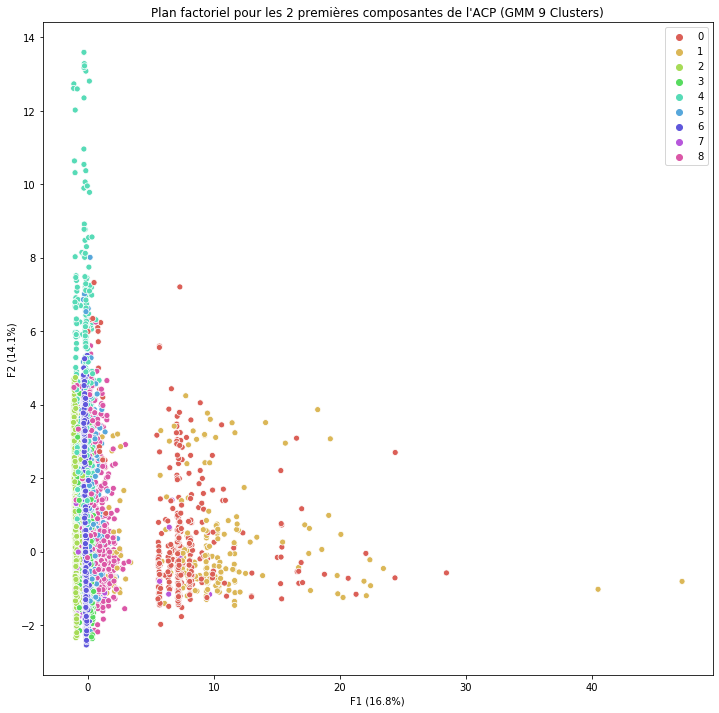

In [586]:
fig = plt.figure(figsize=[12,12])
gmm9 = mixture.GaussianMixture(n_components=9)
gmm_labels=gmm9.fit_predict(first_data_scaled)
sns.scatterplot(first_data_trans[:,0 ],
                first_data_trans[:,1],
                hue=gmm_labels,
                legend='full',
                palette=sns.color_palette("hls",9))
plt.title("Plan factoriel pour les 2 premières composantes de l'ACP (GMM 9 Clusters)")
plt.xlabel('F1 ({}%)'.format(np.around(pca.explained_variance_ratio_[0]*100,1)))
plt.ylabel('F2 ({}%)'.format(np.around(pca.explained_variance_ratio_[1]*100,1)))
plt.legend()

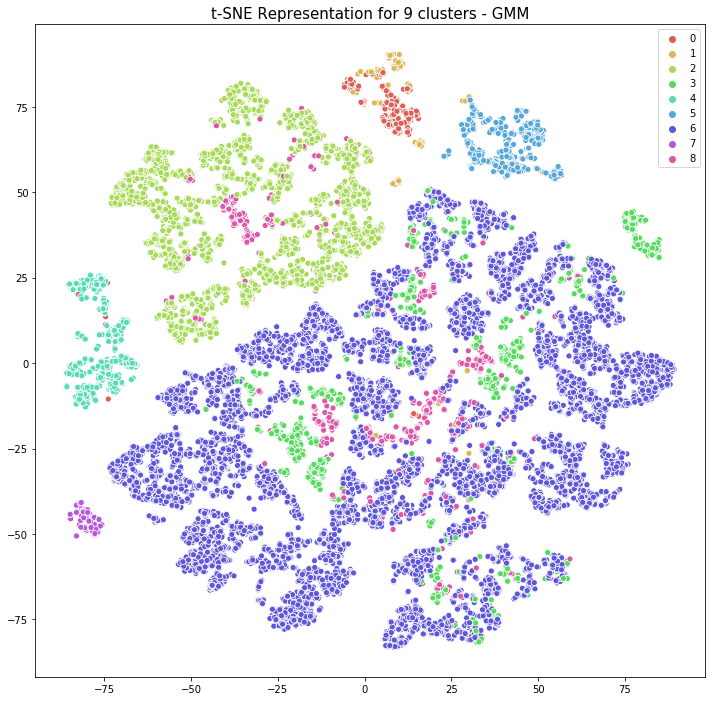

In [587]:
fig = plt.figure(figsize=[12,12])
sns.scatterplot(first_data_TSNE[:,0 ],
                first_data_TSNE[:,1],
                hue=gmm_labels,
                legend='full',
                palette=sns.color_palette("hls", 9))
plt.title('t-SNE Representation for 9 clusters - GMM',fontsize=15)

plt.legend()

Analysis of clusters using: GaussianMixture(n_components=9)
_______________________



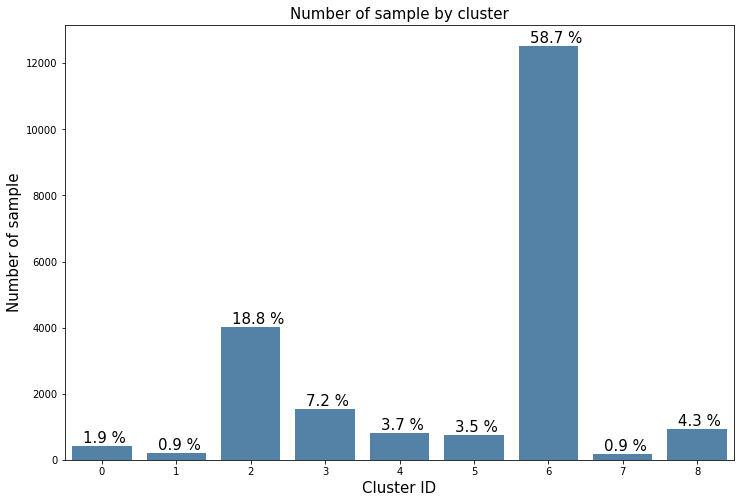

Int64Index([0, 1, 2, 3, 4, 5, 6, 7, 8], dtype='int64')
Cluster ID: 0

Feature with higher values: ['nb_of_orders', 'nb_of_items', 'nb_of_reviews', 'payment_value', 'payment_type_credit_card']
Feature with lower values: ['lat_customer']


Cluster ID: 1

Feature with higher values: ['nb_of_orders', 'nb_of_items', 'nb_of_reviews', 'payment_value', 'payment_type_credit_card', 'payment_type_voucher']
Feature with lower values: ['long_customer']


Cluster ID: 2

Feature with higher values: ['payment_type_boleto']
Feature with lower values: ['payment_value', 'payment_type_credit_card', 'lat_customer', 'long_customer']


Cluster ID: 3

Feature with higher values: ['nb_of_items']
Feature with lower values: ['lat_customer']


Cluster ID: 4

Feature with higher values: ['late_delivery', 'delivery_lead_time', 'lat_customer', 'long_customer']
Feature with lower values: ['review_mean_score']


Cluster ID: 5

Feature with higher values: ['multi_payment_types', 'payment_type_voucher', 'lat_customer', 

,features_higher,features_lower
0,"['nb_of_orders', 'nb_of_items', 'nb_of_reviews...",['lat_customer']
1,"['nb_of_orders', 'nb_of_items', 'nb_of_reviews...",['long_customer']
2,['payment_type_boleto'],"['payment_value', 'payment_type_credit_card', ..."
3,['nb_of_items'],['lat_customer']
4,"['late_delivery', 'delivery_lead_time', 'lat_c...",['review_mean_score']
5,"['multi_payment_types', 'payment_type_voucher'...",[]
6,['payment_type_credit_card'],[]
7,['payment_type_debit_card'],"['dist_seller_customer', 'payment_value', 'pay..."
8,"['nb_of_items', 'dist_seller_customer', 'payme...",['long_customer']


In [588]:
cluster_analysis(gmm9,gmm_labels,first_data,0.25)

The gaussian mixture provides us with interesting results but not better than k-means

### Agglomerative Clustering

#### Scoring

In [261]:
summary_silhouettes=pd.DataFrame()
silhouettes=[]

for k in range(5):
    
    for i in range(2,20):
        cls= cluster.AgglomerativeClustering(n_clusters=i,linkage='ward')
        cls.fit(first_data_scaled)
        silh= metrics.silhouette_score(first_data_scaled,cls.labels_)
        silhouettes.append(silh)
        
    summary_silhouettes['sil{}'.format(k)]=silhouettes
    silhouettes=[]

summary_silhouettes

,sil0,sil1,sil2,sil3,sil4
0,0.604703,0.604703,0.604703,0.604703,0.604703
1,0.335612,0.335612,0.335612,0.335612,0.335612
2,0.276520,0.276520,0.276520,0.276520,0.276520
3,0.308474,0.308474,0.308474,0.308474,0.308474
4,0.332381,0.332381,0.332381,0.332381,0.332381
5,0.326756,0.326756,0.326756,0.326756,0.326756
6,0.337348,0.337348,0.337348,0.337348,0.337348
7,0.340657,0.340657,0.340657,0.340657,0.340657
8,0.194095,0.194095,0.194095,0.194095,0.194095
9,0.209007,0.209007,0.209007,0.209007,0.209007


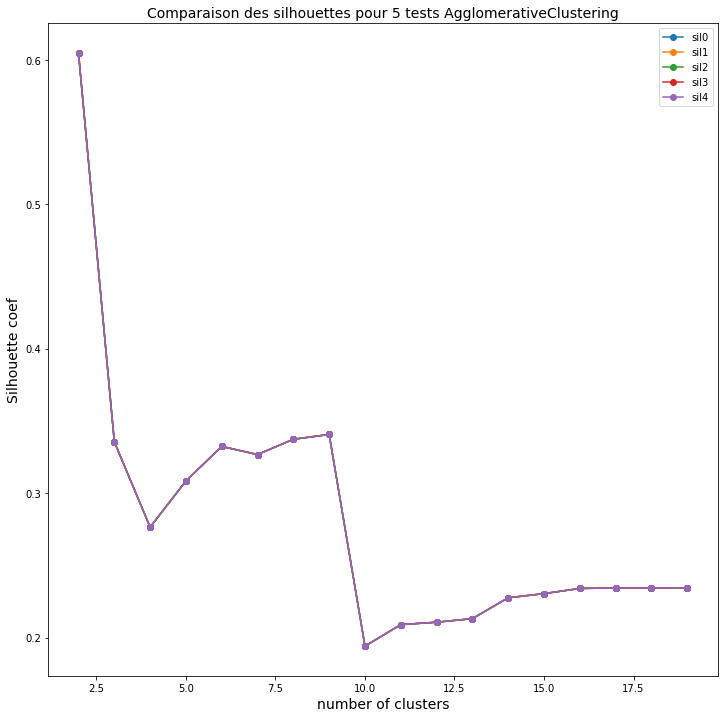

In [262]:
plt.figure(figsize=[12,12])
for col in summary_silhouettes.columns:
    plt.plot(range(2,20),summary_silhouettes[col],marker='o',label=col)
plt.title('Comparaison des silhouettes pour 5 tests AgglomerativeClustering',fontsize=14)
plt.xlabel('number of clusters',fontsize=14)
plt.ylabel('Silhouette coef',fontsize=14)
plt.legend()


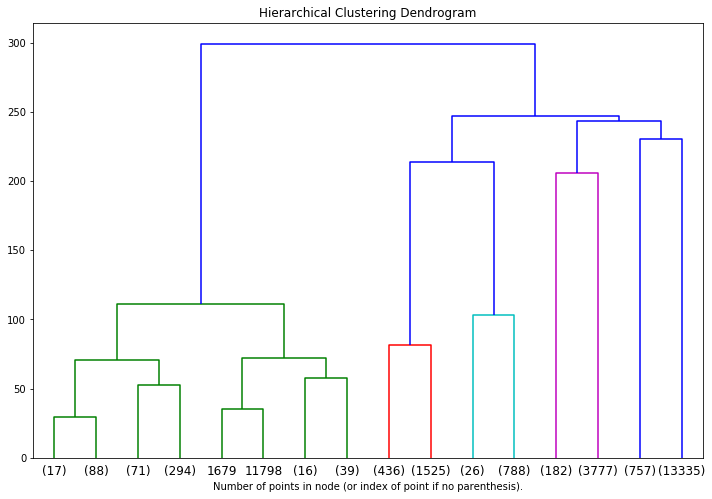

In [267]:
from scipy.cluster.hierarchy import dendrogram

def plot_dendrogram(model, **kwargs):
    # Create linkage matrix and then plot the dendrogram

    # create the counts of samples under each node
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1  # leaf node
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    linkage_matrix = np.column_stack([model.children_, model.distances_,
                                      counts]).astype(float)

    # Plot the corresponding dendrogram
    dendrogram(linkage_matrix, **kwargs)


# setting distance_threshold=0 ensures we compute the full tree.
model = cluster.AgglomerativeClustering(distance_threshold=0, n_clusters=None)

model = model.fit(first_data_scaled)
plt.figure(figsize=[12,8])
plt.title('Hierarchical Clustering Dendrogram')
# plot the top three levels of the dendrogram
plot_dendrogram(model, truncate_mode='level', p=3)
plt.xlabel("Number of points in node (or index of point if no parenthesis).")
plt.show()

#### Agglomerative Clustering - 6 Clusters

In [595]:
agg_6= cluster.AgglomerativeClustering(n_clusters=6,linkage='ward')
agg_6.fit(first_data_scaled)

AgglomerativeClustering(n_clusters=6)

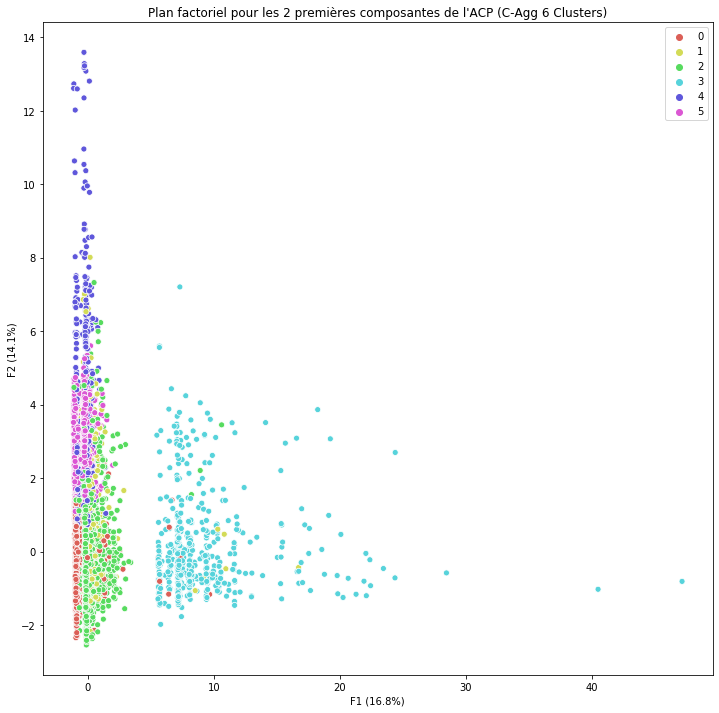

In [596]:
fig = plt.figure(figsize=[12,12])


sns.scatterplot(first_data_trans[:,0 ],
                first_data_trans[:,1],
                hue=agg_6.labels_,
                legend='full',
                palette=sns.color_palette("hls", len(np.unique(agg_6.labels_).tolist())))

plt.title("Plan factoriel pour les 2 premières composantes de l'ACP (C-Agg 6 Clusters)")
plt.xlabel('F1 ({}%)'.format(np.around(pca.explained_variance_ratio_[0]*100,1)))
plt.ylabel('F2 ({}%)'.format(np.around(pca.explained_variance_ratio_[1]*100,1)))
plt.legend()

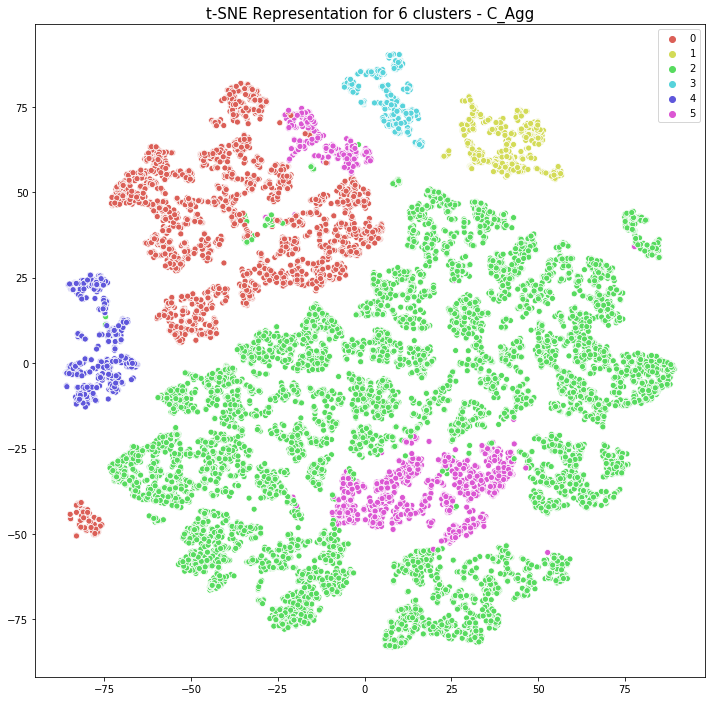

In [600]:
fig = plt.figure(figsize=[12,12])

sns.scatterplot(first_data_TSNE[:,0 ],
                first_data_TSNE[:,1],
                hue=agg_6.labels_,
                legend='full',
                palette=sns.color_palette("hls", 6))
plt.title('t-SNE Representation for 6 clusters - C_Agg',fontsize=15)

plt.legend()

Analysis of clusters using: AgglomerativeClustering(n_clusters=6)
_______________________



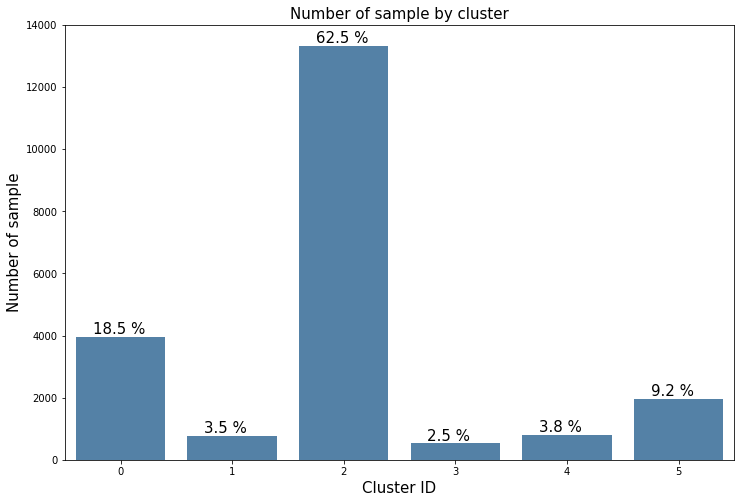

Int64Index([0, 1, 2, 3, 4, 5], dtype='int64')
Cluster ID: 0

Feature with higher values: ['payment_type_boleto']
Feature with lower values: ['dist_seller_customer', 'payment_value', 'payment_type_credit_card', 'lat_customer', 'long_customer']


Cluster ID: 1

Feature with higher values: ['multi_payment_types', 'payment_type_credit_card', 'payment_type_voucher', 'lat_customer', 'long_customer']
Feature with lower values: ['payment_type_boleto']


Cluster ID: 2

Feature with higher values: ['payment_type_credit_card']
Feature with lower values: ['dist_seller_customer', 'payment_type_boleto', 'lat_customer', 'long_customer']


Cluster ID: 3

Feature with higher values: ['nb_of_orders', 'nb_of_items', 'nb_of_reviews', 'payment_value', 'payment_type_boleto', 'payment_type_credit_card']
Feature with lower values: ['recency', 'lat_customer', 'long_customer']


Cluster ID: 4

Feature with higher values: ['dist_seller_customer', 'late_delivery', 'delivery_lead_time', 'lat_customer', 'long_custo

,features_higher,features_lower
0,['payment_type_boleto'],"['dist_seller_customer', 'payment_value', 'pay..."
1,"['multi_payment_types', 'payment_type_credit_c...",['payment_type_boleto']
2,['payment_type_credit_card'],"['dist_seller_customer', 'payment_type_boleto'..."
3,"['nb_of_orders', 'nb_of_items', 'nb_of_reviews...","['recency', 'lat_customer', 'long_customer']"
4,"['dist_seller_customer', 'late_delivery', 'del...",['review_mean_score']
5,"['dist_seller_customer', 'delivery_lead_time',...",[]


In [597]:
cluster_analysis(agg_6,agg_6.labels_,first_data,0.20)

#### Agglomerative Clustering - 7 Clusters

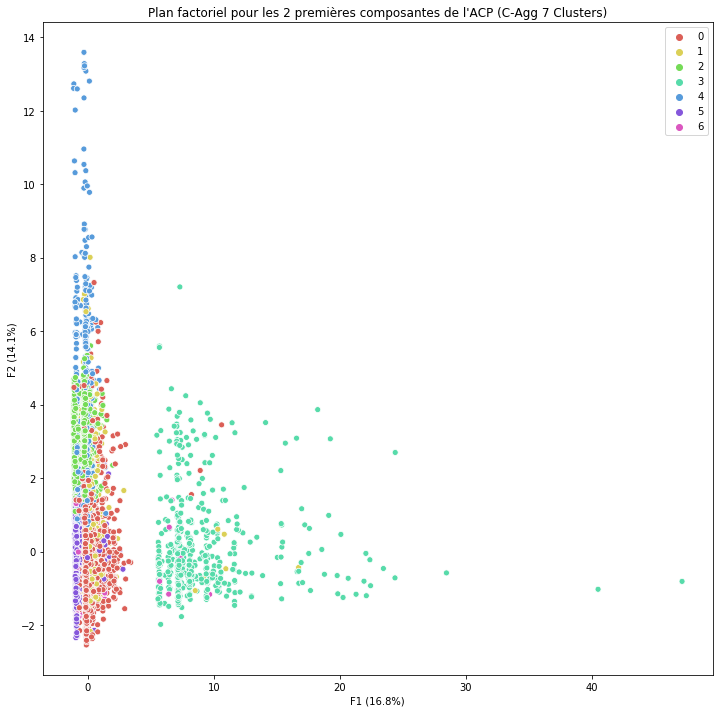

In [598]:
agg_7= cluster.AgglomerativeClustering(n_clusters=7,linkage='ward')
agg_7.fit(first_data_scaled)
fig = plt.figure(figsize=[12,12])


sns.scatterplot(first_data_trans[:,0 ],
                first_data_trans[:,1],
                hue=agg_7.labels_,
                legend='full',
                palette=sns.color_palette("hls", len(np.unique(agg_7.labels_).tolist())))

plt.title("Plan factoriel pour les 2 premières composantes de l'ACP (C-Agg 7 Clusters)")
plt.xlabel('F1 ({}%)'.format(np.around(pca.explained_variance_ratio_[0]*100,1)))
plt.ylabel('F2 ({}%)'.format(np.around(pca.explained_variance_ratio_[1]*100,1)))
plt.legend()

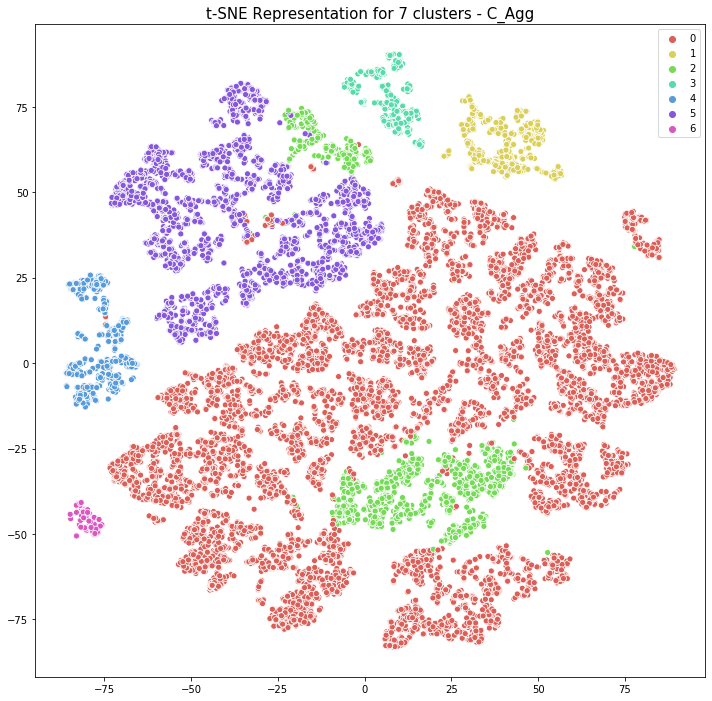

In [629]:
fig = plt.figure(figsize=[12,12])

sns.scatterplot(first_data_TSNE[:,0 ],
                first_data_TSNE[:,1],
                hue=agg_7.labels_,
                legend='full',
                palette=sns.color_palette("hls", 7))
plt.title('t-SNE Representation for 7 clusters - C_Agg',fontsize=15)

plt.legend()

Analysis of clusters using: AgglomerativeClustering(n_clusters=7)
_______________________



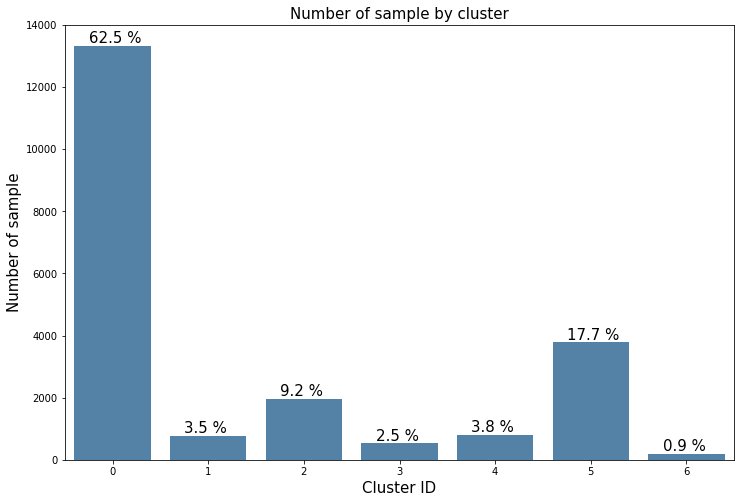

Int64Index([0, 1, 2, 3, 4, 5, 6], dtype='int64')
Cluster ID: 0

Feature with higher values: ['payment_type_credit_card']
Feature with lower values: ['dist_seller_customer', 'payment_type_boleto', 'lat_customer', 'long_customer']


Cluster ID: 1

Feature with higher values: ['multi_payment_types', 'payment_type_credit_card', 'payment_type_voucher', 'lat_customer', 'long_customer']
Feature with lower values: ['payment_type_boleto']


Cluster ID: 2

Feature with higher values: ['dist_seller_customer', 'delivery_lead_time', 'lat_customer', 'long_customer']
Feature with lower values: []


Cluster ID: 3

Feature with higher values: ['nb_of_orders', 'nb_of_items', 'nb_of_reviews', 'payment_value', 'payment_type_boleto', 'payment_type_credit_card']
Feature with lower values: ['recency', 'lat_customer', 'long_customer']


Cluster ID: 4

Feature with higher values: ['dist_seller_customer', 'late_delivery', 'delivery_lead_time', 'lat_customer', 'long_customer']
Feature with lower values: ['review

,features_higher,features_lower
0,['payment_type_credit_card'],"['dist_seller_customer', 'payment_type_boleto'..."
1,"['multi_payment_types', 'payment_type_credit_c...",['payment_type_boleto']
2,"['dist_seller_customer', 'delivery_lead_time',...",[]
3,"['nb_of_orders', 'nb_of_items', 'nb_of_reviews...","['recency', 'lat_customer', 'long_customer']"
4,"['dist_seller_customer', 'late_delivery', 'del...",['review_mean_score']
5,['payment_type_boleto'],"['dist_seller_customer', 'payment_value', 'pay..."
6,['payment_type_debit_card'],"['dist_seller_customer', 'payment_value', 'pay..."


In [630]:
cluster_analysis(agg_7,agg_7.labels_,first_data,0.20)

#### Agglomerative Clustering - 9 Clusters

In [687]:
agg_9= cluster.AgglomerativeClustering(n_clusters=9,linkage='ward')
agg_9.fit(first_data_scaled)

AgglomerativeClustering(n_clusters=9)

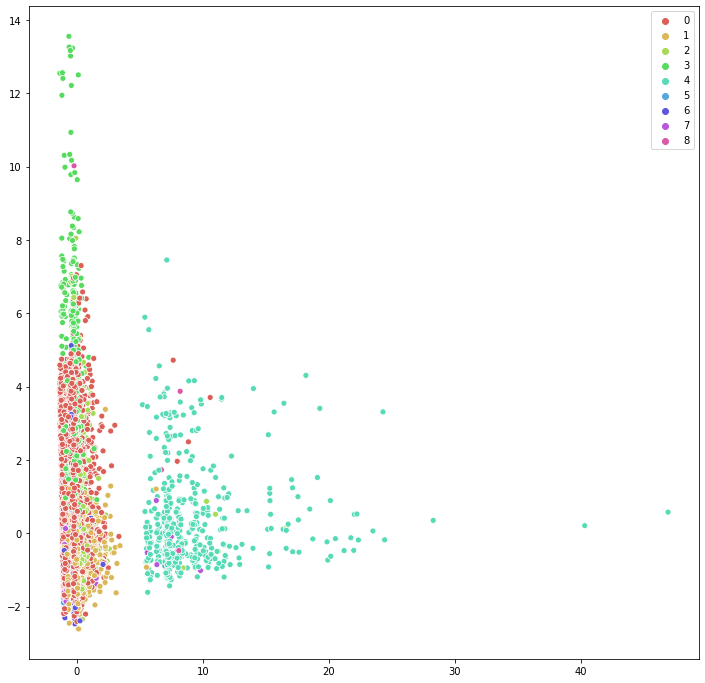

In [688]:
fig = plt.figure(figsize=[12,12])


sns.scatterplot(first_data_trans[:,0 ],
                first_data_trans[:,1],
                hue=agg_9.labels_,
                legend='full',
                palette=sns.color_palette("hls", len(np.unique(agg_9.labels_).tolist())))

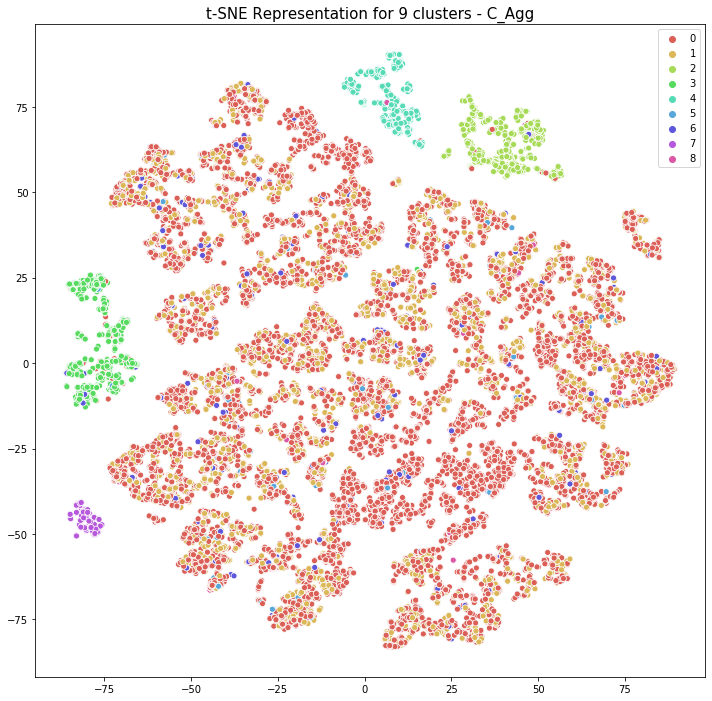

In [689]:
fig = plt.figure(figsize=[12,12])

sns.scatterplot(first_data_TSNE[:,0 ],
                first_data_TSNE[:,1],
                hue=agg_9.labels_,
                legend='full',
                palette=sns.color_palette("hls", 9))
plt.title('t-SNE Representation for 9 clusters - C_Agg',fontsize=15)

plt.legend()

Analysis of clusters using: AgglomerativeClustering(n_clusters=9)
_______________________



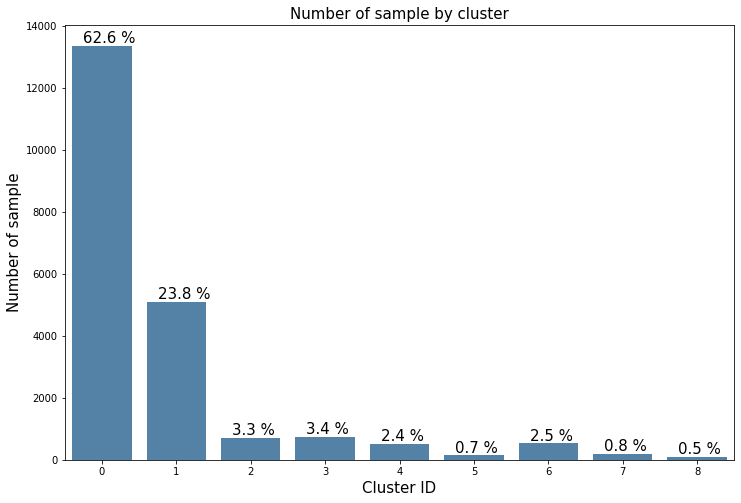

Int64Index([0, 1, 2, 3, 4, 5, 6, 7, 8], dtype='int64')
Cluster ID: 0

Feature with higher values: ['lat_customer']
Feature with lower values: []


Cluster ID: 1

Feature with higher values: ['product_category_name_furniture']
Feature with lower values: ['dist_seller_customer', 'lat_customer', 'long_customer']


Cluster ID: 2

Feature with higher values: ['multi_payment_types', 'payment_type_voucher', 'lat_customer', 'long_customer']
Feature with lower values: []


Cluster ID: 3

Feature with higher values: ['late_delivery', 'delivery_lead_time', 'lat_customer', 'long_customer']
Feature with lower values: ['review_mean_score']


Cluster ID: 4

Feature with higher values: ['nb_of_orders', 'nb_of_items', 'nb_of_reviews', 'payment_value', 'payment_type_credit_card']
Feature with lower values: ['lat_customer', 'long_customer']


Cluster ID: 5

Feature with higher values: ['product_category_name_books']
Feature with lower values: ['product_category_name_furniture']


Cluster ID: 6

Feature w

In [690]:
summary_agg9=cluster_analysis(agg_9,agg_9.labels_,first_data,0.25)

Even if we change the number of clusters, we still have one with more than 62% of the customer, which leaves us with very small other clusters

### DBSCAN

#### Loop to find best setup

In [275]:
min_samp=[1,3,5,7,9]
epsilon=[1,2,5,7,9]
summary_silhouettes=pd.DataFrame(index=range(len(epsilon)*len(min_samp)),
                                 columns=['eps','min_samples','sil','nb_clusters'])

counter=0         
for k in range(len(epsilon)):
         
    for i in range(len(min_samp)):
        summary_silhouettes.iloc[counter,0]= epsilon[k]
        summary_silhouettes.iloc[counter,1]= min_samp[i]
        cls= cluster.DBSCAN(eps=epsilon[k],min_samples=min_samp[i])
        cls.fit(first_data_scaled)
        summary_silhouettes.iloc[counter,2]= metrics.silhouette_score(first_data_scaled,cls.labels_)
        summary_silhouettes.iloc[counter,3]=len(np.unique(cls.labels_).tolist())
        counter+=1

summary_silhouettes

,eps,min_samples,sil,nb_clusters
0,1,1,-0.163533,2226
1,1,3,0.00543526,113
2,1,5,0.0354588,60
3,1,7,0.0336575,44
4,1,9,0.0308664,35
5,2,1,0.140804,515
6,2,3,0.222736,34
7,2,5,0.230956,23
8,2,7,0.231853,19
9,2,9,0.228972,17


In [276]:
summary_silhouettes.sort_values(by='sil',ascending=False)

,eps,min_samples,sil,nb_clusters
17,7,5,0.616222,3
16,7,3,0.615799,4
19,7,9,0.615428,3
18,7,7,0.615428,3
21,9,3,0.61525,5
24,9,9,0.61518,3
23,9,7,0.615117,3
22,9,5,0.615055,3
20,9,1,0.61368,13
15,7,1,0.608472,25


In [113]:
for i in range(5):
    cls= cluster.DBSCAN(eps=9,min_samples=3)
    cls.fit(first_data_scaled)
    print('Loop {}, silhoutte score: {}'.format(i,metrics.silhouette_score(first_data_scaled,cls.labels_)))


Loop 0, silhoutte score: 0.41208221903788433
Loop 1, silhoutte score: 0.41208221903788433
Loop 2, silhoutte score: 0.41208221903788433
Loop 3, silhoutte score: 0.41208221903788433
Loop 4, silhoutte score: 0.41208221903788433


#### DBSCAN Eps=9 MinSamp=3

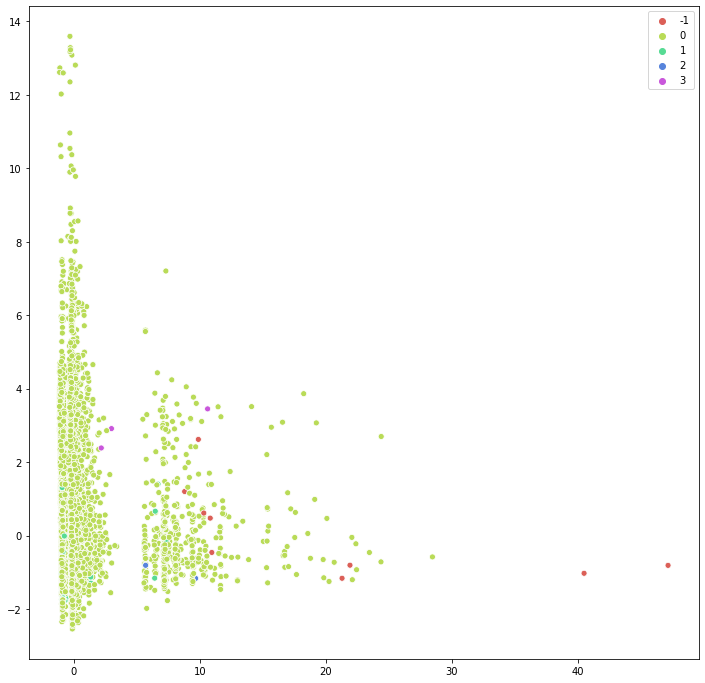

In [277]:
fig = plt.figure(figsize=[12,12])

db_93 = cluster.DBSCAN(eps=9,min_samples=3)
db_93.fit(first_data_scaled)
sns.scatterplot(first_data_trans[:,0 ],
                first_data_trans[:,1],
                hue=db_93.labels_,
                legend='full',
                palette=sns.color_palette("hls", len(np.unique(db_93.labels_).tolist())))

Text(0.5, 1.0, 't-SNE Representation for 5 clusters - DBSCAN')

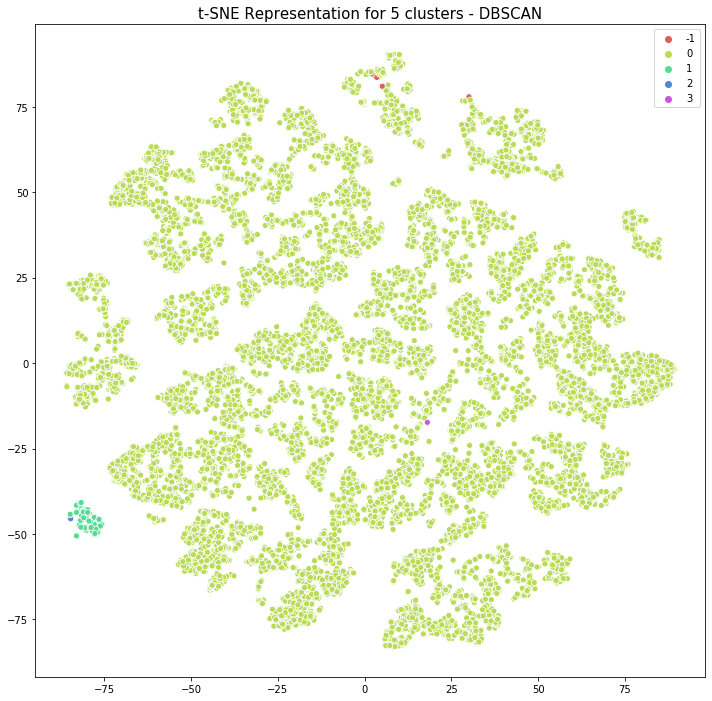

In [602]:
fig = plt.figure(figsize=[12,12])

sns.scatterplot(first_data_TSNE[:,0 ],
                first_data_TSNE[:,1],
                hue=db_93.labels_,
                legend='full',
                palette=sns.color_palette("hls", len(np.unique(db_93.labels_).tolist())))
plt.legend()
plt.title('t-SNE Representation for 5 clusters - DBSCAN',fontsize=15)


Analysis of clusters using: DBSCAN(eps=9, min_samples=3)
_______________________



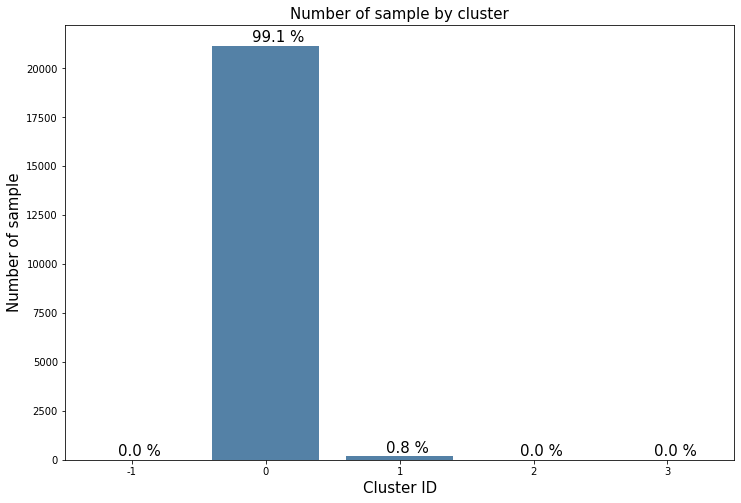

Int64Index([-1, 0, 1, 2, 3], dtype='int64')
Cluster ID: -1

Feature with higher values: ['nb_of_orders', 'nb_of_items', 'nb_of_reviews', 'multi_payment_types', 'payment_value', 'payment_type_boleto', 'payment_type_credit_card', 'payment_type_voucher', 'long_customer']
Feature with lower values: ['dist_seller_customer', 'lat_customer']


Cluster ID: 0

Feature with higher values: []
Feature with lower values: []


Cluster ID: 1

Feature with higher values: ['payment_type_debit_card']
Feature with lower values: ['payment_value', 'payment_type_credit_card', 'lat_customer', 'long_customer']


Cluster ID: 2

Feature with higher values: ['nb_of_orders', 'nb_of_items', 'nb_of_reviews', 'payment_type_debit_card', 'long_customer']
Feature with lower values: ['dist_seller_customer', 'payment_value', 'payment_type_credit_card', 'lat_customer']


Cluster ID: 3

Feature with higher values: ['nb_of_orders', 'recency', 'nb_of_items', 'nb_of_reviews', 'payment_value', 'payment_type_credit_card', 'deli

,features_higher,features_lower
0,[],[]
1,['payment_type_debit_card'],"['payment_value', 'payment_type_credit_card', ..."
2,"['nb_of_orders', 'nb_of_items', 'nb_of_reviews...","['dist_seller_customer', 'payment_value', 'pay..."
3,"['nb_of_orders', 'recency', 'nb_of_items', 'nb...","['lat_customer', 'long_customer']"
4,"['nb_of_orders', 'nb_of_items', 'nb_of_reviews...","['dist_seller_customer', 'lat_customer']"


In [292]:
cluster_analysis(db_93,first_data,0.25)

#### DBSCAN Eps=7 MinSamp=5

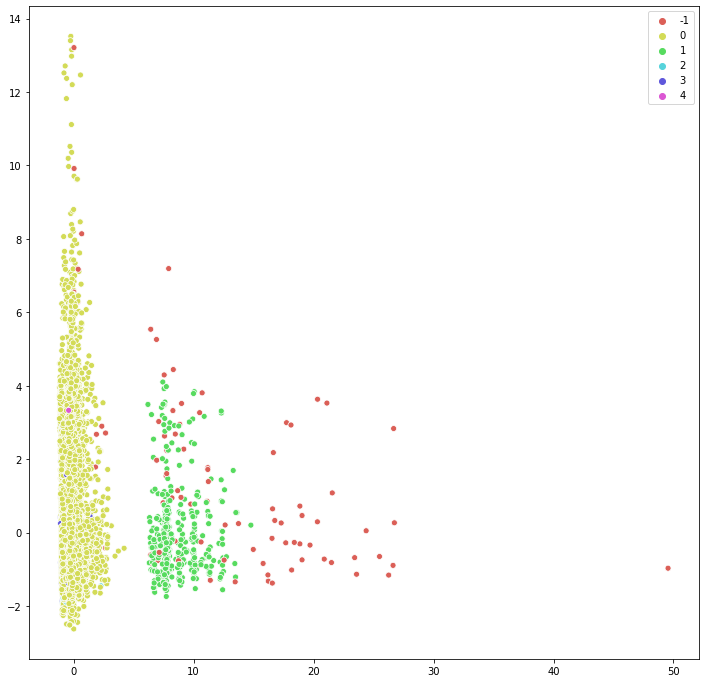

In [116]:
fig = plt.figure(figsize=[12,12])

db_75 = cluster.DBSCAN(eps=7,min_samples=5)
db_75.fit(first_data_scaled)
sns.scatterplot(first_data_trans[:,0 ],
                first_data_trans[:,1],
                hue=db_75.labels_,
                legend='full',
                palette=sns.color_palette("hls", len(np.unique(db_75.labels_).tolist())))

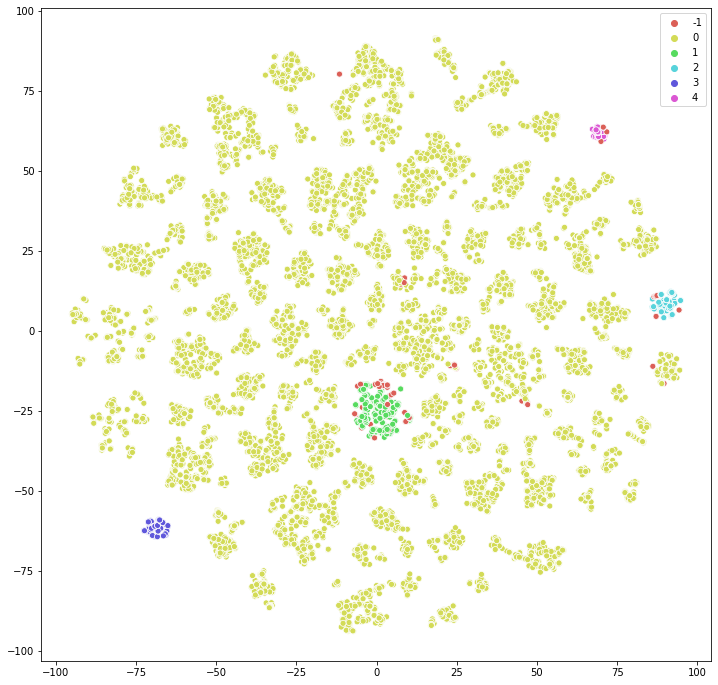

In [119]:
fig = plt.figure(figsize=[12,12])

sns.scatterplot(first_data_TSNE[:,0 ],
                first_data_TSNE[:,1],
                hue=db_75.labels_,
                legend='full',
                palette=sns.color_palette("hls", len(np.unique(db_75.labels_).tolist())))
plt.legend()

Even if we changed the features, the DBSCAN algorithm still provides us with mediocre results

### Result with this dataset

In the end we will keep the K-means 9 clusters solution

# Temporal Study 

The purpose of this section is to observ the behaviour of our clusters over time 

## Testing with data until nov2017

Here we want to compare the results we obtain with data between jan2017 and nov2017 : 
   
   * with the cluster_algorithm we trained in the previous section 
   * with training the same algorithm on this new time-period

In [408]:
data_nov= pd.read_csv("data_nov17.csv",index_col='customer_unique_id')
data_nov.dropna(inplace=True)
data_nov

,nb_of_orders,recency,nb_of_items,dist_seller_customer,product_category_name_art_and_music,product_category_name_baby,product_category_name_books,product_category_name_cosmetic,product_category_name_fashion,product_category_name_food_and_drink,...,purchasing_month_January,purchasing_month_July,purchasing_month_June,purchasing_month_March,purchasing_month_May,purchasing_month_November,purchasing_month_October,purchasing_month_September,lat_customer,long_customer
customer_unique_id,,,,,,,,,,,,,,,,,,,,,
0000f46a3911fa3c0805444483337064,1,2,1.0,517.477152,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,1,0,0,0,0,-27.543787,-48.625680
0000f6ccb0745a6a4b88665a16c9f078,1,0,1.0,2482.055014,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,1,0,-1.311011,-48.482884
0004aac84e0df4da2b147fca70cf8255,1,0,1.0,153.952780,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,1,0,0,-23.504368,-47.466156
0005e1862207bf6ccc02e4228effd9a0,1,2,1.0,245.667440,0.0,0.0,0.0,0.0,1.0,0.0,...,0,0,0,1,0,0,0,0,-22.403254,-43.001980
0006fdc98a402fceb4eb0ee528f6a8d4,1,1,1.0,776.359877,0.0,0.0,0.0,0.0,0.0,0.0,...,0,1,0,0,0,0,0,0,-21.061422,-41.371778
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
fff699c184bcc967d62fa2c6171765f7,1,0,1.0,514.305127,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,1,-23.962450,-46.314988
fffa431dd3fcdefea4b1777d114144f2,1,0,1.0,447.406487,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,1,0,-22.151826,-42.418110
fffcf5a5ff07b0908bd4e2dbc735a684,1,1,2.0,1997.315822,0.0,0.0,0.0,1.0,0.0,0.0,...,0,0,1,0,0,0,0,0,-8.363166,-36.559088


In [409]:
col_to_drop=data_nov.columns[data_nov.columns.str.contains('purchasing_month')
                             |data_nov.columns.str.contains('product_category')
                             |data_nov.columns.str.contains('xmas')]
col_to_drop=col_to_drop.tolist()
col_to_drop
data_nov.drop(columns=col_to_drop,inplace=True)

### Observ cluster caracteristics for both predicted and new fitted clusters

Here we need to observe the two solution's clusters, to be able to compare the couples of similar clusters

In [ ]:
test_labels_nov=cls9.predict(data_nov_scaled)

Analysis of clusters using: KMeans(n_clusters=9)
_______________________



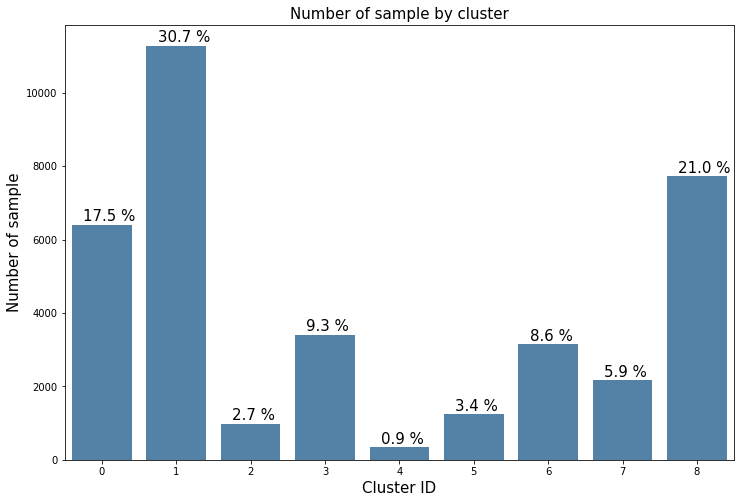

Int64Index([0, 1, 2, 3, 4, 5, 6, 7, 8], dtype='int64')
Cluster ID: 0

Feature with higher values: ['payment_type_boleto']
Feature with lower values: ['payment_type_credit_card', 'lat_customer', 'long_customer']


Cluster ID: 1

Feature with higher values: ['recency']
Feature with lower values: ['dist_seller_customer', 'lat_customer', 'long_customer']


Cluster ID: 2

Feature with higher values: ['nb_of_orders', 'nb_of_items', 'nb_of_reviews', 'payment_value', 'payment_type_credit_card']
Feature with lower values: ['lat_customer']


Cluster ID: 3

Feature with higher values: ['dist_seller_customer', 'payment_value', 'delivery_lead_time', 'lat_customer', 'long_customer']
Feature with lower values: []


Cluster ID: 4

Feature with higher values: ['payment_type_debit_card']
Feature with lower values: ['payment_value', 'payment_type_credit_card', 'lat_customer']


Cluster ID: 5

Feature with higher values: ['multi_payment_types', 'payment_type_voucher', 'lat_customer', 'long_customer']
Feat

,features_higher,features_lower
0,['payment_type_boleto'],"['payment_type_credit_card', 'lat_customer', '..."
1,['recency'],"['dist_seller_customer', 'lat_customer', 'long..."
2,"['nb_of_orders', 'nb_of_items', 'nb_of_reviews...",['lat_customer']
3,"['dist_seller_customer', 'payment_value', 'del...",[]
4,['payment_type_debit_card'],"['payment_value', 'payment_type_credit_card', ..."
5,"['multi_payment_types', 'payment_type_voucher'...",[]
6,[],"['review_mean_score', 'lat_customer', 'long_cu..."
7,"['late_delivery', 'delivery_lead_time', 'lat_c...","['recency', 'review_mean_score']"
8,[],"['recency', 'dist_seller_customer', 'lat_custo..."


In [470]:
cluster_analysis(cls9,test_labels_nov,data_nov,0.25)

In [638]:
test_cls9 = cluster.KMeans(n_clusters=9)
test_cls9.fit(data_nov_scaled)

Analysis of clusters using: KMeans(n_clusters=9)
_______________________



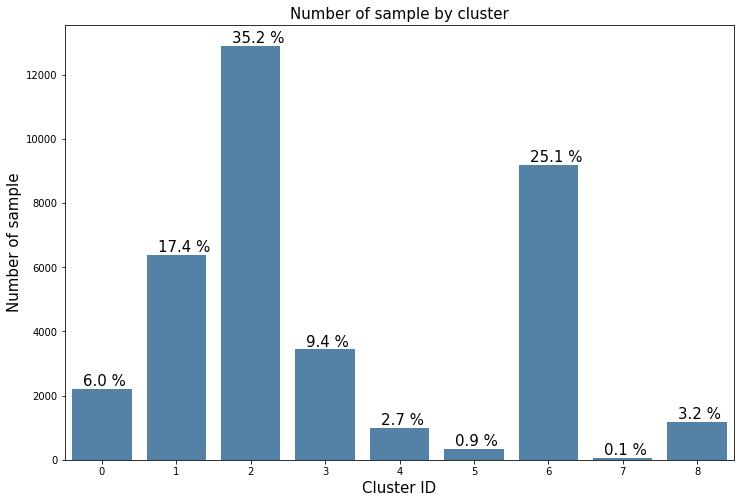

Int64Index([0, 1, 2, 3, 4, 5, 6, 7, 8], dtype='int64')
Cluster ID: 0

Feature with higher values: ['late_delivery', 'delivery_lead_time', 'lat_customer', 'long_customer']
Feature with lower values: ['recency', 'review_mean_score']


Cluster ID: 1

Feature with higher values: ['payment_type_boleto']
Feature with lower values: ['payment_type_credit_card', 'lat_customer', 'long_customer']


Cluster ID: 2

Feature with higher values: ['recency']
Feature with lower values: ['dist_seller_customer', 'lat_customer', 'long_customer']


Cluster ID: 3

Feature with higher values: ['dist_seller_customer', 'payment_value', 'delivery_lead_time', 'lat_customer', 'long_customer']
Feature with lower values: []


Cluster ID: 4

Feature with higher values: ['nb_of_orders', 'nb_of_items', 'nb_of_reviews', 'payment_value', 'payment_type_credit_card']
Feature with lower values: ['lat_customer']


Cluster ID: 5

Feature with higher values: ['payment_type_debit_card']
Feature with lower values: ['payment_valu

,features_higher,features_lower
0,"['late_delivery', 'delivery_lead_time', 'lat_c...","['recency', 'review_mean_score']"
1,['payment_type_boleto'],"['payment_type_credit_card', 'lat_customer', '..."
2,['recency'],"['dist_seller_customer', 'lat_customer', 'long..."
3,"['dist_seller_customer', 'payment_value', 'del...",[]
4,"['nb_of_orders', 'nb_of_items', 'nb_of_reviews...",['lat_customer']
5,['payment_type_debit_card'],"['payment_value', 'payment_type_credit_card', ..."
6,[],"['recency', 'dist_seller_customer', 'lat_custo..."
7,"['recency', 'nb_of_items', 'multi_payment_type...","['dist_seller_customer', 'payment_type_credit_..."
8,"['multi_payment_types', 'payment_type_voucher'...",[]


In [425]:
cluster_analysis(test_cls9,test_cls9.labels_,data_nov,0.25)

### Evaluate clusters difference

We will use 2 methods here : 
   * Rand Score (basically the ratio of matches between labels of first and second solution)
   * Sankey Chart (showing the difference of the clusters of each solution)

In [426]:
print('Adjusted Rand Score: {}'.format(metrics.adjusted_rand_score(test_cls9.labels_,test_labels)))

Adjusted Rand Score: 0.8513350114694752


In [428]:
# Gather the labels of each solution 
predicted_labels = pd.Series(test_labels)
original_labels = pd.Series(test_cls9.labels_)

In [429]:
sankey_df = pd.DataFrame(index=data_nov.index)

In [430]:
sankey_df['predicted']=test_labels
sankey_df['original']=test_cls9.labels_


In [431]:
# For each sample we will check the label of the 1st solution (prediction) and the label of the second (new fitted algorithm)
sankey_df['link'] = sankey_df['predicted'].astype('str')+sankey_df['original'].astype('str')
sankey_df

,predicted,original,link
customer_unique_id,,,
0000f46a3911fa3c0805444483337064,1,2,12
0000f6ccb0745a6a4b88665a16c9f078,3,3,33
0004aac84e0df4da2b147fca70cf8255,8,6,86
0005e1862207bf6ccc02e4228effd9a0,1,2,12
0006fdc98a402fceb4eb0ee528f6a8d4,6,2,62
...,...,...,...
fff699c184bcc967d62fa2c6171765f7,0,1,01
fffa431dd3fcdefea4b1777d114144f2,0,1,01
fffcf5a5ff07b0908bd4e2dbc735a684,3,3,33


In [432]:
sankey_df['link'].value_counts().sort_index(ascending=True)

00       16
01     6385
02        5
10        4
12    11267
13       12
24      984
27        2
30       18
31        1
32        2
33     3381
36       11
45      339
57       48
58     1188
60        1
62     1636
63       42
66     1473
70     2164
78        1
80        7
83        4
86     7710
Name: link, dtype: int64

This table show the corresponding labels of the two solutions. For example :
   * 16 samples have the label 0 in the first solution and 0 in the second
   * 6385 samples have the label 0 in the first solution and 1 in the second
   * 5 samples have the label 0 in the first solution and 2 in the second
    
We will need to establish a title of each cluster for the two solutions to see if these value are matching (here we need to check that label 0 of first solution corresponds to the label 1 of the second solution)

In [433]:
# This list correspond to the labels titles of each solution 
# (can be built thanks to the observation made before)

labels = ['Boleto Users',
          'Non-recent clients',
          'Client with higher purchase volume',
          'Client with high distance-leadtime ',
          'Clients using debit card',
          'Client using both credit card and voucher',
          'General unsatisfied client',
          'Client delivered late',
          'Recent client',
          
          # Second section
          'Client delivered late',
          'Boleto Users ',
          'Non-recent client ',
          'Clients with high distance-leadtime',
          'Client with higher purchase volume ',
          'Clients using debit card',
          'Recent clients ',
          'No idea',
          'Client using both credit card and voucher']



To build a sankey chart we need 4 list : 
   * The labels titles (which we just created)
   * The tranfer between solution 1 and 2 (volume)
   * for each transfer we need the source (id of the label => int from 0 to nb_of_cluster-1)
   * for each transfer we need the target (id of the label + nb_of_cluster)

In [434]:

test = pd.DataFrame(sankey_df['link'].value_counts().sort_index(ascending=True))
test['source']=test.index.str.slice(0, 1)
test['target']=test.index.str.slice(1,2)
test['source']=test['source'].astype('int64')
test['target']=test['target'].astype('int64')
test['target']+=9
test



,link,source,target
00,16,0,9
01,6385,0,10
02,5,0,11
10,4,1,9
12,11267,1,11
13,12,1,12
24,984,2,13
27,2,2,16
30,18,3,9
31,1,3,10


In [435]:
# Here is the construction of our sankey chart 
import plotly.graph_objects as go

fig = go.Figure(data=[go.Sankey(
    node = dict(
      pad = 15,
      thickness = 20,
      line = dict(color = "black", width = 0.5),
      label = labels,
      color = "blue"
    ),
    link = dict(
      source = test.source , # indices correspond to labels, eg A1, A2, A2, B1, ...
      target = test.target,
      value = test.link
  ))])

fig.update_layout(title_text="Transferts from predicted clusters to new fitted clusters",
                  font_size=13,
                  width=1000,
                  height=700)
fig.show()

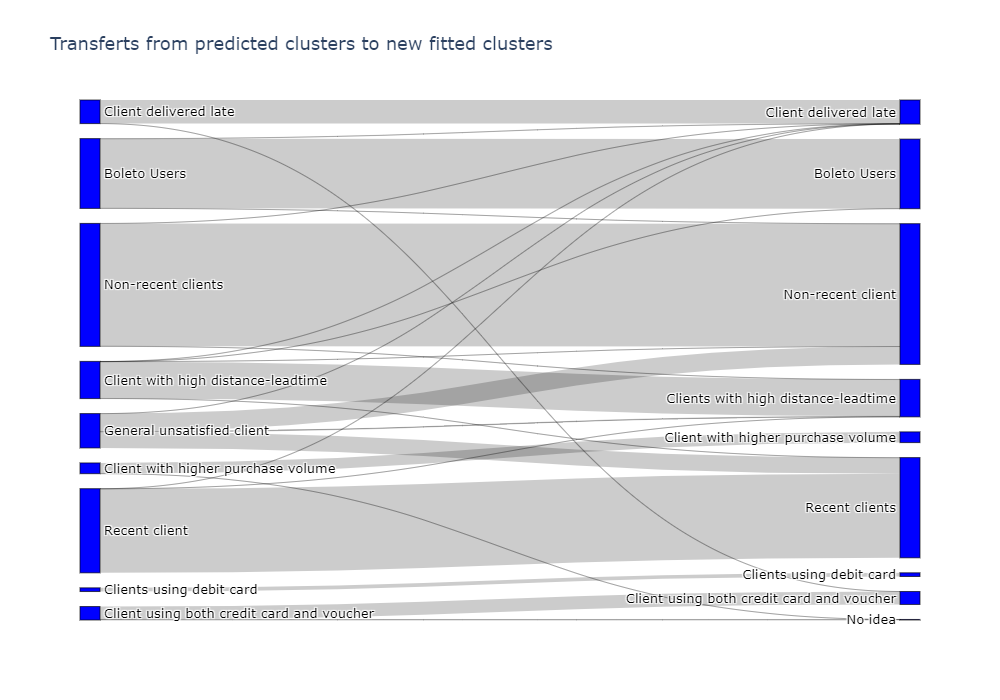

We can see here that the result is quite stable (Rand Score 0.85) +this chart doesn't show much changes

## Testing with data until fev2018

In [553]:
data_fev= pd.read_csv("data_fev18.csv",index_col='customer_unique_id')
data_fev.dropna(inplace=True)
data_fev

,nb_of_orders,recency,nb_of_items,dist_seller_customer,product_category_name_art_and_music,product_category_name_baby,product_category_name_books,product_category_name_cosmetic,product_category_name_fashion,product_category_name_food_and_drink,...,purchasing_month_January,purchasing_month_July,purchasing_month_June,purchasing_month_March,purchasing_month_May,purchasing_month_November,purchasing_month_October,purchasing_month_September,lat_customer,long_customer
customer_unique_id,,,,,,,,,,,,,,,,,,,,,
0000f46a3911fa3c0805444483337064,1,2,1.0,517.477152,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,1,0,0,0,0,-27.543787,-48.625680
0000f6ccb0745a6a4b88665a16c9f078,1,1,1.0,2482.055014,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,1,0,-1.311011,-48.482884
0004aac84e0df4da2b147fca70cf8255,1,1,1.0,153.952780,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,1,0,0,-23.504368,-47.466156
00053a61a98854899e70ed204dd4bafe,1,0,2.0,503.130499,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,-25.429683,-49.274635
0005e1862207bf6ccc02e4228effd9a0,1,2,1.0,245.667440,0.0,0.0,0.0,0.0,1.0,0.0,...,0,0,0,1,0,0,0,0,-22.403254,-43.001980
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
fffbf87b7a1a6fa8b03f081c5f51a201,1,0,1.0,2368.370077,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,-3.749335,-38.523619
fffcf5a5ff07b0908bd4e2dbc735a684,1,2,2.0,1997.315822,0.0,0.0,0.0,1.0,0.0,0.0,...,0,0,1,0,0,0,0,0,-8.363166,-36.559088
fffea47cd6d3cc0a88bd621562a9d061,1,0,1.0,1525.816010,0.0,1.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,-12.221792,-38.962517


In [554]:
col_to_drop=data_fev.columns[data_fev.columns.str.contains('purchasing_month')
                             |data_fev.columns.str.contains('product_category')
                             |data_fev.columns.str.contains('xmas')]
col_to_drop=col_to_drop.tolist()
col_to_drop
data_fev.drop(columns=col_to_drop,inplace=True)

In [555]:
std = StandardScaler()
data_fev_scaled = std.fit_transform(data_fev)

### Observ cluster caracteristics for both predicted and new fitted clusters

Same pattern as the previous section

In [639]:
test_labels_fev=cls9.predict(data_fev_scaled)

Analysis of clusters using: KMeans(n_clusters=9)
_______________________



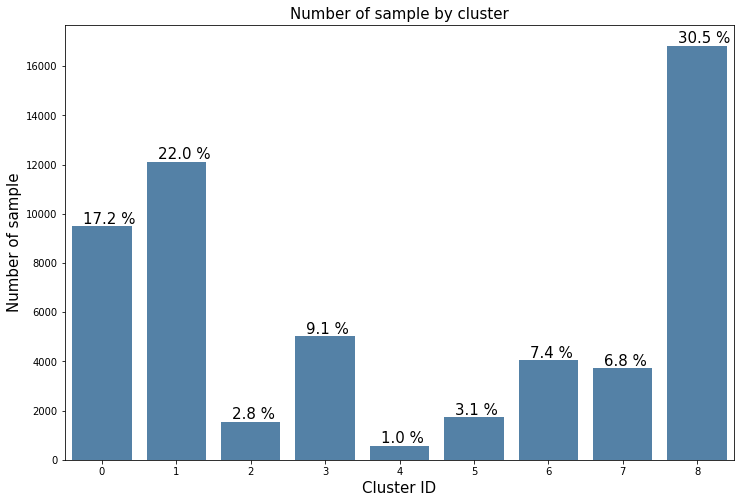

Int64Index([0, 1, 2, 3, 4, 5, 6, 7, 8], dtype='int64')
Cluster ID: 0

Feature with higher values: ['payment_type_boleto']
Feature with lower values: ['payment_type_credit_card', 'lat_customer', 'long_customer']


Cluster ID: 1

Feature with higher values: ['recency']
Feature with lower values: ['dist_seller_customer', 'delivery_lead_time', 'lat_customer', 'long_customer']


Cluster ID: 2

Feature with higher values: ['nb_of_orders', 'nb_of_items', 'nb_of_reviews', 'payment_value', 'payment_type_credit_card']
Feature with lower values: ['lat_customer']


Cluster ID: 3

Feature with higher values: ['dist_seller_customer', 'payment_value', 'delivery_lead_time', 'lat_customer', 'long_customer']
Feature with lower values: []


Cluster ID: 4

Feature with higher values: ['payment_type_debit_card']
Feature with lower values: ['payment_value', 'payment_type_credit_card', 'lat_customer']


Cluster ID: 5

Feature with higher values: ['multi_payment_types', 'payment_type_voucher', 'lat_customer',

,features_higher,features_lower
0,['payment_type_boleto'],"['payment_type_credit_card', 'lat_customer', '..."
1,['recency'],"['dist_seller_customer', 'delivery_lead_time',..."
2,"['nb_of_orders', 'nb_of_items', 'nb_of_reviews...",['lat_customer']
3,"['dist_seller_customer', 'payment_value', 'del...",[]
4,['payment_type_debit_card'],"['payment_value', 'payment_type_credit_card', ..."
5,"['multi_payment_types', 'payment_type_voucher'...",[]
6,[],"['review_mean_score', 'lat_customer', 'long_cu..."
7,"['late_delivery', 'delivery_lead_time', 'lat_c...","['recency', 'review_mean_score']"
8,[],"['recency', 'dist_seller_customer', 'lat_custo..."


In [558]:
cluster_analysis(cls9,test_labels_fev,data_fev,0.25)

In [640]:
test_cls9 = cluster.KMeans(n_clusters=9)
test_cls9.fit(data_fev_scaled)

Analysis of clusters using: KMeans(n_clusters=9)
_______________________



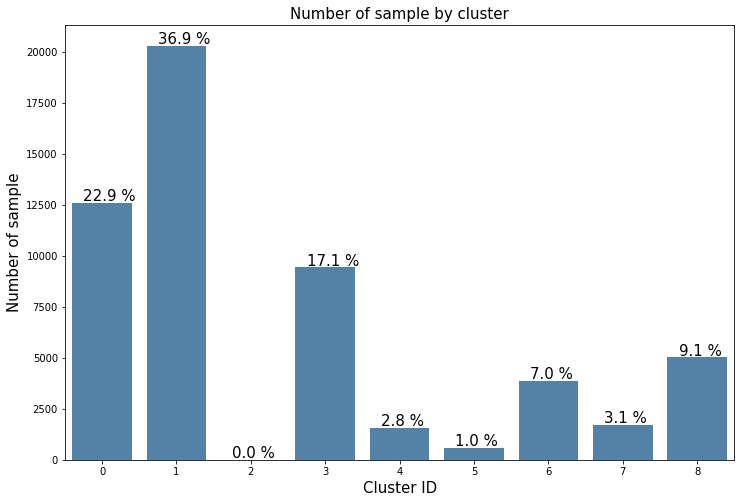

Int64Index([0, 1, 2, 3, 4, 5, 6, 7, 8], dtype='int64')
Cluster ID: 0

Feature with higher values: []
Feature with lower values: ['recency', 'dist_seller_customer', 'lat_customer', 'long_customer']


Cluster ID: 1

Feature with higher values: ['recency']
Feature with lower values: ['dist_seller_customer', 'delivery_lead_time', 'lat_customer', 'long_customer']


Cluster ID: 2

Feature with higher values: ['nb_of_orders', 'nb_of_items', 'nb_of_reviews', 'payment_value', 'payment_type_boleto', 'payment_type_credit_card', 'late_delivery', 'lat_customer', 'long_customer']
Feature with lower values: ['recency']


Cluster ID: 3

Feature with higher values: ['payment_type_boleto']
Feature with lower values: ['payment_type_credit_card', 'lat_customer', 'long_customer']


Cluster ID: 4

Feature with higher values: ['nb_of_orders', 'nb_of_items', 'nb_of_reviews', 'payment_value', 'payment_type_credit_card']
Feature with lower values: ['lat_customer']


Cluster ID: 5

Feature with higher values: ['

,features_higher,features_lower
0,[],"['recency', 'dist_seller_customer', 'lat_custo..."
1,['recency'],"['dist_seller_customer', 'delivery_lead_time',..."
2,"['nb_of_orders', 'nb_of_items', 'nb_of_reviews...",['recency']
3,['payment_type_boleto'],"['payment_type_credit_card', 'lat_customer', '..."
4,"['nb_of_orders', 'nb_of_items', 'nb_of_reviews...",['lat_customer']
5,['payment_type_debit_card'],"['payment_value', 'payment_type_credit_card', ..."
6,"['late_delivery', 'delivery_lead_time', 'lat_c...","['recency', 'review_mean_score']"
7,"['multi_payment_types', 'payment_type_voucher'...",[]
8,"['dist_seller_customer', 'payment_value', 'del...",[]


In [560]:
cluster_analysis(test_cls9,test_cls9.labels_,data_fev,0.25)

### Evaluate cluster difference

In [563]:
print('Adjusted Rand Score: {}'.format(metrics.adjusted_rand_score(test_cls9.labels_,test_labels_fev)))

Adjusted Rand Score: 0.5837009151575708


In [568]:
predicted_labels = pd.Series(test_labels_fev)
original_labels = pd.Series(test_cls9.labels_)

In [569]:
sankey_df = pd.DataFrame(index=data_fev.index)

In [570]:
sankey_df['predicted']=test_labels_fev
sankey_df['original']=test_cls9.labels_


In [571]:
sankey_df['link'] = sankey_df['predicted'].astype('str')+sankey_df['original'].astype('str')
sankey_df

,predicted,original,link
customer_unique_id,,,
0000f46a3911fa3c0805444483337064,1,1,11
0000f6ccb0745a6a4b88665a16c9f078,3,8,38
0004aac84e0df4da2b147fca70cf8255,8,1,81
00053a61a98854899e70ed204dd4bafe,6,0,60
0005e1862207bf6ccc02e4228effd9a0,1,1,11
...,...,...,...
fffbf87b7a1a6fa8b03f081c5f51a201,3,8,38
fffcf5a5ff07b0908bd4e2dbc735a684,3,8,38
fffea47cd6d3cc0a88bd621562a9d061,3,8,38


In [572]:
sankey_df['link'].value_counts().sort_index(ascending=True)

01        4
03     9426
06       68
08        2
10       27
11    12052
16       21
18       22
22       11
24     1543
27        1
30       25
31       19
33        6
36       36
38     4931
45      575
54        3
56        2
57     1727
60     2638
61     1357
66        7
68       56
74        8
76     3716
78        1
80     9914
81     6881
86       30
88       12
Name: link, dtype: int64

In [577]:
labels = ['Boleto Users',
          'Non-recent clients',
          'Client with higher purchase volume',
          'Client with high distance-leadtime ',
          'Clients using debit card',
          'Client using both credit card and voucher',
          'General unsatisfied client',
          'Client delivered late',
          'Recent client',
          
          # Second section
          'Recent client',
          'Non-recent client ',
          'Too small cluster ',
          'Boleto Users ',
          'Client with higher purchase volume ',
          'Clients using debit card',
          'Client delivered late ',
          'Client using both credit card and voucher',
          'Client with high distance-leadtime']



In [574]:
test = pd.DataFrame(sankey_df['link'].value_counts().sort_index(ascending=True))
test['source']=test.index.str.slice(0, 1)
test['target']=test.index.str.slice(1,2)
test['source']=test['source'].astype('int64')
test['target']=test['target'].astype('int64')
test['target']+=9
test



,link,source,target
01,4,0,10
03,9426,0,12
06,68,0,15
08,2,0,17
10,27,1,9
11,12052,1,10
16,21,1,15
18,22,1,17
22,11,2,11
24,1543,2,13


In [578]:
import plotly.graph_objects as go

fig = go.Figure(data=[go.Sankey(
    node = dict(
      pad = 15,
      thickness = 20,
      line = dict(color = "black", width = 0.5),
      label = labels,
      color = "blue"
    ),
    link = dict(
      source = test.source , # indices correspond to labels, eg A1, A2, A2, B1, ...
      target = test.target,
      value = test.link
  ))])

fig.update_layout(title_text="Transferts from predicted clusters to new fitted clusters",
                  font_size=13,
                  width=1000,
                  height=700)
fig.show()

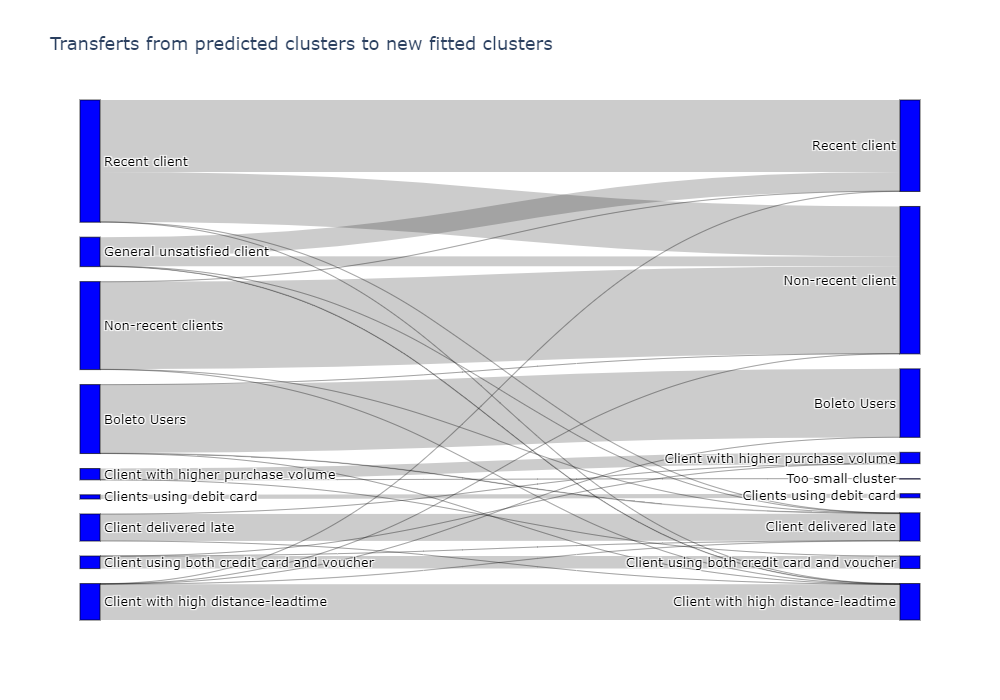

Here the changes looks more important (rand score 0.58) and it seems like we have more transfers

## Overview evolution from aug17 to may18

### Loading may18

In [453]:
data_may= pd.read_csv("data_may18.csv",index_col='customer_unique_id')
data_may.dropna(inplace=True)
data_may

,nb_of_orders,recency,nb_of_items,dist_seller_customer,product_category_name_art_and_music,product_category_name_baby,product_category_name_books,product_category_name_cosmetic,product_category_name_fashion,product_category_name_food_and_drink,...,purchasing_month_January,purchasing_month_July,purchasing_month_June,purchasing_month_March,purchasing_month_May,purchasing_month_November,purchasing_month_October,purchasing_month_September,lat_customer,long_customer
customer_unique_id,,,,,,,,,,,,,,,,,,,,,
0000366f3b9a7992bf8c76cfdf3221e2,1,0,1.0,109.221890,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,1,0,0,0,-23.335331,-46.828647
0000b849f77a49e4a4ce2b2a4ca5be3f,1,0,1.0,22.835438,0.0,0.0,0.0,1.0,0.0,0.0,...,0,0,0,0,1,0,0,0,-23.567395,-46.792957
0000f46a3911fa3c0805444483337064,1,2,1.0,517.477152,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,1,0,0,0,0,-27.543787,-48.625680
0000f6ccb0745a6a4b88665a16c9f078,1,2,1.0,2482.055014,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,1,0,-1.311011,-48.482884
0004aac84e0df4da2b147fca70cf8255,1,2,1.0,153.952780,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,1,0,0,-23.504368,-47.466156
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
fffcf5a5ff07b0908bd4e2dbc735a684,1,2,2.0,1997.315822,0.0,0.0,0.0,1.0,0.0,0.0,...,0,0,1,0,0,0,0,0,-8.363166,-36.559088
fffea47cd6d3cc0a88bd621562a9d061,1,1,1.0,1525.816010,0.0,1.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,-12.221792,-38.962517
ffff371b4d645b6ecea244b27531430a,1,2,1.0,1525.962972,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,-11.829317,-55.496443


In [454]:
col_to_drop=data_may.columns[data_may.columns.str.contains('purchasing_month')
                             |data_may.columns.str.contains('product_category')
                             |data_may.columns.str.contains('xmas')]
col_to_drop=col_to_drop.tolist()
col_to_drop
data_may.drop(columns=col_to_drop,inplace=True)

In [455]:
std = StandardScaler()
data_may_scaled = std.fit_transform(data_may)

In [641]:
test_labels_may=cls9.predict(data_may_scaled)

Analysis of clusters using: KMeans(n_clusters=9)
_______________________



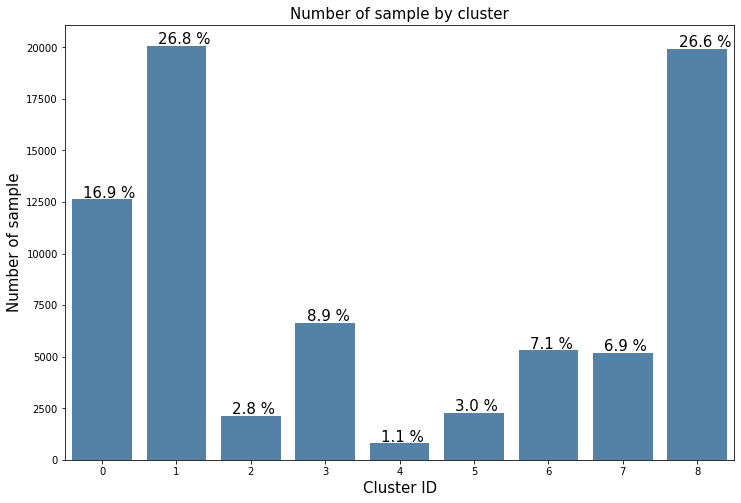

Int64Index([0, 1, 2, 3, 4, 5, 6, 7, 8], dtype='int64')
Cluster ID: 0

Feature with higher values: ['payment_type_boleto']
Feature with lower values: ['payment_type_credit_card', 'lat_customer', 'long_customer']


Cluster ID: 1

Feature with higher values: ['recency']
Feature with lower values: ['dist_seller_customer', 'delivery_lead_time', 'lat_customer', 'long_customer']


Cluster ID: 2

Feature with higher values: ['nb_of_orders', 'nb_of_items', 'nb_of_reviews', 'payment_value', 'payment_type_credit_card']
Feature with lower values: ['lat_customer']


Cluster ID: 3

Feature with higher values: ['dist_seller_customer', 'payment_value', 'delivery_lead_time', 'lat_customer', 'long_customer']
Feature with lower values: []


Cluster ID: 4

Feature with higher values: ['payment_type_debit_card']
Feature with lower values: ['payment_value', 'payment_type_credit_card', 'lat_customer']


Cluster ID: 5

Feature with higher values: ['multi_payment_types', 'payment_type_voucher', 'lat_customer',

,features_higher,features_lower
0,['payment_type_boleto'],"['payment_type_credit_card', 'lat_customer', '..."
1,['recency'],"['dist_seller_customer', 'delivery_lead_time',..."
2,"['nb_of_orders', 'nb_of_items', 'nb_of_reviews...",['lat_customer']
3,"['dist_seller_customer', 'payment_value', 'del...",[]
4,['payment_type_debit_card'],"['payment_value', 'payment_type_credit_card', ..."
5,"['multi_payment_types', 'payment_type_voucher'...",[]
6,[],"['dist_seller_customer', 'review_mean_score', ..."
7,"['dist_seller_customer', 'late_delivery', 'del...",['review_mean_score']
8,[],"['recency', 'dist_seller_customer', 'lat_custo..."


In [477]:
cluster_analysis(cls9,test_labels_may,data_may,0.25)

### Create study from aug17 to may18

In [ ]:
#Create a table with sample as index + labels for each period

In [491]:
sankey_df1 = pd.DataFrame(index=first_data.index)
sankey_df2 = pd.DataFrame(index=data_nov.index)
sankey_df3 = pd.DataFrame(index=data_fev.index)
sankey_df4 = pd.DataFrame(index=data_may.index)

In [492]:
sankey_df1['origin']=cls9.labels_

In [526]:
sankey_df2['origin']=test_labels_nov


In [494]:
sankey_df3['origin']=test_labels_fev


In [495]:
sankey_df4['origin']=test_labels_may


In [496]:
sankey_df4['origin']

customer_unique_id
0000366f3b9a7992bf8c76cfdf3221e2    8
0000b849f77a49e4a4ce2b2a4ca5be3f    8
0000f46a3911fa3c0805444483337064    1
0000f6ccb0745a6a4b88665a16c9f078    3
0004aac84e0df4da2b147fca70cf8255    1
                                   ..
fffcf5a5ff07b0908bd4e2dbc735a684    3
fffea47cd6d3cc0a88bd621562a9d061    3
ffff371b4d645b6ecea244b27531430a    1
ffff5962728ec6157033ef9805bacc48    8
ffffd2657e2aad2907e67c3e9daecbeb    1
Name: origin, Length: 74929, dtype: int32

Here the function will execute the following task : 
   * Create and return the same table as previously i.e. a dataframe with "links, sources, target"

Function parameters: 
   * df1 : df with labels for the start of the period
   * df2 : df with labels for the end of the period
   * nb_cluster : number of clusters used here (here will be 9)
   * base_add : as we want to create the link target and source for each period, the first period cluster will be from 0 to (nb_cluster-1) the next period will add nb_cluster and so on. So when we build for example the second_to_third period, we will start at the second number of period (here it will be 1 as the first is 0)
   

  

In [514]:
def sankey_link_table(df1,df2,nb_cluster,base_add):
    
    sankey_table = df1.copy()
    sankey_table = sankey_table.merge(df2,how='left',left_index=True,right_index=True)
    sankey_table['link'] = sankey_table.iloc[:,0].astype('str')+sankey_table.iloc[:,1].astype('str')
    
    to_return = pd.DataFrame(sankey_table['link'].value_counts().sort_index(ascending=True))
    to_return['source']=to_return.index.str.slice(0, 1)
    to_return['target']=to_return.index.str.slice(1,2)
    to_return['source']=to_return['source'].astype('int64')
    to_return['target']=to_return['target'].astype('int64')
    to_return['source']+=base_add*nb_cluster
    to_return['target']+=(base_add+1)*nb_cluster
    
    return to_return

In [511]:
test = sankey_df1.merge(sankey_df2,how='left',left_index=True,right_index=True)
test['link'] = test.iloc[:,0].astype('str')+test.iloc[:,1].astype('str')
test
hello = pd.DataFrame(test['link'].value_counts().sort_index(ascending=True))
hello

,link
00,3853
02,27
11,5307
12,40
13,6
15,2
21,1
22,523
25,1
31,25


In [504]:
test
test['link'] = test.iloc[:,0].astype('str')+test.iloc[:,1].astype('str')
test

,origin_x,origin_y,link
customer_unique_id,,,
0000f46a3911fa3c0805444483337064,6,1,61
0005e1862207bf6ccc02e4228effd9a0,1,1,11
0006fdc98a402fceb4eb0ee528f6a8d4,6,6,66
000a5ad9c4601d2bbdd9ed765d5213b3,8,1,81
000de6019bb59f34c099a907c151d855,6,6,66
...,...,...,...
fff1afc79f6b5db1e235a4a6c30ceda7,8,1,81
fff3a9369e4b7102fab406a334a678c3,8,1,81
fffcf5a5ff07b0908bd4e2dbc735a684,3,3,33


In [527]:
link1=sankey_link_table(sankey_df1,sankey_df2,9,0)
link2=sankey_link_table(sankey_df2,sankey_df3,9,1)
link3=sankey_link_table(sankey_df3,sankey_df4,9,2)


In [538]:
link1=sankey_link_table(sankey_df1,sankey_df2,9,0)


In [540]:
link1

,link,source,target
00,3853,0,9
02,27,0,11
11,5307,1,10
12,40,1,11
13,6,1,12
15,2,1,14
21,1,2,10
22,523,2,11
25,1,2,14
31,25,3,10


Finally we need to merge all the created table into a unique one to be used to built the sankey chart 

In [541]:
link_total = link1.append(link2)
link_total = link_total.append(link3)
link_total

,link,source,target
00,3853,0,9
02,27,0,11
11,5307,1,10
12,40,1,11
13,6,1,12
...,...,...,...
82,133,26,29
83,90,26,30
84,2,26,31
86,788,26,33


In [ ]:
# Also creating the labels title for each period

In [542]:
labels = ['Aug Boleto Users',
          'Aug Non-recent clients',
          'Aug Client with higher purchase volume',
          'Aug Client with high distance-leadtime ',
          'Aug Clients using debit card',
          'Aug Client using both credit card and voucher',
          'Aug General unsatisfied client',
          'Aug Client delivered late',
          'Aug Recent client',
          
          # Second section
          'Nov Boleto Users',
          'Nov Non-recent client  ',
          'Nov Client with higher purchase volume ',
          'Nov Clients with high distance-leadtime',
          'Nov Clients using debit card',
          'Nov Client using both credit card and voucher',
          'Nov General unsatisfied client',
          'Nov Client delivered late',
          'Nov Recent client',
          
          
          # third section
          'Fev Boleto Users',
          'Fev Non-recent client  ',
          'Fev Client with higher purchase volume ',
          'Fev Clients with high distance-leadtime',
          'Fev Clients using debit card',
          'Fev Client using both credit card and voucher',
          'Fev General unsatisfied client',
          'Fev Client delivered late',
          'Fev Recent client',
          
          # Fourth section
          'May Boleto Users',
          'May Non-recent client  ',
          'May Client with higher purchase volume ',
          'May Clients with high distance-leadtime',
          'May Clients using debit card',
          'May Client using both credit card and voucher',
          'May General unsatisfied client',
          'May Client delivered late',
          'May Recent client']



In [507]:
sankey_df1

,origin
customer_unique_id,
0000f46a3911fa3c0805444483337064,6
0005e1862207bf6ccc02e4228effd9a0,1
0006fdc98a402fceb4eb0ee528f6a8d4,6
000a5ad9c4601d2bbdd9ed765d5213b3,8
000de6019bb59f34c099a907c151d855,6
...,...
fff1afc79f6b5db1e235a4a6c30ceda7,8
fff3a9369e4b7102fab406a334a678c3,8
fffcf5a5ff07b0908bd4e2dbc735a684,3


In [543]:
import plotly.graph_objects as go

fig = go.Figure(data=[go.Sankey(
    node = dict(
      pad = 15,
      thickness = 20,
      line = dict(color = "black", width = 0.5),
      label = labels,
      color = "blue"
    ),
    link = dict(
      source = link_total.source , # indices correspond to labels, eg A1, A2, A2, B1, ...
      target = link_total.target,
      value = link_total.link
  ))])

fig.update_layout(title_text="Evolution of customer per cluster from august17 to may18 ",
                  font_size=13,
                  width=1400,
                  height=900)
fig.show()

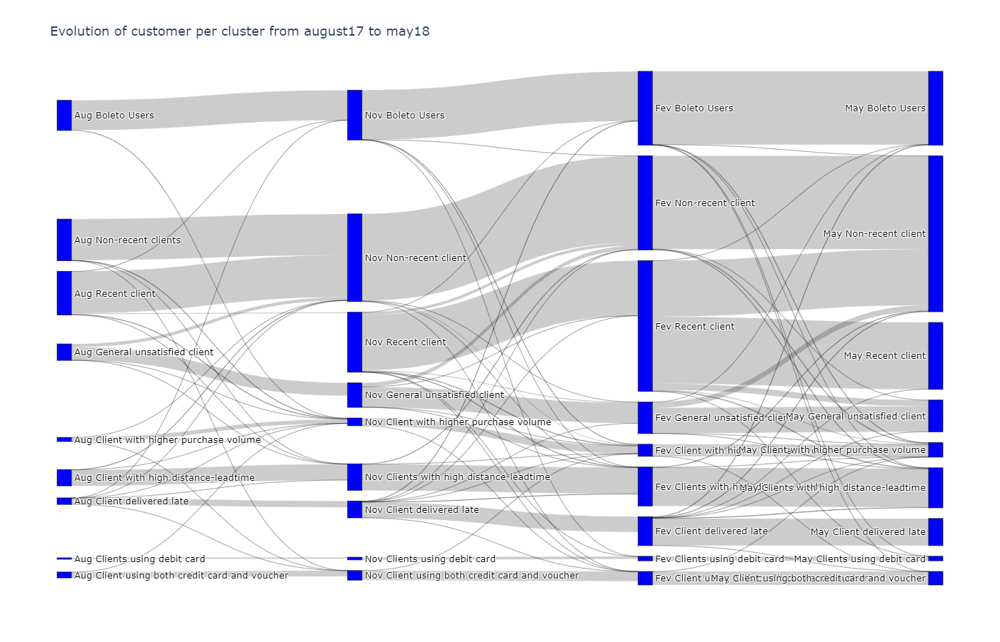

Here we can observ every 3 month the recency clusters are changing (which is logic by construction)
To sum up: 
   * we have seen that our predicted vs new fitted cluster are changing between 3 and 6 months
   * the algorithm needs to be run at least every 3 month because of the recency feature 

In the end I recommand to update the algorithm every 3 month this way we do not have to much variation and we make sure the run for recency is achieved